In [ ]:
import pandas as pd
import numpy as np
import io
import os

**Load The Dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Read the CSV file into a DataFrame
file_path = '/content/drive/My Drive/Motor_Vehicle_Collisions_-_Crashes.csv'
raw_dataset = pd.read_csv(file_path)
raw_dataset

<ipython-input-5-ed58de693ecb>:3: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  raw_dataset = pd.read_csv(file_path)


,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,09/11/2021,2:39,NaN,NaN,NaN,NaN,NaN,WHITESTONE EXPRESSWAY,20 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4455765,Sedan,Sedan,NaN,NaN,NaN
1,03/26/2022,11:45,NaN,NaN,NaN,NaN,NaN,QUEENSBORO BRIDGE UPPER,NaN,NaN,...,NaN,NaN,NaN,NaN,4513547,Sedan,NaN,NaN,NaN,NaN
2,06/29/2022,6:55,NaN,NaN,NaN,NaN,NaN,THROGS NECK BRIDGE,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4541903,Sedan,Pick-up Truck,NaN,NaN,NaN
3,09/11/2021,9:35,BROOKLYN,11208.0,40.667202,-73.866500,"(40.667202, -73.8665)",NaN,NaN,1211 LORING AVENUE,...,NaN,NaN,NaN,NaN,4456314,Sedan,NaN,NaN,NaN,NaN
4,12/14/2021,8:13,BROOKLYN,11233.0,40.683304,-73.917274,"(40.683304, -73.917274)",SARATOGA AVENUE,DECATUR STREET,NaN,...,NaN,NaN,NaN,NaN,4486609,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2034946,09/19/2023,15:55,NaN,NaN,40.761436,-73.761760,"(40.761436, -73.76176)",NORTHERN BOULEVARD,NaN,NaN,...,Driver Inattention/Distraction,NaN,NaN,NaN,4663574,2 dr sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN
2034947,09/14/2023,23:15,MANHATTAN,10016.0,40.744064,-73.987755,"(40.744064, -73.987755)",WEST 27 STREET,5 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4664015,Sedan,NaN,NaN,NaN,NaN
2034948,09/12/2023,16:00,QUEENS,11433.0,40.707947,-73.783310,"(40.707947, -73.78331)",JAMAICA AVENUE,178 STREET,NaN,...,NaN,NaN,NaN,NaN,4664202,Sedan,NaN,NaN,NaN,NaN
2034949,09/19/2023,10:45,NaN,NaN,40.840230,-73.880104,"(40.84023, -73.880104)",EAST TREMONT AVENUE,BOSTON ROAD,NaN,...,Unspecified,NaN,NaN,NaN,4663887,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN


The dataset contains 2040203 rows/observations and 29 columns/variables. Here, each row represents an accident from a police report.

In [ ]:
raw_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2034951 entries, 0 to 2034950
Data columns (total 29 columns):
 #   Column                         Dtype  
---  ------                         -----  
 0   CRASH DATE                     object 
 1   CRASH TIME                     object 
 2   BOROUGH                        object 
 3   ZIP CODE                       object 
 4   LATITUDE                       float64
 5   LONGITUDE                      float64
 6   LOCATION                       object 
 7   ON STREET NAME                 object 
 8   CROSS STREET NAME              object 
 9   OFF STREET NAME                object 
 10  NUMBER OF PERSONS INJURED      float64
 11  NUMBER OF PERSONS KILLED       float64
 12  NUMBER OF PEDESTRIANS INJURED  int64  
 13  NUMBER OF PEDESTRIANS KILLED   int64  
 14  NUMBER OF CYCLIST INJURED      int64  
 15  NUMBER OF CYCLIST KILLED       int64  
 16  NUMBER OF MOTORIST INJURED     int64  
 17  NUMBER OF MOTORIST KILLED      int64  
 18  CO

In [ ]:
raw_dataset.drop_duplicates(inplace=True)
print("Number of records after removing duplicates:", len(raw_dataset))

Number of records after removing duplicates: 2034951


In [ ]:
raw_dataset.isna().sum()

CRASH DATE                             0
CRASH TIME                             0
BOROUGH                           633069
ZIP CODE                          633311
LATITUDE                          230953
LONGITUDE                         230953
LOCATION                          230953
ON STREET NAME                    429414
CROSS STREET NAME                 763979
OFF STREET NAME                  1697910
NUMBER OF PERSONS INJURED             18
NUMBER OF PERSONS KILLED              31
NUMBER OF PEDESTRIANS INJURED          0
NUMBER OF PEDESTRIANS KILLED           0
NUMBER OF CYCLIST INJURED              0
NUMBER OF CYCLIST KILLED               0
NUMBER OF MOTORIST INJURED             0
NUMBER OF MOTORIST KILLED              0
CONTRIBUTING FACTOR VEHICLE 1       6452
CONTRIBUTING FACTOR VEHICLE 2     311687
CONTRIBUTING FACTOR VEHICLE 3    1890343
CONTRIBUTING FACTOR VEHICLE 4    2002466
CONTRIBUTING FACTOR VEHICLE 5    2026158
COLLISION_ID                           0
VEHICLE TYPE COD

In [ ]:
raw_dataset.describe(include='all')

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
count,2034951,2034951,1401882,1401640.0,1.803998e+06,1.803998e+06,1803998,1605537,1270972,337041,...,1723264,144608,32485,8793,2.034951e+06,2022011,1652518,139510,31395,8526
unique,4125,1440,5,425.0,NaN,NaN,276765,18143,20121,218510,...,61,51,41,30,NaN,1580,1761,250,99,68
top,01/21/2014,16:00,BROOKLYN,11207.0,NaN,NaN,"(0.0, 0.0)",BROADWAY,3 AVENUE,772 EDGEWATER ROAD,...,Unspecified,Unspecified,Unspecified,Unspecified,NaN,Sedan,Sedan,Sedan,Sedan,Sedan
freq,1161,28094,445129,20065.0,NaN,NaN,4273,17277,9843,402,...,1450848,134828,30656,8290,NaN,558206,393040,42773,10342,2907
mean,NaN,NaN,NaN,NaN,4.062770e+01,-7.375218e+01,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,3.129152e+06,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,1.981233e+00,3.727029e+00,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.504299e+06,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,0.000000e+00,-2.013600e+02,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,2.200000e+01,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,4.066790e+01,-7.397492e+01,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,3.144858e+06,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,4.072096e+01,-7.392732e+01,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,3.653705e+06,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,4.076956e+01,-7.386670e+01,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,4.162688e+06,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Here, We are just making a copy of 'raw_dataset' to 'data'. So, that if we loose any data in the future during analysis. We can still recover it.
data = pd.DataFrame(raw_dataset)

In [ ]:
# Get value counts for each column
for column in data.columns:
    value_counts = data[column].value_counts()
    print(f"Value counts for column '{column}':\n{value_counts}\n")

Streaming output truncated to the last 5000 lines.
40.894474       1
40.672280       1
40.707979       1
40.595005       1
40.755179       1
40.560600       1
40.592380       1
40.813332       1
40.605846       1
40.732622       1
40.712057       1
40.612033       1
40.564083       1
40.781498       1
40.648594       1
40.763307       1
40.760042       1
40.562360       1
40.831940       1
40.859495       1
40.785074       1
40.801907       1
40.842448       1
40.614403       1
40.668997       1
40.676736       1
40.827766       1
40.804058       1
40.658688       1
40.823478       1
40.845844       1
40.577067       1
40.796338       1
40.799778       1
40.683129       1
40.569393       1
40.582667       1
40.568592       1
40.860073       1
40.651180       1
40.706809       1
40.848510       1
40.615746       1
40.776650       1
40.708920       1
40.742799       1
40.730967       1
40.754482       1
40.688270       1
40.577892       1
40.761347       1
40.650300       1
40.692011    

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Value counts for column 'CROSS STREET NAME':
3 Avenue                            16422
Broadway                            15865
2 Avenue                            13292
5 Avenue                            10724
7 Avenue                             9950
8 Avenue                             9699
1 Avenue                             8569
Park Avenue                          8047
Lexington Avenue                     6633
9 Avenue                             5979
Linden Boulevard                     5961
Madison Avenue                       5557
Atlantic Avenue                      5551
10 Avenue                            5426
6 Avenue                             5337
Northern Boulevard                   5096
Jamaica Avenue                       4837
Amsterdam Avenue                     4814
Queens Boulevard                     4787
4 Avenue                             4702
Bruckner Boulevard                   4539
11 Avenue                            4136
Liberty Avenue                 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Value counts for column 'CONTRIBUTING FACTOR VEHICLE 1':
Unspecified                                              703316
Driver Inattention/Distraction                           413439
Failure to Yield Right-of-Way                            120308
Following Too Closely                                    108505
Passing or Lane Usage Improper                            96184
Backing Unsafely                                          75480
Fatigued/Drowsy/Sleep/Unconcious                          73297
Other Vehicular                                           63181
Passing Too Closely                                       50378
Turning Improperly                                        50318
Traffic Control Disregarded                               35740
Outside Car Distraction                                   33745
Driver Inexperience                                       31667
Unsafe Speed                                              27532
Drugs or Alcohol Involvement                   

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Value counts for column 'VEHICLE TYPE CODE 3':
Not Applicable                       1895441
SUV                                    48132
Sedan                                  45520
Other Passenger Vehicles               27718
Unknown                                 3413
Taxi                                    3142
Pick-Up/Tow-Trucks                      2913
Van                                     1780
All Other Type Vehicles                 1422
Bike/Scooter/2-Wheel Vehicles           1398
Trucks                                   936
Bus                                      931
Other Commercial/Utility Vehicles        921
Heavy Truck/Trailors                     476
Livery                                   424
Construction/Dump Vehicles               216
Other City/Government Vehicles           145
Other Mini Vehicles                       23
Name: VEHICLE TYPE CODE 3, dtype: int64

Value counts for column 'VEHICLE TYPE CODE 4':
Not Applicable                       2003556
SUV       

**Data Preprocessing**


Data preprocessing is a crucial step in the data analysis and machine learning pipeline. It involves cleaning and transforming raw data into a format that can be effectively and efficiently utilized for analysis or model training.

Let's start data cleaning with 'CONTRIBUTING FACTOR VEHICLE 1', 'CONTRIBUTING FACTOR VEHICLE 2', 'CONTRIBUTING FACTOR VEHICLE 3', 'CONTRIBUTING FACTOR VEHICLE 4', 'CONTRIBUTING FACTOR VEHICLE 5' columns. Here, 'Contributing Factor Vehicle' refers to the reason of accident of that accident. For example: Driver Inattention/Distraction, Following Too Closely or Fatigued/Drowsy etc.


In [ ]:
pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 1'].value_counts()

Unspecified                                              703316
Driver Inattention/Distraction                           413439
Failure to Yield Right-of-Way                            120308
Following Too Closely                                    108505
Passing or Lane Usage Improper                            96184
Backing Unsafely                                          75480
Fatigued/Drowsy/Sleep/Unconcious                          73297
Other Vehicular                                           63181
Passing Too Closely                                       50378
Turning Improperly                                        50318
Traffic Control Disregarded                               35740
Outside Car Distraction                                   33745
Driver Inexperience                                       31667
Unsafe Speed                                              27532
Drugs or Alcohol Involvement                              23210
Pavement Slippery or Defective          

From the above value counts, we can observe some typos/misspelling ('Illnes', 'Illness'), ('Cell Phone (hand-Held)', 'Cell Phone (hand-held)'), data inconsistency ('Fell Asleep', 'Drowsy', Lost Conciousness') and invalidation ('80', '1'). In the below code, we will fix issues like these for all CONTRIBUTING FACTOR VEHICLES manually one by one.


In [ ]:
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == '80', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Unspecified'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == '1', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Unspecified'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Illnes', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Illness', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Prescription Medication', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Prescription Medication/Illness'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Drugs (illegal)', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Drugs (Illegal)', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Alcohol Involvement', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Drugs or Alcohol Involvement'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Cell Phone', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Cell Phone (hand-Held)', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Cell Phone (hands-free)', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Cell Phone (hand-held)', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Texting', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Cell Phone Involvement'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Using On Board Navigation Device', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Other Electronic Device'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Listening/Using Headphones', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Other Electronic Device'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Reaction to Uninvolved Vehicle', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Outside Car Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Reaction to Other Uninvolved Vehicle', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Outside Car Distraction'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Brakes Defective', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Steering Failure', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Tire Failure/Inadequate', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Accelerator Defective', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Tow Hitch Defects', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Tow Hitch Defective', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Headlights Defective', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Vehicle Vandalism', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Vehicle Parts Failure'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Fatigued/Drowsy', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Fell Asleep', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Lost Consciousness', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Fatigued/Drowsy/Sleep/Unconcious'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Glare', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'View Obstructed/Limited'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Unsafe Lane Changing', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Passing or Lane Usage Improper'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Passenger Distraction', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Driver Inattention/Distraction'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Tinted Windows', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Tinted Windows/Windshield Inadequate'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Windshield Inadequate', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Tinted Windows/Windshield Inadequate'

data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Pavement Slippery', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Pavement Slippery or Defective'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 1'] == 'Pavement Defective', 'CONTRIBUTING FACTOR VEHICLE 1'] = 'Pavement Slippery or Defective'

pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 1'].value_counts()

Unspecified                                              703316
Driver Inattention/Distraction                           413439
Failure to Yield Right-of-Way                            120308
Following Too Closely                                    108505
Passing or Lane Usage Improper                            96184
Backing Unsafely                                          75480
Fatigued/Drowsy/Sleep/Unconcious                          73297
Other Vehicular                                           63181
Passing Too Closely                                       50378
Turning Improperly                                        50318
Traffic Control Disregarded                               35740
Outside Car Distraction                                   33745
Driver Inexperience                                       31667
Unsafe Speed                                              27532
Drugs or Alcohol Involvement                              23210
Pavement Slippery or Defective          

In [ ]:
pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 2'].value_counts()

Unspecified                                              1450875
Not Applicable                                            311687
Driver Inattention/Distraction                             94000
Other Vehicular                                            31586
Passing or Lane Usage Improper                             19162
Following Too Closely                                      18561
Failure to Yield Right-of-Way                              16845
Fatigued/Drowsy/Sleep/Unconcious                           16564
Turning Improperly                                          8648
Passing Too Closely                                         8532
Backing Unsafely                                            7823
Traffic Control Disregarded                                 7217
Driver Inexperience                                         6561
Outside Car Distraction                                     6217
Unsafe Speed                                                5092
Pavement Slippery or Defe

We perform the similar strategy below for 'CONTRIBUTING FACTOR VEHICLE 2'.

In [ ]:
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == '80', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Unspecified'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == '1', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Unspecified'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Illnes', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Illness', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Prescription Medication', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Drugs (illegal)', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Drugs (Illegal)', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Alcohol Involvement', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Cell Phone', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Cell Phone (hand-Held)', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Cell Phone (hands-free)', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Cell Phone (hand-held)', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Texting', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Using On Board Navigation Device', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Other Electronic Device'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Listening/Using Headphones', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Other Electronic Device'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Reaction to Uninvolved Vehicle', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Outside Car Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Reaction to Other Uninvolved Vehicle', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Outside Car Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Brakes Defective', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Steering Failure', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Tire Failure/Inadequate', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Accelerator Defective', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Tow Hitch Defects', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Tow Hitch Defective', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Headlights Defective', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Vehicle Vandalism', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Fatigued/Drowsy', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Fell Asleep', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Lost Consciousness', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Glare', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'View Obstructed/Limited'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Unsafe Lane Changing', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Passing or Lane Usage Improper'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Passenger Distraction', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Driver Inattention/Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Tinted Windows', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Tinted Windows/Windshield Inadequate'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Windshield Inadequate', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Tinted Windows/Windshield Inadequate'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Pavement Slippery', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Pavement Slippery or Defective'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 2'] == 'Pavement Defective', 'CONTRIBUTING FACTOR VEHICLE 2'] = 'Pavement Slippery or Defective'

pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 2'].value_counts()

Unspecified                                              1450875
Not Applicable                                            311687
Driver Inattention/Distraction                             94000
Other Vehicular                                            31586
Passing or Lane Usage Improper                             19162
Following Too Closely                                      18561
Failure to Yield Right-of-Way                              16845
Fatigued/Drowsy/Sleep/Unconcious                           16564
Turning Improperly                                          8648
Passing Too Closely                                         8532
Backing Unsafely                                            7823
Traffic Control Disregarded                                 7217
Driver Inexperience                                         6561
Outside Car Distraction                                     6217
Unsafe Speed                                                5092
Pavement Slippery or Defe

In [ ]:
pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 3'].value_counts()

Not Applicable                                           1890343
Unspecified                                               134832
Other Vehicular                                             2703
Driver Inattention/Distraction                              1914
Following Too Closely                                       1887
Fatigued/Drowsy/Sleep/Unconcious                             947
Pavement Slippery or Defective                               397
Outside Car Distraction                                      366
Passing or Lane Usage Improper                               184
Driver Inexperience                                          176
Unsafe Speed                                                 153
Traffic Control Disregarded                                  153
Failure to Yield Right-of-Way                                143
Drugs or Alcohol Involvement                                 112
Backing Unsafely                                              93
Turning Improperly       

We perform the similar strategy below for 'CONTRIBUTING FACTOR VEHICLE 3'.

In [ ]:
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == '80', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Unspecified'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == '1', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Unspecified'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Illnes', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Illness', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Prescription Medication', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Drugs (illegal)', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Drugs (Illegal)', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Alcohol Involvement', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Cell Phone', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Cell Phone (hand-Held)', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Cell Phone (hands-free)', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Cell Phone Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Reaction to Uninvolved Vehicle', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Outside Car Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Reaction to Other Uninvolved Vehicle', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Outside Car Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Brakes Defective', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Steering Failure', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Tire Failure/Inadequate', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Accelerator Defective', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Fatigued/Drowsy', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Fell Asleep', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Lost Consciousness', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Glare', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'View Obstructed/Limited'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Unsafe Lane Changing', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Passing or Lane Usage Improper'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Passenger Distraction', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Driver Inattention/Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Tinted Windows', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Tinted Windows/Windshield Inadequate'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Pavement Slippery', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Pavement Slippery or Defective'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 3'] == 'Pavement Defective', 'CONTRIBUTING FACTOR VEHICLE 3'] = 'Pavement Slippery or Defective'

pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 3'].value_counts()

Not Applicable                                           1890343
Unspecified                                               134832
Other Vehicular                                             2703
Driver Inattention/Distraction                              1914
Following Too Closely                                       1887
Fatigued/Drowsy/Sleep/Unconcious                             947
Pavement Slippery or Defective                               397
Outside Car Distraction                                      366
Passing or Lane Usage Improper                               184
Driver Inexperience                                          176
Unsafe Speed                                                 153
Traffic Control Disregarded                                  153
Failure to Yield Right-of-Way                                143
Drugs or Alcohol Involvement                                 112
Backing Unsafely                                              93
Turning Improperly       

In [ ]:
pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 4'].value_counts()

Not Applicable                                 2002466
Unspecified                                      30656
Other Vehicular                                    588
Following Too Closely                              374
Driver Inattention/Distraction                     266
Fatigued/Drowsy/Sleep/Unconcious                   191
Pavement Slippery or Defective                     113
Outside Car Distraction                             68
Unsafe Speed                                        30
Driver Inexperience                                 27
Drugs or Alcohol Involvement                        23
Traffic Control Disregarded                         22
Passing or Lane Usage Improper                      21
Obstruction/Debris                                  21
Failure to Yield Right-of-Way                       16
Vehicle Parts Failure                               10
Backing Unsafely                                     9
Other Electronic Device                              9
Failure to

We perform the similar strategy below for 'CONTRIBUTING FACTOR VEHICLE 4'.

In [ ]:
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Illness', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Prescription Medication', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Drugs (illegal)', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Drugs (Illegal)', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Alcohol Involvement', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Reaction to Uninvolved Vehicle', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Outside Car Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Brakes Defective', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Steering Failure', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Tire Failure/Inadequate', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Accelerator Defective', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Fatigued/Drowsy', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Fell Asleep', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Lost Consciousness', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Glare', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'View Obstructed/Limited'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Unsafe Lane Changing', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Passing or Lane Usage Improper'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Passenger Distraction', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Driver Inattention/Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Windshield Inadequate', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Tinted Windows/Windshield Inadequate'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Pavement Slippery', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Pavement Slippery or Defective'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 4'] == 'Pavement Defective', 'CONTRIBUTING FACTOR VEHICLE 4'] = 'Pavement Slippery or Defective'

pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 4'].value_counts()

Not Applicable                                 2002466
Unspecified                                      30656
Other Vehicular                                    588
Following Too Closely                              374
Driver Inattention/Distraction                     266
Fatigued/Drowsy/Sleep/Unconcious                   191
Pavement Slippery or Defective                     113
Outside Car Distraction                             68
Unsafe Speed                                        30
Driver Inexperience                                 27
Drugs or Alcohol Involvement                        23
Traffic Control Disregarded                         22
Passing or Lane Usage Improper                      21
Obstruction/Debris                                  21
Failure to Yield Right-of-Way                       16
Vehicle Parts Failure                               10
Backing Unsafely                                     9
Other Electronic Device                              9
Failure to

In [ ]:
pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 5'].value_counts()

Not Applicable                                 2026158
Unspecified                                       8290
Other Vehicular                                    171
Following Too Closely                               92
Driver Inattention/Distraction                      63
Pavement Slippery or Defective                      48
Fatigued/Drowsy/Sleep/Unconcious                    44
Outside Car Distraction                             19
Drugs or Alcohol Involvement                        12
Driver Inexperience                                 10
Obstruction/Debris                                  10
Unsafe Speed                                         9
Failure to Yield Right-of-Way                        5
Traffic Control Disregarded                          4
Vehicle Parts Failure                                3
Passing Too Closely                                  2
Other Electronic Device                              2
Failure to Keep Right                                2
Aggressive

We perform the similar strategy below for 'CONTRIBUTING FACTOR VEHICLE 5'.

In [ ]:
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Illness', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Prescription Medication/Illness'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Drugs (illegal)', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Alcohol Involvement', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Drugs or Alcohol Involvement'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Reaction to Uninvolved Vehicle', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Outside Car Distraction'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Brakes Defective', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Steering Failure', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Tire Failure/Inadequate', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Vehicle Parts Failure'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Fatigued/Drowsy', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Fell Asleep', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Fatigued/Drowsy/Sleep/Unconcious'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Glare', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'View Obstructed/Limited'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Pavement Slippery', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Pavement Slippery or Defective'
data.loc[data['CONTRIBUTING FACTOR VEHICLE 5'] == 'Pavement Defective', 'CONTRIBUTING FACTOR VEHICLE 5'] = 'Pavement Slippery or Defective'

pd.set_option('display.max_rows', None)
data['CONTRIBUTING FACTOR VEHICLE 5'].value_counts()

Not Applicable                                 2026158
Unspecified                                       8290
Other Vehicular                                    171
Following Too Closely                               92
Driver Inattention/Distraction                      63
Pavement Slippery or Defective                      48
Fatigued/Drowsy/Sleep/Unconcious                    44
Outside Car Distraction                             19
Drugs or Alcohol Involvement                        12
Driver Inexperience                                 10
Obstruction/Debris                                  10
Unsafe Speed                                         9
Failure to Yield Right-of-Way                        5
Traffic Control Disregarded                          4
Vehicle Parts Failure                                3
Passing Too Closely                                  2
Other Electronic Device                              2
Failure to Keep Right                                2
Aggressive

**Analysis 1**:
As more and more vehicles are invloved in a crash, the most common contributing factors are:

*Other Vehicular*                                
*Following Too Closely*                           
*Driver Inattention/Distraction*                  

Now, let's clean data with 'VEHICLE TYPE CODE 1', 'VEHICLE TYPE CODE 2', 'VEHICLE TYPE CODE 3', 'VEHICLE TYPE CODE 4', 'VEHICLE TYPE CODE 5' columns. Here, 'VEHICLE TYPE CODE' refers to the type of vehicle was involved during accident. For example: Sedan, SUVs, Taxi, Trucks etc are the type of vehicles that could be usually found in the data.

In [ ]:
pd.set_option('display.max_rows', None)
data['VEHICLE TYPE CODE 1'].value_counts()

SUV                                  632690
Sedan                                601351
Other Passenger Vehicles             416277
Taxi                                  82327
Pick-Up/Tow-Trucks                    46918
Bike/Scooter/2-Wheel Vehicles         35260
Van                                   35089
Bus                                   34731
All Other Type Vehicles               30769
Other Commercial/Utility Vehicles     28854
Trucks                                27063
Unknown                               22887
Heavy Truck/Trailors                  13477
Livery                                10486
Other City/Government Vehicles         9449
Construction/Dump Vehicles             6974
Other Mini Vehicles                     349
Name: VEHICLE TYPE CODE 1, dtype: int64

From the above code, we can observe a lot of data inconsistencies, misspelling values and invalid data. So, to encounter that we are performing 'fuzzywuzzy' method (a python library, used to compare strings and determine the similarity between them, which can be useful in big data analytics).

In [ ]:
!pip install fuzzywuzzy

In [ ]:
from fuzzywuzzy import fuzz
from collections import defaultdict

value_counts_1 = data['VEHICLE TYPE CODE 1'].value_counts().index.tolist()

# Function to compare string similarities
def similar(a, b):
    return fuzz.token_set_ratio(a, b) > 80  # Set a threshold for similarity comparison

# Group similar vehicle types
collapsed_types = defaultdict(list)

for vehicle in value_counts_1:
    matched = False
    for idx, (existing_type, _) in enumerate(collapsed_types.items()):
        if similar(existing_type, vehicle):
            matched = True
            collapsed_types[existing_type].append(vehicle)
            break
    if not matched:
        collapsed_types[vehicle].append(vehicle)

# Display the collapsed vehicle types
for key, similar_types in collapsed_types.items():
    print(f"Group: {key}")
    print(similar_types)

Group: SUV
['SUV']
Group: Sedan
['Sedan']
Group: Other Passenger Vehicles
['Other Passenger Vehicles', 'Other Mini Vehicles']
Group: Taxi
['Taxi']
Group: Pick-Up/Tow-Trucks
['Pick-Up/Tow-Trucks', 'Trucks']
Group: Bike/Scooter/2-Wheel Vehicles
['Bike/Scooter/2-Wheel Vehicles']
Group: Van
['Van']
Group: Bus
['Bus']
Group: All Other Type Vehicles
['All Other Type Vehicles']
Group: Other Commercial/Utility Vehicles
['Other Commercial/Utility Vehicles']
Group: Unknown
['Unknown']
Group: Heavy Truck/Trailors
['Heavy Truck/Trailors']
Group: Livery
['Livery']
Group: Other City/Government Vehicles
['Other City/Government Vehicles']
Group: Construction/Dump Vehicles
['Construction/Dump Vehicles']


Fuzzywuzzy has definetly helpful to group some similar items together, but there are still a lot of raw-values which needs to be taken care manually, for better accuracy.

In [ ]:
data.loc[data['VEHICLE TYPE CODE 1'].isin(['Sedan', '4 dr sedan', '2 dr sedan', 'SEDAN', '4SEDN', 'sedan', '4door', '4whee', 'SONATA',
                                           'SPARK150 S', 'FUSION', '2 DOO', '4DS', '2 DR', '4DR', '3DC-', '4dsd', 'COUPE', 'Car C', 'Econo',
                                           'ECONO', '3-Door', '3DOOR', '3 doo']), 'VEHICLE TYPE CODE 1'] = 'Sedan'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['SUV', 'suv', 'Suv', 'SUBURBAN', 'suburban', 'SUBUR', 'subur', 'SUDN', 'Subur', 'GMC ECOM', 'ECOM',
                                           'wag', 'SYBN', 'SUBR', 'Subr', '4 RUN', 'VPG', 'cross', 'f-250', 'Station Wagon/Sport Utility Vehicle',
                                           'SPORT UTILITY / STATION WAGON', 'Lunch Wagon', 'WAGON', 'subn', 'Subn', 'SUB', 'SUBN - AMB',
                                           'SUBN WHI', 'wagon', 'Wagon',]), 'VEHICLE TYPE CODE 1'] = 'SUV'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['PASSENGER VEHICLE', 'PASSENGER', 'Passenger', 'passenger', 'PASSANGER', 'PASSANGER', 'passa', 'PASSE',
                                           'passe', 'PAS', 'PASS', 'pas', 'PASS-', 'PAS V', 'Pas', 'Pas (4dr s', 'Pass'
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Other Passenger Vehicles'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['Taxi', 'TAXI', 'taxi', 'YELLO', 'yello', 'TLC', 'YELLOW TAX', 'yellow cab', 'tlc', 'TC', 'OLC', 'CAB',
                                           'TLC P']), 'VEHICLE TYPE CODE 1'] = 'Taxi'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['Pick-up Truck', 'PICK-UP TRUCK', 'pick', 'PICKU', 'PKUP', 'picku', 'Picku', 'PICK UP', 'Pick wh',
                                           'F150XL PIC', 'HERTZ RAM', 'PICKUP TRU', 'Pickup tru', 'PICK UP TR', 'PICK-', 'Pickup with mounted Camper',
                                           'PICKUP', 'Pickup', 'pickup', 'Pick up', 'Pick', 'PICK-UP TR', 'Pick up tr', 'Pick up Tr', 'Pick-Up',
                                           'pick up', 'pick up tr', 'Pick Up', 'PICK-UP', 'Pick-', 'Ford picku', 'Tow Truck / Wrecker', 'TOW T',
                                           'tow t', 'Tow T', 'Pickup tow', 'Tow t', 'towe truck', 'e tow', 'TOWMA', 'Tow', 'Tow truck', 'tow truck',
                                           'Traffic To', 'TOWTR', 'NYPD TOW T', 'Tow-t', 'NYPD Tow T', 'G TOW', 'Tow Truck', 'TOW TRUCK', 'tow',
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Pick-Up/Tow-Trucks'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['VAN', 'Van', 'Refrigerated Van', 'van', 'Van Camper', 'VAV', 'VAB', 'MINIVAN', 'Vanette', 'VANET',
                                           'MINI', 'Mini', 'miniv', 'MINIV', 'MINI VAHN', '50cc mini', 'OMNIB', 'Omnibus', 'omnib', 'omni', 'VAN T',
                                           'VAN TRUCK', 'VAN/T', 'van t', 'FORD VAN', 'Cargo Van', 'Van Truck', 'Work Van', 'Ford Van', 'WORK VAN',
                                           'VAN/TRUCK', 'USPS VAN', 'Mini Van', 'VANG', 'mini van', 'CAMPER VAN', 'White Van', 'Cargo van', 'VAn',
                                           'SW/VAN', 'PASS VAN', 'VAN E', 'van w', 'vAN', 'MARKED VAN', 'EMS/VAN', 'DEPT VAN #', 'Van truck', 'Van T',
                                           'Work van', 'postal van', 'ford van', 'MOVING VAN', 'TRUCK VAN', 'RV/VAN', 'CARGO VAN', 'MINI VAN',
                                           'VAN W', 'VAN/B', 'NYCHA Van', 'Van (', 'van c', 'VAN A', 'house on w', 'HOUSE', 'house',  '12 passage',
                                           'VAN WH', '15 PA', '15 pa', '15 Pa', '12 PASSENG', '12 PA', '12 Pa'
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Van'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['Box Truck', 'BOX T', 'box t', 'Box T', 'BoxTr', 'boxtr', 'Box t', 'BOX CAR', 'BOX TRUCK', 'Penske Box',
                                           'BOX H', 'box truck', 'Box truck', 'box', 'BOX', 'UNK BOX TR', 'BOXTRUCK', 'box van', 'FLATB', 'FLATBED',
                                           'flatb', 'Flatbed Pi', 'FLATBED TO', 'Flatb', 'Flat Rack', 'BED T', 'TRUCK FLAT', 'Flat bed t', 'flat',
                                           'FR`', 'FLATBED FR', 'Flat Bed', 'FLAT', 'Flat', 'Stake or Rack', 'Stake', 'FLAT/', 'FLAT-', 'FLAT  BED',
                                           'Quality tr', 'TRUCK', 'truck', 'Truck', 'TRuck', 'TRK', 'trk', 'tr'
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Trucks'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['UNKNOWN', 'UNK', 'unk', 'Unk', 'ukn', 'UNKN', 'UNKNO', 'unkno', 'Unknown', 'unknown', 'none', '1C',
                                           'red t', 'te', 'TF', '13', 'kenwo', 'KENWO', '0', 'bsd', 'E3', 'M2', 'ME/BE', 'D2', 'TIR', '7', '\x7fomm',
                                           'G Sem', 'Dent and S', '197209', 'H1', 'CHERR', 'OTH', 'D/V WB', 'dark color', 'J1', 'PU', 'WINEB',
                                           '35 FT', 'rz', '997', 'na', 'CMIXER', 'E450', '2015', '11111', '7532433', 'C2', 'FLED', 'hi-lo', 'HDC',
                                           'MTR H', 'In Line Sk', '250-3', '9999', '999', '99999', 'HD To', 'H3', '26 ft', 'HD', 'l1', 'I1', 'L1',
                                           '2000', 'conti', 'NO/BU', 'COLL', 'SANMEN COU', 'MVP', 'progr', 'RINGO', 'Token', 'rmb', 'OZ MO', '994',
                                           'KME/F', '11-VA', 'VA', 'PET', 'f15', 'SM YW', 'YW PO', 'POIS', 'SFI', 'ST150', 'John', 'JOHN DEERE',
                                           'ABULA', 'dp', 'RUBBE', '1S', 'SEA', '315 e', 'SD', 'GE/SC', 'SC', 'GLBEN', '985', 'east', 'TCM', 'PSR',
                                           '5X8 T', 'T/ CR', 'BLACK', 'atv p', 'CONVE', '.', '5', 'conta', 'r/v', 'R/V', 'R/V C', 'PSP', 'yy',
                                           'GREEN', 'Budge', 'SCL', 'g scl', 'perm', 'PERM', 'G1`', 'G1', 'KP160', 'LD', 'REPAI', 'ROOD', 'SWT',
                                           'GEICO', 'TCN', 'APP', 'SP PURPOSE', 'PUMP', 'PUMPE', 'GRAY', 'mcy', 'MCY B', 'Mcy', 'LTR', 'A', 'A-ONE',
                                           'A,n', 'D3', 'd3', 'LEFT', 'SW', 'SS', 'NOT I', 'ESU T', 'St', 'st', 'PAYLO', 'paylo', 'OMS','FUEL', 'C3',
                                           '1', 'C 1','TL', 'RD/S', 'rd/s', 'INTER', 'inter', 'Inter', 'VMS', 'SE', '4D', 'P/SE', 'APPOR', 'MC', 'mc',
                                           'MOVIN', 'Movin', 'movin', 'SCOM', 'SCOMM', 'MOBIL', 'mobil', 'CO', 'CMIX', 'Comix', 'LADDER CO', 'PS',
                                           'SPECIAL CO', 'P/SH', 'p/sh', 'PSH', 'UNKOW', 'unkow', 'Unkno', 'UNKOWN', 'UNKWOWN', 'UNKNW', 'Unkow',
                                           'WHITE', 'White', 'white', 'RV', 'rv', 'RV/Tr', 'PC', 'pc', 'WHIT', 'Marke', 'marke', 'MARK', 'FRE',
                                           'FREE', 'TR/KI', 'EC3', 'HWH', '�MBU', 'rgs', 'RGS','TAN P', 'UTV', 'LSA', 'PK', 'SPC', 'spec', 'NIU',
                                           'utv', 'lmb', 'LMB', 'C1', 'c1', 'Log', 'OMT', 'omt', 'OMT/T', 'OML', 'oml', 'Unmarked V', 'NTTRL',
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Unknown'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['Bus', 'BUS', 'bus',  'BUs', 'BS', 'Small Bus', 'COACH', 'SHUTTLE BU', 'BUS (OMNIB', 'MINI BUS'
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Bus'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['LARGE COM VEH(6 OR MORE TIRES)', 'LCOM', 'LCOMM', 'COMMERCIAL', 'COMER', 'COMMM', 'C0MME', 'E COM',
                                           'e com', 'Commercial', 'com v', 'cm', 'COM DELIVE', 'Commer Veh', 'commercial', 'commerical', 'PROMASTER',
                                           'COM T', 'TRUCK COMM', 'G COM', 'G com', 'g com', 'FLEET', 'commerial', 'work', 'WORK', 'WORKM', 'Work truck',
                                           'Work', 'WORKH', 'work truck', 'HINO', 'Hino', 'hino', 'SPRINTER V', 'Sprinter v', 'Sprinter V', 'sprinter v',
                                           'Sprinter W', 'SPRINTER', 'COMMERICIA', 'CARGO', 'cargo', 'Cargo', 'COMMERICAL', 'COM', 'COMME', 'comme',
                                           'Comme', 'COMM', 'comm', '?omme', 'Comm', 'comm.', 'com', 'Com', 'SMALL COM VEH(4 TIRES) ', 'small',
                                           'U-HAU', 'I-haul', 'UHUAL', 'U HAU', 'u-hau', 'U-Haul min', 'U-Hau', 'U HAUL TRU', 'U-Haul', 'UHAUL',
                                           'uhaul', 'UHAL', 'Uhaul', 'U-HAL', 'RENTA', 'Renta', 'renta', 'UTILI', 'UTIL', 'UT', 'utili', 'ulili',
                                           'Utili', 'UTLIT', 'util', 'Util', 'UTILITY VE', 'utility tr', 'Bucketload', 'VERZION VA', 'CON E',
                                           'UTILITY TR', 'utility', 'Utility', 'utility ve', 'Utility ve', 'SERVI', 'CON ED TRU', 'con ed tru',
                                           'Utility Ve', 'Utility tr', 'UTILITY WH', 'Utility.', 'UTILITY VA', 'UTILITY', 'VERIZ', 'LADDER 34',
                                           'Veriz', 'Enclosed Body - Nonremovable Enclosure', 'Pro master', 'Enclosed Body - Removable Enclosure',
                                           'FEDEX', 'fedx', 'FED E', 'Fedex', 'FedEx box', 'Fed Ex Tru', 'fed ex tru', 'FEDEX TRUC', 'USP M',
                                           'post offic', 'Post offic', 'POSTAL VEH', 'dhl t', 'UPS M', 'COURI', 'carri', 'Carriage', 'CARRIER',
                                           'MAIL CARRI', 'UPS TRUCK', 'Courier', 'couri', 'Grumman LL', 'COURIER', 'MAIL TRUCK', 'mail', 'US MA',
                                           'MAIL', 'Mail', 'mailtruck', 'Mailtruck', 'UPS T', 'ups t', 'UPS t', 'US PO', 'US Po', 'us po', 'US',
                                           'USPS', 'usps', 'usps  van', 'USPS TRUCK', 'USPS Truck', 'US POSTAL', 'POSTAL TRU', 'postal tru', 'Postal tru',
                                           'us postal', 'Postal ser', 'postal ser', 'USPS truck', 'USPS MAIL', 'USPOS', 'USPS POSTA', 'POSTA',
                                           'posta', 'Posta', 'pOSTA', 'U.S. POSTA', 'USPS VEHIC', 'Usps', 'USPS # 487', 'usps truck', 'USPCS',
                                           'Usps mail', 'USPS #6530', 'USPS TRUC,', 'USPS/GOVT', 'USPS #7530', 'usps 88716', 'USPS posta', 'UPS',
                                           'USPS2', 'USPS small', 'usps', 'US Mail Tr', 'postal bus', 'POSTO', 'SCHOO', 'schoo', 'Schoo', 'YW SCHOOL',
                                           'SCHOOLBUS', 'SCHOOL  BU', 'Schoolbus', 'SMYELLSCHO', 'MINI SCHOO', 'School Bus', 'School bus', 'Postal',
                                           'school bus',  'YELLOW BUS', 'SCHOOL BUS', 'amazon tru', 'DELIV', 'DELV', 'deliv', 'delv', 'dilevery t',
                                           'DEIV', 'DELVI', 'delie', 'DELV BR', 'del', 'PEPSI DELI', 'del truck', 'Delivery', 'DELIVERY T',
                                           'DELIVERY', 'DELIVERY V', 'delivery t', 'Delivery t', 'Delivery T', 'Delivery V', 'delviery',
                                           'delivery v', 'Deliv', 'DELV WH', 'Delv', 'Parce'
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Other Commercial/Utility Vehicles'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['Bike', 'Minibike', 'BK', 'E-Bike', 'E-Bik', 'E- Bi', 'E - B', 'E BIK', 'E-BIK', 'DIRT BIKE', 'EBIKE', 'E-bike',
                                           'e-bik', 'Dirt Bike', 'E-BIKE', 'E BIKE', 'e bike uni', 'dirt bike', 'Ebike', 'E bik', 'E Bike w p',
                                           'E bike', 'ebike', 'ELECTRIC S', 'Electric S', 'electric s', 'Electric s', 'ELECTRIC M', 'Electric m',
                                           'ELECTRIC B', 'BICYCLE', 'BICYC', 'Bicyc', 'Motorcycle', 'MOTORCYCLE', 'E MOTORCYC', 'moter',
                                           'Motorscooter', 'ELE MOTORC', 'MOTORIZEDS', 'MTR H', 'MOTOR SCOO', 'MANUAL SCO', 'Motorscoot', 'MOTOR',
                                           'motor', 'Motor', 'MOTOR SKAT', 'MOTORSCOOT', 'Motor Scoo', 'Motorbike', 'Moped', 'MOPED', 'moped',
                                           'MOPD', "''lime mope", 'GAS MOPED', 'gas mo ped', 'Gas Moped', 'MO PE', 'MOOPER', 'Mopped', 'Mo pa',
                                           'mopad', 'MOPAD', 'BOOM MOPED', 'MOPPED', 'gas moped', 'MOPED 150C', 'Mopd', 'Gas scoote', 'Gas Scoote',
                                           'GAS SCOOTE', 'gas scoote', 'scooc', 'SCOO', 'scoo', '2 wheel sc', 'REVEL', 'E REVEL SC', 'REVEL scoo',
                                           'VESPA', 'vespa', 'mtr s', 'E-Scooter', 'SCOOT', 'scoot', 'Scoot', '50cc Scoot', 'kick scoot',
                                           'PUSH SCOOT', '50CC SCOOT', 'E-Sco', 'E SCO', 'e sco', 'SCOOTER', 'Scooter', 'scooter', 'E-SCOOTER',
                                           'E-scooter', 'E SCOOTER', 'ESCOOTER S', 'Scooter ga', 'E scooter', 'e-scooter', 'SCOOTER GA'
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Bike/Scooter/2-Wheel Vehicles'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['LIVERY VEHICLE', 'Livery Bus', 'LIVER']), 'VEHICLE TYPE CODE 1'] = 'Livery'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['Tractor Truck Diesel', 'TRACT', 'tract', 'TRAC', 'truck trai', 'TRAILER/FL', 'TKTR', 'TRUCK TRAI',
                                           'TRLR PLT,', 'T880', 'Tract', 'Piggy back', 'LMTV', 'high', 'HIGHL', 'Combinatio', 'TRACK', 'TRACK EXCA',
                                           '100th truc', '4 axe', 'Track', '18 WH', 'trac', 'front', 'Front-Load', 'FRONT', 'TRAC.', 'Trac',
                                           'HEAVY', 'HEAVY TRUC', 'TRACTOR', 'Tractor', 'TRACTOR TR', 'Tractor Tr', 'Tractor tr', 'tractor tr',
                                           'Tractor Truck Gasoline', 'tk', 'Tk', 'MTA truck', 'TRC', 'Trc', 'FREIGHT TR','FRIEG', 'FREIGHTLIN',
                                           'tr/tr', 'TL TR', 'NT TR', 'TRUCK W/TR', '2- to', '2 TON', 'TR-Trailer', 'MACK', 'MACK TRUCK', 'mack',
                                           'Mack', 'MAC', 'Mack truck', 'Mack Truck', 'MAC T', 'MAXIM', 'FREIG', 'freig', 'Freight', 'FEIG', 'freight',
                                           'FREIG DELV', 'FRHT', 'frh', 'FRT', 'MOVING TRU', 'FREIGHT VA', 'FREIGHT FL', 'Armored Truck', 'OIL T',
                                           'oil t', 'TRAIL', 'TRAILER', 'trail', 'TRALI', 'TRL', 'TLR', 'TRT', 'TTRAILER', 'TTAILER', 'TRLR', 'trl',
                                           'trlr', 'Trl', 'LTRL', 'LIGHT', 'LIGHT TRAI', 'Trail', '18 WHEELER', 'Trailer', 'trailer', 'SEMI TRAIL',
                                           'semi-trail', 'EMI- TRAIL', 'TRAILEE', 'TRAILOR', 'FRHT TRAIL', 'Tanker', 'TANKE', 'Tank', 'TANK', 'tank'
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Heavy Truck/Trailors'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['CONST', 'const', 'Const', 'CONT', 'CONTR', 'Constructi', 'CATAPILLAR', 'CAT P', 'pay loader', 'EXCAV',
                                           'excav', 'Excavator', 'CONCR', 'concr', 'BROOM', 'Cat 9', 'BULLDOZER', 'DRILL RIG', 'Backhoe Lo',
                                           'BACK HOE', 'backhoe re', 'BKHOE', 'LIEBH', 'SKID LOADE', 'SKID-', 'LOADE', 'EXCAVATOR', 'CATIP', 'BULLD',
                                           'Shove', 'CAT FORKLI', 'CAT.', 'CAT', 'Bucket Tru', 'SWEPE', 'Cement Tru', 'Cement tru', 'CEMEN', 'bulld'
                                           'cemen', 'CEMENT TRU', 'STREET CLE', 'Street Cle', 'escavator', 'Sanitation', 'SANITATION', 'sanitaion',
                                           'sanitaton', 'Pavin', 'Lift Boom', 'BOOM', 'Lift', 'BOOM LIFT', 'BACKH', 'backh', 'Backh', 'BACK',
                                           'Backhoe', 'back', 'backhoe', 'CRANE', 'crane', 'Crane', 'crane boom', 'ROAD', 'ROAD SWEEP', 'Concrete Mixer',
                                           'Road sweep', 'road', 'Road', 'Road Sweep', 'road sweep', 'SWEEP', 'sweep', 'Sweeper', 'Sweep', 'ROADS',
                                           'BOBCA', 'bobca', 'BOBCAT FOR', 'BOBCAT', 'Bobcat', 'POWER', 'POWER SHOV', 'power', 'Power', 'Power shov',
                                           'power shov', 'Power Shov', 'POWER LADD', 'bobct', 'Well Driller', 'utv bobcat', 'Waste truc',
                                           'refuse tru', 'Dump', 'DUMP', 'dump', 'DUMPSTER T', 'DUMP TRUCK', 'Dump truck', 'dump truck', 'DUMPT',
                                           'DUMPTRUCK', 'Dump Truck', 'DUMPS', 'Dumps', 'dumps', 'garba', 'GARBA', 'Garba', 'Garbage or Refuse',
                                           'GARBAGE TR', 'Garbage Tr', 'Garbage tr', 'garbage tr', 'Garbage', 'SANIT', 'sanit', 'SANTI', 'Sanit',
                                           'Construction', 'cemen', 'bulld']), 'VEHICLE TYPE CODE 1'] = 'Construction/Dump Vehicles'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['Convertible', 'Carry All', 'Chassis Cab', 'CHASSIS &', 'LIMO', 'SMART CAR', 'Smart', 'ELECTRIC C',
                                           'LIMOU', 'limou', 'Limo', 'Lim', 'Limousine', 'limo', 'JEEP', 'Jeep', 'jeep', 'F550', 'F550 ESU R', 'BOAT',
                                           'ENGINE SP0', 'CASE', 'santa', 'CMS-T', 'SPR', 'APORT', 'principle', 'BTM', 'SEDONA', 'JETSKI', 'push',
                                           'Attac', 'GAS POWERE', 'COMMU', 'ECONOLINE', 'DIESE', 'Barri', 'range', 'Hearse', 'Lawnmower', 'CAMP',
                                           'e-350', 'LOCOMOTIVE', 'CHART', 'NonMotordS', 'BLOCK', 'SLINGSHOT', 'seagr', 'sgws',  'DEMA-', 'LIBER',
                                           'Grain', 'ORION', 'STAK', 'STACK', 'stak', 'LIT DIRECT', 'Mercedes', 'F650', 'camper tra', 'message si',
                                           'HI TA', 'MECHANICAL', 'FLYWING MO', 'CRF Carria',  'GRUMM', 'Ram Promas', 'YELLOWPOWE', 'Mecha', 'Carry',
                                           'PROGRESSIV', 'Wheel', 'WHEEL', 'SURET', 'Grail', 'AERIA', 'ManPower s', 'standing s', 'LIABITIY',
                                           'Skywatch', 'SKYWATCH', 'CABIN',  'TAILG', 'STERL', 'sterl', 'PRIVA', 'SKATE', 'skate', 'e skate bo',
                                           'DOLLY', 'Skateboard', 'SKATEBOARD', 'skateboard',  'SPRIN', 'Sprin', 'OML/OMNIBU', 'TOWER', 'tower',
                                           'SPEC', 'g spc', 'Spc', 'OTHER', 'other', 'Other', 'cater', 'CATER', 'NAVIG', 'PSD', 'G PSD', 'P PSD',
                                           'Glass Rack', 'Livestock Rack', 'STREE', 'stree', 'Stree', 'STREET', 'SELF', 'SELF INSUR', 'self',
                                           'Self', 'Self Insur', 'self insur', 'Self insur', 'SELF-', 'STREET SWE', 'Street Swe', 'OMR', 'omr',
                                           'street swe', 'Snow Plow', 'plow', 'PLOW', 'SNOW PLOW', 'Snow', 'Multi-Wheeled Vehicle', 'Open Body',
                                           'Bulk Agriculture', 'Snowmobile', 'Farm', 'Farm Vehicle', 'Motorized Home', 'Motorized', 'Motor Home',
                                           'MOTOR HOME', 'FORD', 'Ford', 'ford', 'Ford FF', 'Ford Trans', 'FORD F-150', 'Ford Couri', 'Ford f150',
                                           'FORD SPRIN', 'Wh Ford co', 'Ford sprin', 'ford econo', 'WINNE', 'winne', 'Tram', 'ram', 'Chassis',
                                           'Ram', 'REFG', 'refg', 'REG', 'REFRI', 'REFR', 'Refri', 'Chevy', 'chev', 'CHEV', 'CHEVY EXPR', 'CHEVR',
                                           'CHERV', 'Toyota', 'CHEVROLET', 'CHEVY', 'BUCKE', 'NISSA', 'dodge', 'Dodge', 'Isuzu', 'Dodge ram',
                                           'DODGE', 'DODGE RAM', 'Yamah', 'Yamaha',  'RMP', 'rmp', 'MARKED RMP', 'Rmp', 'RMP V', 'RGR', 'CAN',
                                           'Can', 'Trolley ri', 'ASPHALT RO', 'Hopper', 'COMB', 'ELECT', 'elect', 'Elect', 'ELEC.', 'electronic',
                                           'Ele. Unicy', 'ELEC. UNIC', 'E-UNICYCLE', 'E-MOT', 'E ONE', 'SMART', 'E-SKATEBOA', 'Other Electronic Vehicles',
                                           'FOOD', 'food', 'Food', 'FOOD CART', 'FOOD TRUCK', 'food truck', 'Bread truc', 'icecr', 'Ice Cream',
                                           'ICE C', 'ice c', 'Ice C', 'Beverage Truck']), 'VEHICLE TYPE CODE 1'] = 'All Other Type Vehicles'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['ARMY', 'MILITARY', 'Military v', 'NYC SANITA', 'NYC', 'nyc d', 'NYC PARKS', 'Feder', 'CITYWIDE', 'NYC M',
                                           'NYC D','EMRGN', 'EMERGENCY', 'prks', 'ESU RESCUE', 'REP', 'ESU REP', 'nat grid t', 'DOT EQUIPM', 'POLIC',
                                           'police rep', 'NJ transit', 'US GO', 'DOT T', 'NYNJ RAIL', 'MTA V', 'nyu s', 'DEPARTMENT', 'dsny',
                                           'POLICE VEH', 'NYC BUS', 'NYPD VAN', 'ems bus', 'EMS bus', 'TRANSPORT', 'Govt P/U T', 'P/U', 'GOVT.',
                                           'GOVT', 'MTA TRANSI', 'MTA transi', 'GOVER', 'NEW Y', 'STATE', 'DOT VEHICL', 'nycha', 'NYCHA', 'GOV V',
                                           'depar', 'METRO TRAN', 'nyfd', 'DOT TRUCK', 'DOT', 'NYPD', 'Nypd', 'nypd', 'access-a-r', 'a', 'NYS A',
                                           'NYC a', 'ACCES', 'acces', 'Acces', 'nycta', 'CITY', 'City', 'CITY OWNED', 'NY CITY MT', 'CITY OF NE',
                                           'City Owned', 'City vehic', 'Government', 'government', 'GOVERNMENT', 'EMS BUS', 'TRANS', 'COM TRANS',
                                           'TRANSIT', 'GOVENMENT', 'MTA B', 'MTA', 'mta b', 'mta B', 'Mta', 'MTA C', 'MTA U', 'MTA Van', 'MTA BUS',
                                           'MTA Bus','mta bus', 'MTA b', 'MTA bus', 'MTA Bus/Van', 'NYC TRANSI', 'DOT R', 'ARMOR', 'Rescu', 'RESCU',
                                           'FIRE ENGIN', 'Fire Engin', 'ENGIN', 'FIRE TRUCK', 'FIRET', 'FIRER', 'firet', 'Firet', 'FD TRUCK',
                                           'Fd fi', 'FD LADDER', 'PUMPER', 'Pumper', 'NYC F', 'NYC FIRE T', 'NYC FD', 'fIRET', 'FIRE', 'Ladder tru',
                                           'LADDER TRU', 'Fire', 'fire', 'FIRETRUCK', 'Fire Truck', 'Firetruck', 'Fire truck', 'fire truck',
                                           'firetruck', 'Fire Truvk', 'FIRET TRUC', 'FIRTRUCK', 'FireTruck', 'FDNY', 'fdny', 'FDNY FIRE', 'FDNY TRUCK',
                                           'FDNY Truck', 'FDNY FIRET', 'FDNY LADDE', 'FIRE APPAR', 'ladde', 'Ladder', 'FDNY ENGIN', 'FDNY truck',
                                           'FDNY EMS', 'FDNY Vehic', 'NYC FDNY #', 'Fdny Fire', 'FDNY mecha', 'FDNY- Fire', 'FDNY Firet', 'Fdny ems',
                                           'FDNY CHIEF', 'FDNY Ladde', 'EMS FDNY B', 'FDNY fire', 'fdny ems', 'FDNY Engin', 'FDNY #226', 'fdny truck',
                                           'FDNY EMS V', 'FDNY Fire', 'FDNY EMT', 'FDNY LADER', 'Fdny engin', 'fd tr', 'FD TR', 'FD tr', 'AMbul',
                                           'Ambulance', 'AMBULANCE', 'AMB', 'amb', 'Amb', 'AMABU', 'EAMB', 'X Amb', 'G AMB', 'amdu', 'FD AMBULAN',
                                           'E.M.S', 'Leased amb', 'EMT Ambula', 'NS AM', 'AMBULETTE', 'NYS AMBULA', 'NYS Ambula', 'nys ambula',
                                           'ambulette', 'Ambulette', 'e amb', 'E AMB', 'ambulance', 'AMBULENCE', 'AMBULACE', 'NYC AMBULA', 'White ambu',
                                           'AMBULANE', 'AMBULANVE', 'AMULANCE', 'Ambulence', 'AMUBULANCE', 'amulance', 'AMBUKANCE', 'abulance',
                                           'almbulance', 'ABULANCE', 'AMBALANCE','EMS', 'EMS A', 'EMS Ambula', 'EMS T', 'ems b', 'Ems truck',
                                           'Ems t', 'nyc EMS', 'EMS TRUCK', 'AMBUL', 'ambul', 'Ambul', 'AMBU', 'FDNY AMBUL', 'ambu', 'FDNY Ambul',
                                           'Ambu', 'Fdny ambul', 'FORD AMBUL', 'fdny ambul', 'GEN  AMBUL'
                                           ]), 'VEHICLE TYPE CODE 1'] = 'Other City/Government Vehicles'
data.loc[data['VEHICLE TYPE CODE 1'].isin(['GOLF CART', 'GOLF', 'golf', 'Golf', 'Golf Cart', 'GOLF CAR', 'cart', 'Golf cart', 'CART', 'golf cart',
                                           'gator', 'LSV', 'GATOR', 'CUSHM', 'KUBOT', 'Gator 4x4', 'dirt', 'DIRT', 'DIRTB', 'dirtb', 'Pallet',
                                           'FORKL', 'FORK', 'fork', 'forkl', 'Forkl', 'Fork', 'FORK-', 'Forklift', 'FORKLIFT', 'Yale Fork', 'YALE',
                                           'FORK LIFT', 'forklift', 'Fork lift', 'Fork Lift', 'forlift', 'fork lift', 'SEGWA', 'RAZOR150 M',
                                           'SEMI', 'semi', 'SEMI-', 'semi-', 'Semi', 'Minicycle', '3 WHE', '3-whe', '3 Whe', '2 WHE', 'gokar',
                                           'Go kart', 'Pedicab', 'PEDICAB', 'PEDIC', 'pedic', "'PETIT CAB'", 'pedicab', 'HORSE', 'Horse', 'Horse trai',
                                           'HORSE TRAI', 'HRSE', 'hrse', 'Horse Trai', 'HORSE CARR', 'Hrse', 'horse', 'Horse carr', 'PETIT CAB',
                                           'HOSRE']), 'VEHICLE TYPE CODE 1'] = 'Other Mini Vehicles'

pd.set_option('display.max_rows', None)
data['VEHICLE TYPE CODE 1'].value_counts()

SUV                                  632690
Sedan                                601351
Other Passenger Vehicles             416277
Taxi                                  82327
Pick-Up/Tow-Trucks                    46918
Bike/Scooter/2-Wheel Vehicles         35260
Van                                   35089
Bus                                   34731
All Other Type Vehicles               30769
Other Commercial/Utility Vehicles     28854
Trucks                                27063
Unknown                               22887
Heavy Truck/Trailors                  13477
Livery                                10486
Other City/Government Vehicles         9449
Construction/Dump Vehicles             6974
Other Mini Vehicles                     349
Name: VEHICLE TYPE CODE 1, dtype: int64

The most common Vehicle Types are SUV, Sedan and Other Passenger Vehicles.       
          

In [ ]:
data['VEHICLE TYPE CODE 2'].value_counts()

SUV                                  458854
Sedan                                425077
Not Applicable                       382433
Other Passenger Vehicles             318653
Unknown                               84999
Taxi                                  64547
Bike/Scooter/2-Wheel Vehicles         54108
All Other Type Vehicles               47298
Pick-Up/Tow-Trucks                    43228
Van                                   32135
Trucks                                30260
Bus                                   29941
Other Commercial/Utility Vehicles     27998
Heavy Truck/Trailors                  13225
Livery                                 8464
Construction/Dump Vehicles             7037
Other City/Government Vehicles         6076
Other Mini Vehicles                     618
Name: VEHICLE TYPE CODE 2, dtype: int64

In [ ]:
from fuzzywuzzy import fuzz
from collections import defaultdict

value_counts_2 = data['VEHICLE TYPE CODE 2'].value_counts().index.tolist()

# Function to compare string similarities
def similar(a, b):
    return fuzz.token_set_ratio(a, b) > 80  # Set a threshold for similarity comparison

# Group similar vehicle types
collapsed_types = defaultdict(list)

for vehicle in value_counts_2:
    matched = False
    for idx, (existing_type, _) in enumerate(collapsed_types.items()):
        if similar(existing_type, vehicle):
            matched = True
            collapsed_types[existing_type].append(vehicle)
            break
    if not matched:
        collapsed_types[vehicle].append(vehicle)

# Display the collapsed vehicle types
for key, similar_types in collapsed_types.items():
    print(f"Group: {key}")
    print(similar_types)

Group: SUV
['SUV']
Group: Sedan
['Sedan']
Group: Not Applicable
['Not Applicable']
Group: Other Passenger Vehicles
['Other Passenger Vehicles', 'Other Mini Vehicles']
Group: Unknown
['Unknown']
Group: Taxi
['Taxi']
Group: Bike/Scooter/2-Wheel Vehicles
['Bike/Scooter/2-Wheel Vehicles']
Group: All Other Type Vehicles
['All Other Type Vehicles']
Group: Pick-Up/Tow-Trucks
['Pick-Up/Tow-Trucks', 'Trucks']
Group: Van
['Van']
Group: Bus
['Bus']
Group: Other Commercial/Utility Vehicles
['Other Commercial/Utility Vehicles']
Group: Heavy Truck/Trailors
['Heavy Truck/Trailors']
Group: Livery
['Livery']
Group: Construction/Dump Vehicles
['Construction/Dump Vehicles']
Group: Other City/Government Vehicles
['Other City/Government Vehicles']


In [ ]:
data.loc[data['VEHICLE TYPE CODE 2'].isin(['Sedan', 'SUDAN', '4 dr sedan', '4DR', '4dsd', '4D', '4DS', 'impal', '4 wheeler', 'car', 'Car C',
                                           'car c', '2dr', '2 dr sedan', 'SEDAN', 'sedan']), 'VEHICLE TYPE CODE 2'] = 'Sedan'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['SUV', 'suv', 'Lunch Wagon', 'subn', 'Subn', 'Suburban', 'SUBURBAN', 'SBN', 'SUBN-', 'sub', 'SUBUR',
                                           'subur', 'SUBN TN', 'SUBN/', 'Station Wagon/Sport Utility Vehicle', 'SPORT UTILITY / STATION WAGON',
                                           'Wagon', 'WAGON', 'wagon']), 'VEHICLE TYPE CODE 2'] = 'SUV'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['PASSENGER VEHICLE', 'Passenger', 'PASSENGER', 'PASSE', 'Passe', 'PAS', 'PASS', 'pas', 'G PAS', 'pass',
                                           'E PAS', 'PAS V', 'Pas']), 'VEHICLE TYPE CODE 2'] = 'Other Passenger Vehicles'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['Taxi', 'TAXI', 'taxi', 'TLC v', 'Uber', 'YELLO', 'yello', 'CAB', 'cab']), 'VEHICLE TYPE CODE 2'] = 'Taxi'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['PICKUP TRU', 'Pickup SL', 'PICK RD', 'PKUP', 'Pickup tru', 'pickup tru', 'Pickup Tru',
                                           'Pickup with mounted Camper', 'P/U', 'p/u', 'PICKU', 'picku', 'Picku', 'PICKUP', 'Pickup', 'pickup',
                                           'camper', 'Pick-up Truck', 'PICK-UP TRUCK', 'TRUCK', 'truck', 'Truck', 'pick', 'PICK UP', 'Pick up tr',
                                           'PICK-', 'PICK UP TR', 'Pick Up Tr', 'Pick', 'PICK-UP TR', 'Pick up', 'pick-', 'pick up tr', 'Pick-up tr',
                                           'Pick-', 'Pick Truck', 'TOW T', 'TOW R', 'TOW4', 'TOWIN', 'TOWTRUCK', 'TOW TRICK', 'tow t', 'pickup tow',
                                           'towtr', 'Tow T', 'Tow t', 'NYPD Tow t', 'tow trk', 'Tow Truck / Wrecker', 'Tow Truck', 'TOW TRUCK',
                                           'tow', 'tow truck', 'Tow', 'Tow truck', 'PICKUP TOW', 'TOWTR'
                                           ]), 'VEHICLE TYPE CODE 2'] = 'Pick-Up/Tow-Trucks'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['VAN', 'Van', 'VAM', 'vn','ECOLINE VA', 'omnib', 'OMNI', 'OMNIB', 'omnibus', 'ASTRO', 'Minivan',
                                           'MINIVAN', 'Chevy carg', 'VAS', 'vav', 'Vanette', 'CAMPE', 'CAMP', 'SPRIN', 'sprin', 'Sprinter V',
                                           'SPRINTER V', 'SPRINTER', 'Sprinter', 'sprinter v', 'Sprinter v', 'SPINTER VA', 'REFRI', 'Refri',
                                           'Refrigerated Van', 'REF G', 'REFG', 'REFRG', 'REFG/', 'MINI', 'MINIV', 'Mini', 'mini', 'miniv', 'van',
                                           'Van Camper', 'VAN T', 'VAN TRUCK', 'CARGO VAN', 'VAN/T', 'WORK VAN', 'COMM VAN', 'MINI VAN', 'VAN C',
                                           'Van Truck', 'Van/Truck', 'Van truck', 'work van', 'VAN F', 'BOX VAN', 'WHITE VAN', 'Van h',
                                           'VAN/', 'MOVING VAN', 'Van/R', 'SAVANA VAN', 'white van', 'Work Van', 'CHEVY VAN', 'VAN U', 'van s',
                                           'VANT', 'Cargo van', 'FOR VAN', 'Cargo Van', 'Van Box Tr', 'VAn', 'VAN/TRUCK', 'van truck', 'DOLLAR VAN',
                                           'Marked Van', 'VAN`', 'Van (', 'cargo van', 'VAN/TRANSI', '12 PASSENG', '12 PA', '12 PASS VA', '11 PA',
                                           'van a']), 'VEHICLE TYPE CODE 2'] = 'Van'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['Box Truck', 'Box M', 'BOX T', 'boxtr', 'BOXTR', 'box p', 'box t', 'Box T', 'BOX TRUCK', 'box truck',
                                           'Box truck', 'BOX', 'Box Car', 'box', 'BOXTRUCK', 'Box', 'FLATB', 'Flatbed', 'FLATBED TR', 'flatb',
                                           'FLATBED', 'Flatb', 'flatbed', 'Flat Rack', 'Flat Bed', 'FLAT', 'flat', 'Flat', 'FLAT BED T', 'Flat bed',
                                           'FLAT BED', 'bed']), 'VEHICLE TYPE CODE 2'] = 'Trucks'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['UNK', 'unk', 'Unk', 'UNKN', 'UNK/L', 'UNK L', 'UNK T', 'SCOM', 'PK', 'RV', 'rv', 'na', 'Na', 'P/SH',
                                           'p/sh', 'P/SH YW', 'C1', 'OMT', 'omt', 'Log', 'WHITE', 'White', 'white', 'White Work', 'WHITE WORK',
                                           'White box', 'PC', 'pc', 'E COM', 'X COM', 'JUNST', 'INTL', 'BK', '17','12 fe', '00000', '2 HOR', '52? t',
                                           'JLG L', 'GTH-1056', 'TUGGE', 'BROWN', 'Liebh', 'ALUMI', 'ART M', 'GLP050VXEV', 'LMA', 'CB534', 'GLNEN',
                                           'itas', 'Veh L','c7c', 'WC','JLG B', 'EC2', 'B5-44', 'LP', 'HOTDO', 'ken', 'EPO', 'M21','UNNKO', 'TKP',
                                           'conv', 'ND', 'WHBL', 'HWY C', '994', 'APURP', 'T650','NV150', 'MTRIZ', 'ENCLO','NV CA', 'CRWZK', 'D',
                                           'DIG-I', '72000', 'D1', 'PCH', 'MCR', 'S/SP', '2DCP', 'F45','I1','DL', 'GRAY', 'T350HD', 'EC3',
                                           'ORANGE JLG', 'rz', '325FLCR','NE/FL', 'AM/TR', 'LULL', '2003', "12' o", 'JLG M', 'YPS', 'NAA', 'tt',
                                           'GREEB', 'C-1', 'APP C', '.','JJ150T-4A', 'IC', 'LTR','PISH', 'DEAGR', 'COM/A', 'J1', 'M/A', 'DB', 'silve',
                                           'unlno', 'uni', 'RORO', 'yw', 'H1', '16m', '16M', 'JLG ULTRA', '430', 'LSA', 'MI/FU', 'KME', 'E1', '2015',
                                           'QBE i', 'OMC', 'DOOSK', 'me/be', 'GR HS', 'DEP V', 'TRCIC', 'ECOM', 'SRF', 'JCB40', 'wg', 'srf', 'YNK',
                                           'QMZ', 'GREEN', 'green', 'Rolli', 'HI LO', 'hi-lo', 'HI-LO', '8X20', 'mac 1', 'Ecoli', 'P/V', '1', 'SEN',
                                           'STERL', '787', 'SEN', 'WSTR', 'None', 'M/C', 'ACCEE', 'none', 'red,', 'Red M', 'Red vehicl', 'RED T',
                                           'YLL P', 'WANC', 'FLLET', 'FOOT', 'ES', 'AP', 'PETER', 'scaff', 'E450', 'Mp','f1', 'UK', 'vol', '013',
                                           '00', 'foor', 'speac', 'JOHND', 'JOHN', 'john', 'JohnD', 'BLUE', 'sciss', 'SCISS', 'Sciss', 'llv',
                                           'big r', 'black', 'BLACK', 'CT', 'CHERRY PIC', 'Cherry pic', 'UD','detac', 'DETAC', 'APPOR', '999',
                                           'G TOW', 'A', 'N?A', 'NOT I', 'E250', 'R/V', 'mcy', 'SE', 'c3', 'OFF R', 'IP', 'PZ', 'dp', 'SW', 'CASE',
                                           'case', 'EXPRE', '000', '600AJ', 'PU', 'SPECIAL PU', 'COMPA', 'unkn', 'unkl', 'UNK.', 'UNK FEMALE',
                                           'Unkn', 'Unk,', '0', 'RD/S', 'Rds', 'RDS', 'OML', 'oml', 'OML/', 'TF', 'LEFT', 'left','MAN L', 'UKN',
                                           'Left scene', 'LEFT SCENE', 'left scene', 'LEFT THE S', 'GLBEN', 'INTER', 'UNKNOWN', 'UNKNO', 'unkno',
                                           'Unknown', 'Unkno', 'unknown', 'UNKOW', 'UKNOWN', 'Unknown ve', 'UNKNOWN VE', 'UNKOWN', 'UNKNOW', 'UNKWN',
                                           'unkow', 'UNKNOWN CA', 'UNKNW', 'uknown', 'UT', 'REP', 'rep', 'ESU REP', 'E350', 'mecha', 'MECHA', 'CO',
                                           'G  CO', 'Special Co', 'X', 'SPC', 'spec-', 'spc', 'N/a', 'spc p', 'Spc', 'GSPC'
                                           ]), 'VEHICLE TYPE CODE 2'] = 'Unknown'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['Bus', 'BUS', 'BS', 'charter bu', 'bus',  'BUSS', 'bus y', 'BUS M', 'Busv', 'TOUR BUS', 'BUs', 'Short Bus',
                                           'BLU BUS']), 'VEHICLE TYPE CODE 2'] = 'Bus'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['LCOM','COMER', 'COM T','G COM', 'Rental Tru', 'HAUL FOR H', 'RENTED BOO', 'COMM TRUCK', 'Com t',
                                           'VENDOR CHA','U Haul Tru', 'U-HAUL TRU', 'U-TRU', 'UHAULWTOWD', 'UHAUL', 'uhual', 'UHUAL', 'U haul mov',
                                           'RENTA', 'U-HAU', 'U-Hau', 'U-Haul', 'U HAUL', 'U-HAUL', 'U HAU', 'uhaul', 'UHAUL TRUC', 'UHAUL TRAI',
                                           'UHAL', 'UHaul Truc', 'Uhaul', 'UHAUL BOX', 'Uhaul truc', 'Uhaul Truc', 'uhaul truc', 'COMMERCIAL',
                                           'Commercial', 'commercial', 'COMMERICAL', 'COMMERIAL', 'commerical', 'COMME', 'comme', 'Comme', 'COMM',
                                           'comm', 'LARGE COM VEH(6 OR MORE TIRES)', 'COMM TRK', 'COM', 'com', 'Com', 'COM.', 'Porta', 'Fed ex van',
                                           'SMALL COM VEH(4 TIRES) ', 'UHAUL VAN', 'POSTOFFICE', 'POSTAL CAR', 'COURIER VA', 'us ma', 'MAILTRUCK',
                                           'POTAL', 'COURI', 'courier', 'Courier', 'ups t', 'Postal Veh', 'POSTAL VEH', 'FED EX', 'FEDEX',
                                           'Fedex truc', 'FedEx Truc', 'fedex', 'Fedex Box', 'fedex truc', 'FEDEX TRUC', 'FED E', 'FED', 'fed e',
                                           'UPS TRUCK', 'UPS Truck', 'USPCS Truc', 'postal tru', 'Postal tru', 'POSTAL TRU', 'US POSTAL',
                                           'Postal Tru', 'POSTAL tru', 'us postal', 'US Postal', 'MAIL', 'Mail Truck', 'MAIL TRUCK', 'mail', 'Mail',
                                           'U.S.P', 'u.s p', 'LLV MAIL T', 'mail truck', 'POSTA', 'posta', 'Posta', 'POST', 'post', 'US PO', 'US Po',
                                           'US po', 'us po', 'Us po', 'USPS', 'usps', 'USPS TRUCK', 'USPS MAIL', 'USPS Mail', 'Usps truck',
                                           'USPS POSTA', 'usps truck', 'USPS Truck', 'USPS#', 'USPS box t', 'USPS Vehic', 'usps self', 'USPS MAILT',
                                           'UPS', 'Usps', 'USPST', 'USPOS', 'USPS VAN', 'UPS Van', 'Fed Ex Van', 'FedEx van', 'mailtruck', 'POSTAL SER',
                                           'Utility', 'uliti', 'UTILITY TR', 'UTILITY', 'UTILITY VE', 'Bucket tru', 'bucket tru', 'GENIE', 'Gene',
                                           'utility ve', 'BOOML', 'Broom', 'clean', 'NYC SANITA', 'LADDE', 'LADD', 'SANAT','street cle', 'Delivery T',
                                           'STREET CLE', 'utility tr', 'Utility ca',  'UTILITY VA', 'utility', 'SANIT', 'sanit', 'Sanit', 'DSNY sanit',
                                           'Lift Boom', 'LIFT', 'BOOM', 'Lift', 'BOOM LIFT', 'boom lift', 'lift', 'Boom', 'BOOM LIFT/', 'boom', 'UTILI',
                                           'UTIL', 'utili', 'Utili', 'util', 'Util', 'Util.', 'utlit', 'UTYLI', 'utilt', 'WORKH UTIL', 'UTIL WH',
                                           'Bucke', 'conedison', 'util truck', 'hook', 'UTLL', 'PALFINGER', 'SCHOO', 'schoo', 'Schoo', 'SCHOOLBUS',
                                           'scho', 'SHCOO', 'SCHOOL  BU', 'SCL', 'scl', 'SCHOOL VAN', 'School Bus', 'SCHOOL BUS', 'school bus',
                                           'School bus', 'SchooL bus', 'YELLOW BUS', 'DELIVERY T', 'Delivery', 'DELIVERY', 'delivery t', 'Delivery t',
                                           'DELIVERY V', 'DELIV', 'DELV', 'deliv', 'Deliv', 'delv', 'DELV.', 'DEL T', 'DEL', 'DLEV', 'DELVR', 'DLVR',
                                           'Delie', 'DLR', 'Amazon tru', 'GMC DELIVE', 'AMAZON VAN', 'delivery w', 'delivery', 'AMAZON SPR',
                                           ]), 'VEHICLE TYPE CODE 2'] = 'Other Commercial/Utility Vehicles'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['Motorbike', 'motorbike', '50 CC Moto', 'CITIBIKE', 'Bike', 'Minibike','DIRTBIKE', 'Dirtbike', 'dirtbike',
                                           'ELECTRIC S', 'ELECTRIC M', 'electric s', 'Electric s', 'Electric S', 'Electric M', 'Electrict',
                                           'Electric m', 'electric m', 'E-Bike', 'E-Bik', 'E-BIK', 'E-BIKE', 'DIRT BIKE', 'E BIK', 'EBIKE', 'E-bike',
                                           'e-bike', 'E Bik', 'E-bik', 'dirt bike', 'ebike', 'Moped bike', 'e-bik', 'Dirt Bike', 'e bik', 'E bik',
                                           'E Bike', 'e-BIKE', 'gas bike', 'uni e-bike', 'E Bike w p', 'Dart bike', 'E BIKE', 'e-BIK', 'E/BIK',
                                           'e BIK', 'Dirt bike', 'Motorcycle', 'MOTORCYCLE', 'motorcycle', 'VESPA', 'eScoo', 'SCOTTER', 'SC', 'GAS S',
                                           'mot s', 'BEYOND SCO', 'GAS PWR SC', 'MOTORED SC', 'RIDE ON SC', '3 Wheel Sc', 'GAS SCOOTE', 'Gas Scoote',
                                           'Gas scoote', 'gas scoote', 'REVEL SCOO', 'revel', 'Revel Scoo', 'REVEL', 'SCOOT', 'scoot', 'Scoot',
                                           'push scoot', 'SCOO', 'Push scoot', 'E-Sco', 'E-SCO', 'E SCO', 'Motorscooter', 'MOTOR SCOO', 'Motor scoo',
                                           'motor scoo', 'Motor Scoo', 'MOTO-SCOOT', 'MOTORSCOOT', 'E-Scooter', 'SCOOTER', 'Scooter', 'scooter',
                                           'E-SCOOTER', 'E-scooter', 'E scooter', 'e scooter', 'ESCOOTER S', 'SCOOTER (G', 'SCOOTER BI', 'SCOOTER SI',
                                           'escooter', 'SCOOTER/MO', 'E- SCOOTER', 'Scooter/Mo', 'e-sooter', 'e-scooter', 'E SCOOTER', 'scooter ga',
                                           'Scooter no', 'ESCOOTERSI', 'E', 'ESCOOTER', 'E-Scoter', 'MOTOR. SCO', 'RAZOR SCOO', 'Razor Scoo',
                                           'Razor scoo', 'RAZOR', 'Mot S', 'Moped', 'Mopen', 'mo-pe', 'black mope','Siting mop','GAS MO-PED',
                                           'Mop Pad', 'moped', 'MOPD', 'MOPET', 'mopet', 'REVEL MOPE', 'GAS MOPED', 'MOPPED', 'Moped clas',
                                           'MOPED SCOO', 'MOPED/SCOO', 'MOPED GAS', 'Mopoed', 'Moped elec', 'MOped', 'MO PED', 'Moped scoo',
                                           'Moped Scoo', 'mopd', "Revel Mo'e", 'MOPED', 'MOPAD']), 'VEHICLE TYPE CODE 2'] = 'Bike/Scooter/2-Wheel Vehicles'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['LIVERY VEHICLE', 'Livery Omn', 'LIVER', 'Liver', 'liver']), 'VEHICLE TYPE CODE 2'] = 'Livery'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['TRAILER TR', 'TLR', 'TRA/R', 'FRT', '18 wheel', '18 WEELER','wheel load', 'Gas T', 'GAS T','DIESE',
                                           'Lateral Tr', 'trt','AUTOTRLR T', 'INTE TRUCK', 'Truck cran', 'STAKE TRUC', 'FRHT-SPR', 'FREIH',
                                           'Tracktor T','small trac', 'Freight Va','MAC F', 'freight tr', 'freight To', 'TRT', 'TRC', 'trc', 'MAC T',
                                           'trc m', 'Truc', 'Tlr', 'trial', 'TRIAL', 'Freighntli', 'FREIGHTLIN', 'FLTRL', 'TRLPM', 'TUCK', 'TR/C',
                                           'Car traile', 'Car Traile', 'CAR TRAILE', 'SEMITRAILE', 'CAMPER TRA', 'frieg', 'FRIEG', 'TRUCK TRAI',
                                           '18 WH', '18 Wh', 'WH', 'EMT Truck', 'tr', 'TRAILER/TR', 'trailer no', 'Trailer Fl', 'Trailer tr',
                                           'Trailer no', 'x trailer', 'Tr', 'TRACK', 'track', 'FREIG', 'Freig', 'freig', 'FREIGHT', 'Freight', 'TL',
                                           'TL TRAILER', 'TL TR', 'tk', 'Tk', 'CARGO', 'cargo', 'Cargo', 'CARGO TRAI', 'Cargo Truc', 'MACK', 'mack',
                                           'TRK', 'trk', 'TRL', 'TRLR', 'trl', 'trlr', 'Ltrl', 'Trl', 'TRACT', 'tract', 'TRAC', 'Tract', 'trac',
                                           'Trac', 'Multi-Wheeled Vehicle', 'TRAIL', 'trail', 'TRAILER', 'Trailer', 'Trail', 'trailer', 'TRAILOR',
                                           'SEMI-TRAIL', 'SEMI TRAIL', 'Trailor', 'trai', 'trailor', 'semi-trail', 'Tractor Truck Diesel', 'TRACTOR',
                                           'TRACTOR TR', 'Tractor Truck Gasoline', 'Tractor tr', 'tractor tr', 'Tractor', 'tractor', 'OIL T', 'oil t',
                                           'Tractor Tr', 'Tanker', 'TANKE', 'TANK', 'tank', 'Tank', 'TANK WH', 'HINO TANK', 'Oil Tanker', 'FRHT TRAIL',
                                           'TRAIL', 'TRAILER', 'trail', 'TRALI', 'TRL', 'TLR', 'TRT', 'TTRAILER', 'TTAILER', 'TRLR', 'trl', 'trlr',
                                           'Trl', 'LTRL', 'LIGHT', 'LIGHT TRAI', 'Trail', '18 WHEELER', 'Trailer', 'trailer', 'SEMI TRAIL',
                                           'semi-trail', 'EMI- TRAIL', 'TRAILEE', 'TRAILOR', 'TANK', 'tank', 'Tank', 'FRIEGHTLIN'
                                           ]), 'VEHICLE TYPE CODE 2'] = 'Heavy Truck/Trailors'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['constructi', 'CONSTRUCTI', 'CONTRUCTIO', 'CONST', 'ROADROLLER', 'Caterpilla','B55 excava', 'PAYLOADER',
                                           '2YDSWHEELL', 'BOB C', 'BULLDOZER', 'Bull dozer', 'BULL DOZER', 'BULDOZER','ESCAVATER', 'EXCAVATOR',
                                           'excavator', 'EXCABATOR', 'Excavator', 'Escavator', 'ESCAVATOR', 'CEMEN', 'EXCAV', 'excav', 'Excav',
                                           'cemen', '(ceme', 'const', 'Const', 'CONT-', 'CAT', 'CART', 'CAT 4', 'cat', 'CAT ESCABA', 'CAT CATERP',
                                           'cat payloa', 'Cat', 'cat 3', 'CONST EQUI', 'CONT', 'CATER', 'CMIX', 'Cmix', 'BULLD', 'bulld',  'sweeper',
                                           'Well Driller', 'cater', 'Cater', 'cate', 'CRANE', 'Crane', 'crane', 'BOBCA', 'BOBCAT', 'bobca', 'Bobcat',
                                           'BOB CAT', 'bay crane', 'Crane truc', 'boom crane', 'Concrete Mixer', 'BACKH', 'BACK', 'backh', 'Back',
                                           'back', 'BACKHOE LO', 'Backhoe Lo', 'Backhoe', 'backhoe', 'back ho', 'Backh', 'POWER', 'POWER SHOV',
                                           'power', 'power shov', 'Power shov', 'Power Shov', 'BOBCAT/FOR','Bobcat 216','CAT32', 'HOE-L', 'SWEEPER',
                                           'TOOLCAT FO', 'toolcat', 'KOMATSU LO', 'bobcat sno', 'BACK HOE', 'CONCR', 'Tree cutte', 'JOHN DEERE',
                                           'John Deere', 'ESCOVATOR', 'Dumpster t', 'DUMPSTER', 'trash', 'HEIL', 'GARAB', 'GARBA', 'Garage', 'garba',
                                           'waste', 'Dump', 'DUMP', 'dump', 'DUMP TRUCK', 'DUMPS', 'Dump truck', 'DUMPT', 'dump truck', 'Dump Truck',
                                           'dumpe', 'DUMP GR', 'dumps', 'Garbage or Refuse', 'GARBAGE TR', 'garbage tr', 'Garbage tr', 'Garbage Tr',
                                           'STREE', 'stree', 'Stree', 'STREET SWE', 'Street Swe', 'Street swe', 'ROAD', 'ROAD SWEEP', 'Road',
                                           'road sweep', 'Road sweep', 'Road Sweep', 'salt', 'street swe', 'Garba', 'WASTE', 'SWEEP', 'Sweeper'
                                           ]), 'VEHICLE TYPE CODE 2'] = 'Construction/Dump Vehicles'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['OTHER', 'other', 'Carri', 'Carrier', 'TRAIN', 'Train', 'train', 'Train cart', 'MOBILITY S', 'MOBIL',
                                           'MOBILE', 'front', 'FRONT', 'Front End', 'WORK', 'WORKH', 'Grain', 'OMR', 'G OMR', 'omr', 'FLEET',
                                           'Fleet', 'work', 'Work',  'Enclosed Body - Nonremovable Enclosure', 'Enclosed Body - Removable Enclosure',
                                           'E-SKATEBOA', 'E Skateboa', 'E SKATEBOA', 'SKATEBOARD', 'skateboard', 'Skateboard', 'SKATBOARD', 'SEMI',
                                           'SEMI-', 'semi', 'Semi-', 'sem', 'semi-', 'HINO', 'hino', 'SKATE', 'skate', 'skate boar', 'Skate',
                                           'Pallet', 'PALLE', 'PALLET JAC', 'Hopper', 'Glass Rack', 'Livestock Rack', 'PSD', 'P PSD', 'basic psd',
                                           'psd', 'boat', 'BOAT', 'All-Terrain Vehicle', 'Plow  truc', 'PLOW TRUCK', 'Mobile foo', 'Humme','TRIM',
                                           'SKIDSTEERL', 'OMS', 'BUMP', 'MAN B', 'ASPHA', 'CHURC', 'TCR', '2TON', 'HEARSE', 'Tilt tande', 'JETSKI',
                                           'INTERNATIO', 'HARVE', 'Bobby', 'historical', 'tour', 'RYDER', 'Laund','OBJEC', 'Segway', 'scava',
                                           'VMS T', 'conta','speci', 'SAFET', 'DUNBA','axo', 'Farm Vehicle','AERIAL LIF', 'HOVERBOARD', 'Standing s',
                                           'ENTERPRISE', 'Detached t', 'Detached T', 'bmw', 'swingloade', 'gas bicycl', 'Pedestrian', 'LIMIT USE',
                                           'Go kart', 'COLLECTION', 'INDUSTRIAL', 'LUV','NEW FLYER', 'ECONOLINE', 'wheel barr', 'wheel', 'Refriger T',
                                           'ARIEL','PLATF','VEND','CHART', 'derelict v', 'PAYLO', 'OFFIC','METAL', 'engine', 'rolle', 'club',
                                           'PUMPE', 'PUMPER', 'Pump','tilla', 'LMB','GENUI', 'Lumbe', 'Private Am', 'PRIVATE', 'Telehandle',
                                           'Maintenanc', 'VMS SIGN','BUDGE', 'Budge', 'Distributo', 'Engi', 'CARAVAN', 'REFQ', 'LAWNMOWER',
                                           'LAWN MOWER', 'LAWN', 'REAR END', 'TOWE', 'tower', 'TOWER', 'trans', 'TRANS', 'KW TR', 'straight t',
                                           'hilow', 'isuzu', 'CAR T', 'FD APPARAT', 'FORTL', 'PENSKE BOX', 'VEHICLE 2', 'LOADE', 'MOVIE', 'METROTECH',
                                           'BICYCLE', 'HAND', 'Hand', 'DRONE', 'wesco', 'WESCO', 'RAM', 'ram', 'RAM COMM.', 'Bulk Agriculture',
                                           'Stake or Rack', 'STAK', 'stak', 'Stak', 'Open Body', 'Snowmobile', 'Snow Plow', 'PLOW', 'plow', 'snow',
                                           'SNOW PLOW', 'SNOW PLOWE', 'WHEELCHAIR', 'wheelchair', 'FORD', 'ford', 'F550', 'f550', 'FORD TWO T',
                                           'FORD EC2', 'Ford','f350', 'F350', 'White Ford','Toyota', 'FORD TRANS', 'GMC V', 'GMC', 'CHEVROLET',
                                           'BLUE CHEVY', 'nissa', 'CHVEY', 'chev', 'Chevr', 'Chevy', 'HOUSE', 'HOUSE ON W', 'MOVIN', 'movin',
                                           'ECONO', 'econo', 'MECHANICAL', 'KENWO', 'TANDU', 'Carry All', 'STAND UP s', 'STAND UP S', 'EZ GO',
                                           'MOWER', '2 DOO', '3-Door', 'PARKE', 'LIGHT', 'light', 'Light Towe', 'Light', 'Chassis Cab', 'Carry All',
                                           'Light trai', 'Convertible', 'JEEP', 'Jeep', 'Limousine', 'LIMO', 'LIMOU', 'LIMO/', 'limo', 'Limou',
                                           'MOTOR HOME', 'Motor Home', 'Motor home', 'motorhome', 'Motorized Home', 'ELECT', 'elect', 'Elect',
                                           'Electronic', 'E-SKA', 'eletr', 'SMART', 'E Wheelcha', 'navig','Electricun', 'E- MOTOR B', 'E-Unicycle',
                                           'ELECR', 'ELEC', 'SELF', 'self', 'self insur', 'Self', 'Self insur', 'Self Insur', 'SELF INSUR',
                                           'SELF-', 'SHORT SCHO', 'Comm Food', 'Food cart', 'food truck', 'FOOD DELIV', 'Food', 'Beverage Truck',
                                           'FOOD', 'ICE CREAM', 'FOOD CART', 'Food Cart', 'food', 'ICE C', 'C', 'Ice C', 'FOOD TRUCK', 'FOOD VENDE'
                                           ]), 'VEHICLE TYPE CODE 2'] = 'All Other Type Vehicles'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['GOVER', 'gover', 'Gover', 'DOT TOW TR', 'DOT #', 'Department', 'DEPARTMENT', 'NEW Y', 'New Y', 'NYC F',
                                           'NYPD', 'NYPD Signa', 'NYPD ESU T', 'FEDER', 'NYC S', 'nyc s', 'NYC-S', 'GOV', 'Govt', 'gov v',
                                           'GOV VEHICL', "GOV'T", 'dsny', 'DSNY SWEEP', 'DSNY TRUCK', 'DSNY', 'DOT TRUCK', 'nyc f', 'f',
                                           'Armored Truck', 'armored tr', 'NYC f', 'NYC', 'RMP', 'RMP V', 'ACCES', 'acces', 'Acces', 'DEPT', 'Polic',
                                           'POLIC', 'dot t', 'DOT T', 'MILLI', 'NYC ACS Va', 'FEDERAL EX', 'city', 'CITY', 'RD BLDNG M', 'NYC DOT',
                                           'RESCU', 'CITY OF NE', 'SWT', 'NYC TRANSI', 'government', 'transport', 'DOT VEHICL', 'COMMAND PO',
                                           'Command Po', 'police veh', 'EMERGANCY','US Govt ve', 'NYC B', 'NYC TRUCK', 'nyc b','Depar', 'nyc m',
                                           'NYCTA', 'US GO', 'Access a R', 'NYFD', 'nyfd','NYC A', 'nyc a', 'Access A R', 'ACCESS A R', 'access a r',
                                           'Transit va', 'Transit', 'TRANSIT MT', 'TRANSIT VA', 'DEI V', 'NYC G', 'DOT V', 'DOT Safety', 'vehic',
                                           'CITY VEHIC', 'ARMOR', 'armor', 'police van', 'NYPD VAN', 'MTA B', 'mta b', 'MTA', 'mta', 'MTA b',
                                           'City MTA b', 'MTA WORK T', 'MTA Truck', 'MTA T', 'MTA ESU VE', 'firetruck', 'FIre', 'FireTruck', 'FIRE TURCK',
                                           'MTA NYC BU', 'MTABUS', 'MTA BUS', 'mta bus', 'MTA Bus', 'mta bus  4', 'NICE BUS', 'MTA bus', 'NYC BUS',
                                           'FIRE ENGIN', 'NYCFIREDEP', 'FD TRUCK', 'FD TR', 'Pumper tru', 'TRUCK LADD', 'LADDER TRU', 'FD LA',
                                           'Fire Appar', 'Fire Depar', 'Fd engine', 'FD Ladder', 'FRE', 'NYC fire t', 'Seagrave T', 'NYC FIRE D',
                                           'NYC FIRE T', 'NYC FIRETR', 'FRE T', 'Fd truck', 'ENGIN', 'Fire Engin', 'engin', 'FIRET', 'firet',
                                           'Firet', 'FireT', 'FDNY', 'FDNY TRUCK', 'FDNY FIRE', 'fdny', 'FDNY FIRET', 'FDNY truck', 'FDNY LADDE',
                                           'FDNY EMS', 'FDNY Fire', 'Fdny', 'FDNY ENGIN', 'FDNY Truck', 'FDNY fire', 'fdny truck', 'FDNY firet',
                                           'fdny ladde', 'Fdny truck', 'FDNY RIG', 'FDNY Ferra', 'fdny fire', 'Fdny 331 k', 'FDNY SP200', 'FDny',
                                           'Fdny Truck', 'FDNY PICKU', 'FDNY Vehic', 'NYC FDNY', 'FDNY Firet', 'FDNY AMBU', 'FDNY Engin', 'FD NY',
                                           'FIRE TRUCK', 'FIRE', 'FIRETRUCK', 'fire', 'Fire truck', 'Fire', 'Fire Truck', 'fire truck', 'Firetruck',
                                           'ambulette', 'AMBULETTE', 'anbul', 'AMULA', 'FD AMBULAN', 'EMT', 'NYS AMBULA', 'NYS Ambula','ABMU',
                                           'AMBUL', 'AMB', 'Amb', 'amb', 'G AMB', 'e amb', 'EMS', 'EMS TRUCK', 'Ems', 'EMS AMBULA', 'Ny Ems',
                                           'Ems truck', 'EMS B', 'EMS H', 'EMS A', 'ambul', 'AMBU', 'Ambul', 'ambu', 'FDNY AMBUL', 'FDNY Ambul',
                                           'FDNY ambul', 'Subn/ambul', 'Fdny ambul', 'Ambu', 'FORD AMBUL', 'PRIV AMBUL', 'Ambulance', 'AMBULANCE',
                                           'ambulance', 'AMBULENCE', 'Ambulence', 'A bulance', 'AMBLUANCE', 'NYC AMBULA', 'AMBULANCE`', 'AMbulance',
                                           'AMBULCANCE', 'EMBULANCE', 'AMBULAMCE', 'Ambiance', 'ambulence', 'FDNY bus', 'FIRE BUS', 'SANITATION',
                                           'sanitation', 'Sanitation']), 'VEHICLE TYPE CODE 2'] = 'Other City/Government Vehicles'
data.loc[data['VEHICLE TYPE CODE 2'].isin(['SKID', 'SKID LOADE', 'SLINGSHOOT', 'Skid', 'JOHNDEERE', 'QUAD', 'Hyster For', 'push', 'PUSH',
                                           'Push cart', 'GATOR', 'Gator', 'gator', 'DIRT', 'DIRTB', 'dirt', 'Dirt', 'GOLF', 'Golf Cart', 'golf cart',
                                           'GOLF CART', 'Golf', 'golf', 'GOLF KART', 'Golf cart', 'FORKLIFT', 'Forklift', 'NYCHA FORK', 'FORK LIFT',
                                           'forklift', 'Fork lift', 'fork lift', 'Fork Lift', 'Forklift t', 'FOLK LIFT', 'FORKL', 'FORK', 'forkl',
                                           'fork', 'Forkl', 'Fork', 'T630 Forkl', '3 Whe', '3-Whe', 'FOGLIFT', 'ARCIMOTO', 'CADET', 'Workcart',
                                           'MOTOR', 'motor', 'Motor', 'MOTOR DIRT', 'Motorizeds', 'MOTORIZEDS', 'MOTORIZED', 'motorized', 'SMALL',
                                           'Small', 'Minicycle', 'UNICYCLE', 'Pedicab', 'PEDICAB', 'PEDI CAB', 'PEDIC', 'pedic', 'Pedic', 'HORSE',
                                           'horse', 'HORSE CARR', 'Horse']), 'VEHICLE TYPE CODE 2'] = 'Other Mini Vehicles'

data['VEHICLE TYPE CODE 2'].value_counts()

SUV                                  458854
Sedan                                425077
Not Applicable                       382433
Other Passenger Vehicles             318653
Unknown                               84999
Taxi                                  64547
Bike/Scooter/2-Wheel Vehicles         54108
All Other Type Vehicles               47298
Pick-Up/Tow-Trucks                    43228
Van                                   32135
Trucks                                30260
Bus                                   29941
Other Commercial/Utility Vehicles     27998
Heavy Truck/Trailors                  13225
Livery                                 8464
Construction/Dump Vehicles             7037
Other City/Government Vehicles         6076
Other Mini Vehicles                     618
Name: VEHICLE TYPE CODE 2, dtype: int64

In [ ]:
data['VEHICLE TYPE CODE 3'].value_counts()

Not Applicable                       1895441
SUV                                    48132
Sedan                                  45520
Other Passenger Vehicles               27718
Unknown                                 3413
Taxi                                    3142
Pick-Up/Tow-Trucks                      2913
Van                                     1780
All Other Type Vehicles                 1422
Bike/Scooter/2-Wheel Vehicles           1398
Trucks                                   936
Bus                                      931
Other Commercial/Utility Vehicles        921
Heavy Truck/Trailors                     476
Livery                                   424
Construction/Dump Vehicles               216
Other City/Government Vehicles           145
Other Mini Vehicles                       23
Name: VEHICLE TYPE CODE 3, dtype: int64

In [ ]:
from fuzzywuzzy import fuzz
from collections import defaultdict

value_counts_3 = data['VEHICLE TYPE CODE 3'].value_counts().index.tolist()

# Function to compare string similarities
def similar(a, b):
    return fuzz.token_set_ratio(a, b) > 80  # Set a threshold for similarity comparison

# Group similar vehicle types
collapsed_types = defaultdict(list)

for vehicle in value_counts_3:
    matched = False
    for idx, (existing_type, _) in enumerate(collapsed_types.items()):
        if similar(existing_type, vehicle):
            matched = True
            collapsed_types[existing_type].append(vehicle)
            break
    if not matched:
        collapsed_types[vehicle].append(vehicle)

# Display the collapsed vehicle types
for key, similar_types in collapsed_types.items():
    print(f"Group: {key}")
    print(similar_types)

Group: Not Applicable
['Not Applicable']
Group: SUV
['SUV']
Group: Sedan
['Sedan']
Group: Other Passenger Vehicles
['Other Passenger Vehicles', 'Other Mini Vehicles']
Group: Unknown
['Unknown']
Group: Taxi
['Taxi']
Group: Pick-Up/Tow-Trucks
['Pick-Up/Tow-Trucks', 'Trucks']
Group: Van
['Van']
Group: All Other Type Vehicles
['All Other Type Vehicles']
Group: Bike/Scooter/2-Wheel Vehicles
['Bike/Scooter/2-Wheel Vehicles']
Group: Bus
['Bus']
Group: Other Commercial/Utility Vehicles
['Other Commercial/Utility Vehicles']
Group: Heavy Truck/Trailors
['Heavy Truck/Trailors']
Group: Livery
['Livery']
Group: Construction/Dump Vehicles
['Construction/Dump Vehicles']
Group: Other City/Government Vehicles
['Other City/Government Vehicles']


In [ ]:
data.loc[data['VEHICLE TYPE CODE 3'].isin(['Sedan', '4 dr sedan', '2 dr sedan', 'SEDAN', '4SEDN', 'sedan', '4door', '4whee', 'SONATA',
                                           'SPARK150 S', 'FUSION',  '4DS', '4DR', '4dsd']), 'VEHICLE TYPE CODE 3'] = 'Sedan'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['SUV', 'suv', 'Suv', 'suv /', 'GMC T', 'STATION WA', 'SUBURBAN', 'suburban', 'SUBUR', 'subur', 'SUDN',
                                           'Subur', 'GMC ECOM', 'ECOM', 'wag', 'SYBN', 'SUBR', 'Subr', '4 RUN', 'VPG', 'cross', 'f-250',
                                           'Station Wagon/Sport Utility Vehicle', 'SPORT UTILITY / STATION WAGON', 'Lunch Wagon', 'WAGON', 'subn',
                                           'Subn', 'SUB', 'SUBN - AMB', 'SUBN WHI', 'wagon', 'Wagon',]), 'VEHICLE TYPE CODE 3'] = 'SUV'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['PASSENGER VEHICLE', 'PASSENGER', 'Passenger', 'passenger', 'PASSANGER', 'PASSANGER', 'passa', 'PASSE',
                                           'passe', 'PAS', 'PASS', 'pas', 'PASS-', 'PAS V', 'Pas', 'Pas (4dr s', 'Pass'
                                           ]), 'VEHICLE TYPE CODE 3'] = 'Other Passenger Vehicles'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['Taxi', 'TAXI', 'taxi', 'YELLO', 'yello', 'TLC', 'YELLOW TAX', 'yellow cab', 'tlc', 'TC', 'OLC', 'CAB',
                                           'TLC P']), 'VEHICLE TYPE CODE 3'] = 'Taxi'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['Pick-up Truck', 'PICK-UP TRUCK', 'pick', 'PICKU', 'PKUP', 'picku', 'Picku', 'PICK UP', 'Pick wh',
                                           'F150XL PIC', 'Ridgeline', 'HERTZ RAM', 'PICKUP TRU', 'Pickup tru', 'PICK UP TR', 'PICK-', 'Ford picku',
                                           'PICKUP', 'Pickup', 'pickup', 'Pick up', 'Pick', 'PICK-UP TR', 'Pick up tr', 'Pick up Tr', 'Pick-Up',
                                           'pick up', 'pick up tr', 'Pick Up', 'PICK-UP', 'Pick-', 'Tow Truck / Wrecker', 'TOW T', 'tow t', 'Tow T',
                                           'Traffic To', 'TOWTR', 'NYPD TOW T', 'Tow-t', 'NYPD Tow T', 'G TOW', 'Tow Truck', 'TOW TRUCK', 'tow',
                                           'Tow', 'Tow-truck', 'Tow truck', 'tow truck', 'Pickup tow', 'Tow t', 'towe truck', 'e tow', 'TOWMA'
                                           ]), 'VEHICLE TYPE CODE 3'] = 'Pick-Up/Tow-Trucks'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['VAN', 'Van', 'Refrigerated Van', 'van', 'Van Camper', 'VAV', 'VAB', 'MINIVAN', 'Vanette', 'VANET',
                                           'MINI', 'Mini', 'miniv', 'MINIV', 'MINI VAHN', '50cc mini', 'OMNIB', 'Omnibus', 'omnib', 'omni', 'VAN T',
                                           'VAN TRUCK', 'VAN/T', 'van t', 'FORD VAN', 'Cargo Van', 'Van Truck', 'Work Van', 'Ford Van', 'WORK VAN',
                                           'VAN/TRUCK', 'USPS VAN', 'ECOLINE VA', 'Dollar Van', 'Mini Van', 'VANG', 'mini van', 'CAMPER VAN', 'White Van',
                                           'SW/VAN', 'PASS VAN', 'VAN E', 'van w', 'vAN', 'MARKED VAN', 'EMS/VAN', 'DEPT VAN #', 'Van truck', 'Van T',
                                           'Work van', 'postal van', 'ford van', 'MOVING VAN', 'TRUCK VAN', 'RV/VAN', 'CARGO VAN', 'MINI VAN',
                                           'VAN W', 'VAN/B', 'NYCHA Van', 'Van (', 'van c', 'VAN A', 'house on w', 'HOUSE', 'house', 'Cargo van', 'VAn',
                                           'VAN WH', '15 PA', '15 pa', '15 Pa', '12 PASSENG', '12 PA', '12 Pa', '12 passage', 'Pickup with mounted Camper',
                                           ]), 'VEHICLE TYPE CODE 3'] = 'Van'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['Box Truck', 'BOX T', 'box t', 'Box T', 'BoxTr', 'boxtr', 'Box t', 'BOX CAR', 'BOX TRUCK', 'Penske Box',
                                           'BOX H', 'box truck', 'Box truck', 'box', 'BOX', 'UNK BOX TR', 'BOXTRUCK', 'box van', 'FLATB', 'FLATBED',
                                           'flatb', 'Flatbed Pi', 'FLATBED TO', 'Flatb', 'Flat Rack', 'BED T', 'TRUCK FLAT', 'flat', 'FLAT  BED',
                                           'FR`', 'Flatbed', 'FLATBED FR', 'Flat Bed', 'FLAT', 'Flat', 'Stake or Rack', 'Stake', 'FLAT/', 'FLAT-',
                                           'Flat bed t']), 'VEHICLE TYPE CODE 3'] = 'Trucks'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['UNKNOWN', 'UNK', 'unk', 'Unk', 'ukn', 'UNKN', 'UNKNO', 'unkno', 'Unknown', 'unknown', 'none', '1C',
                                           'red t', 'te', '0', 'bsd', 'E3', 'M2', 'ME/BE', 'D2', 'TIR', '7', '\x7fomm', 'Unmarked V', 'NTTRL',
                                           'G Sem', 'Dent and S', '197209', 'H1', 'CHERR', 'OTH', 'D/V WB', 'dark color', 'J1', 'PU', 'WINEB',
                                           '35 FT', 'rz', '997', 'na', 'CMIXER', 'E450', '2015', '11111', '7532433', 'C2', 'FLED', 'hi-lo', 'HDC',
                                           'MTR H', 'In Line Sk', '250-3', '9999', '999', '99999', 'HD To', 'H3', '26 ft', 'HD', 'l1', 'I1', 'L1',
                                           '2000', 'conti', 'NO/BU', 'COLL', 'SANMEN COU', 'MVP', 'progr', 'RINGO', 'Token', 'rmb', 'OZ MO', '994',
                                           'KME/F', '11-VA', 'VA', 'PET', 'f15', 'SM YW', 'YW PO', 'POIS', 'SFI', 'ST150', 'John', 'JOHN DEERE',
                                           'ABULA', 'dp', 'OLM', '38AB-', 'BARRI', 'f1', 'HOME MADE', 'VS2', 'RUBBE', '1S', '315 e', 'SD', 'GE/SC',
                                           'SC', 'GLBEN', '985', 'east', 'TCM', 'PSR', 'PS', '5X8 T', 'T/ CR', 'BLACK', 'atv p', 'CONVE', '.', '5',
                                           'conta', 'r/v', 'R/V', 'R/V C', 'PSP', 'yy', 'GREEN', 'Budge', 'SCL', 'g scl', 'perm', 'PERM', 'G1`',
                                           'G1', 'KP160', 'LD', 'harve', 'REPAI', 'ROOD', 'SWT', 'GEICO', 'TCN', 'APP', 'SP PURPOSE', 'PUMP', 'PUMPE',
                                           'GRAY', 'mcy', 'MCY B', 'Mcy', 'LTR', 'A', 'A-ONE', 'A,n', 'D3', 'd3', 'LEFT', 'SW', 'SS', 'NOT I',
                                           'ESU T', 'St', 'st', 'PAYLO', 'paylo', 'OMS','FUEL', 'C3', '1', 'C 1','TL', 'RD/S', 'rd/s', 'INTER',
                                           'inter', 'Inter', 'VMS', 'SE', '4D', 'P/SE', 'APPOR', 'MC', 'mc', 'MOVIN', 'Movin', 'movin', 'SCOM',
                                           'SCOMM', 'MOBIL', 'mobil', 'SHORT', 'CO', 'CMIX', 'Comix', 'LADDER CO', 'SPECIAL CO', 'P/SH', 'p/sh', 'PSH',
                                           'UNKOW', 'unkow', 'Unkno', 'UNKOWN', 'UNKWOWN', 'UNKNW', 'Unkow', 'WHITE', 'White', 'white', 'RV', 'rv',
                                           'RV/Tr', 'PC', 'pc', 'WHIT', 'Marke', 'marke', 'MARK', 'FRE', 'FREE', 'TR/KI', 'EC3', 'HWH', 'LSA', 'NIU',
                                           '�MBU', 'rgs', 'RGS', 'C1', 'c1', 'Log', 'OMT', 'omt', 'OMT/T', 'OML', 'oml', 'PK',
                                           ]), 'VEHICLE TYPE CODE 3'] = 'Unknown'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['Bus', 'BUS', 'bus', 'BUs', 'BS', 'Small Bus', 'COACH', 'SHUTTLE BU', 'BUS (OMNIB', 'MINI BUS'
                                           ]), 'VEHICLE TYPE CODE 3'] = 'Bus'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['LARGE COM VEH(6 OR MORE TIRES)', 'LCOM', 'LCOMM', 'COMMERCIAL', 'COMER', 'COMMM', 'C0MME', 'E COM',
                                           'e com', 'Commercial', 'com v', 'cm', 'COM DELIVE', 'Commer Veh', 'commercial', 'commerical', 'PROMASTER',
                                           'COM T', 'TRUCK COMM', 'G COM', 'G com', 'g com', 'FLEET', 'commerial', 'work', 'WORK', 'WORKM', 'Work truck',
                                           'Work', 'WORKH', 'work truck', 'HINO', 'Hino', 'hino', 'SPRINTER V', 'Sprinter v', 'Sprinter V', 'sprinter v',
                                           'Sprinter W', 'SPRINTER', 'COMMERICIA', 'CARGO', 'cargo', 'Cargo', 'COMMERICAL', 'COM', 'COMME', 'comme',
                                           'Comme', 'COMM', 'comm', '?omme', 'Comm', 'comm.', 'com', 'Com', 'SMALL COM VEH(4 TIRES) ', 'small',
                                           'U-HAU', 'I-haul', 'UHUAL', 'U HAU', 'u-hau', 'U-Haul min', 'U-Hau', 'U HAUL TRU', 'U-Haul', 'UHAUL',
                                           'uhaul', 'psd', 'Rental van', 'u haul', 'UHAUL VAN', 'UHAUL BOX', 'UHAUL Trai', 'UHAL', 'Uhaul', 'RENTA',
                                           'Renta', 'renta', 'FEDEX', 'fedx', 'FED E', 'Fedex', 'FedEx box', 'Fed Ex Tru', 'fed ex tru', 'FEDEX TRUC',
                                           'post offic', 'Post offic', 'POSTAL VEH', 'dhl t', 'UPS M', 'COURI', 'carri', 'Carriage', 'CARRIER',
                                           'MAIL CARRI', 'UPS TRUCK', 'Courier', 'couri', 'Grumman LL', 'COURIER', 'MAIL TRUCK', 'mail', 'US MA',
                                           'MAIL', 'Mail', 'mailtruck', 'Mailtruck', 'UPS T', 'ups t', 'UPS t', 'US PO', 'US Po', 'us po', 'US',
                                           'USPS', 'usps', 'USPS TRUCK', 'USPS Truck', 'US POSTAL', 'POSTAL TRU', 'postal tru', 'Postal tru', 'USP M',
                                           'us postal', 'Postal ser', 'postal ser', 'USPS truck', 'USPS MAIL', 'USPOS', 'USPS POSTA', 'POSTA',
                                           'posta', 'Posta', 'pOSTA', 'U.S. POSTA', 'USPS VEHIC', 'Usps', 'USPS # 487', 'usps truck', 'USPCS', 'UPS',
                                           'Usps mail', 'UPS VAN', 'USPS #6530', 'USPS TRUC,', 'USPS/GOVT', 'USPS #7530', 'usps 88716', 'USPS posta',
                                           'USPS2', 'USPS small', 'usps', 'US Mail Tr', 'postal bus', 'UTILI', 'UTIL', 'UT', 'utili', 'ulili', 'Utili',
                                           'Bucketload', 'VERZION VA', 'CON E', 'UTILITY TR', 'utility', 'Utility', 'utility ve', 'Utility ve',
                                           'SERVI', 'CON ED TRU', 'con ed tru', 'Utility Ve', 'Utility tr', 'UTILITY WH', 'Utility.', 'UTILITY VA',
                                           'UTILITY', 'VERIZ', 'LADDER 34', 'Veriz', 'Enclosed Body - Nonremovable Enclosure', 'Schoolbus', 'SMYELLSCHO',
                                           'Enclosed Body - Removable Enclosure', 'SCHOO', 'schoo', 'Schoo', 'YW SCHOOL', 'SCHOOLBUS', 'SCHOOL  BU',
                                           'MINI SCHOO', 'School Bus', 'School bus', 'school bus',  'YELLOW BUS', 'SCHOOL BUS', 'UTLIT', 'util',
                                           'Util', 'UTILITY VE', 'utility tr', 'amazon tru', 'DELIV', 'DELV', 'deliv', 'delv', 'dilevery t', 'Deliv',
                                           'DEIV', 'DELVI', 'delie', 'DELV BR', 'del', 'PEPSI DELI', 'del truck', 'Delivery', 'DELIVERY T',
                                           'DELIVERY', 'DELIVERY V', 'delivery t', 'Delivery t', 'Delivery T', 'Delivery V', 'delviery', 'sprinter',
                                           'delivery v', 'DELV WH', 'Delv', 'Parce']), 'VEHICLE TYPE CODE 3'] = 'Other Commercial/Utility Vehicles'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['Bike', 'BK', 'E-Bike', 'E-Bik', 'E- Bi', 'E - B', 'E BIK', 'E-BIK', 'DIRT BIKE', 'EBIKE', 'E-bike',
                                           'e-bik', 'Dirt Bike', 'E-BIKE', 'E BIKE', 'e bike uni', 'dirt bike', 'Ebike', 'E bik', 'E Bike w p',
                                           'E bike', 'ebike', 'ELECTRIC S', 'Electric S', 'electric s', 'Electric s', 'ELECTRIC M', 'ELECTRIC C',
                                           'Electric m', 'ELECTRIC B', 'BICYCLE', 'BICYC', 'Bicyc', 'Motorcycle', 'MOTORCYCLE', 'E MOTORCYC', 'moter',
                                           'Motorscooter', 'ELE MOTORC', 'MOTORIZEDS', 'MTR H','scoo', '2 wheel sc', 'REVEL', 'e sco', 'SCOOTER',
                                           'MOTOR SCOO', 'MANUAL SCO', 'Motorscoot', 'MOTOR', 'motor', 'Motor', 'MOTOR SKAT', 'MOTORSCOOT',
                                           'Motor Scoo', 'Motorbike', 'Gas scoote', 'Gas Scoote', 'GAS SCOOTE', 'gas scoote', 'scooc', 'SCOO',
                                           'E REVEL SC', 'REVEL scoo', 'VESPA', 'vespa', 'mtr s', 'E-Scooter', 'SCOOT', 'scoot', 'Scoot',
                                           '50cc Scoot', 'Moped scoo', 'bmw moped', 'kick scoot', 'PUSH SCOOT', '50CC SCOOT', 'E-Sco', 'E SCO',
                                           'scooter', 'E-SCOOTER', 'E-scooter', 'E SCOOTER', 'ESCOOTER S', 'Scooter ga', 'E scooter', 'e-scooter',
                                           'SCOOTER GA', 'Moped', 'MOPED', 'moped', 'MOPD', "''lime mope", 'GAS MOPED', 'gas mo ped', 'Gas Moped',
                                           'MOOPER', 'Mopped', 'Mo pa', 'mopad', 'MOPAD', 'BOOM MOPED', 'MOPPED', 'gas moped', 'MOPED 150C', 'Scooter',
                                           'Mopd', 'MO PE']), 'VEHICLE TYPE CODE 3'] = 'Bike/Scooter/2-Wheel Vehicles'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['LIVERY VEHICLE', 'Livery Bus', 'LIVER']), 'VEHICLE TYPE CODE 3'] = 'Livery'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['Tractor Truck Diesel', 'TRACT', 'tract', 'TRAC', 'truck trai', 'TRAILER/FL', 'TKTR', 'TRUCK TRAI',
                                           'TRLR PLT,', 'T880', 'Tract', 'Piggy back', 'LMTV', 'high', 'HIGHL', 'Combinatio', 'TRACK', 'TRACK EXCA',
                                           '100th truc', '4 axe', 'Track', '18 WH', 'trac', 'front', 'Front-Load', 'FRONT', 'TRAC.', 'Trac',
                                           'HEAVY', 'HEAVY TRUC', 'TRACTOR', 'Tractor', 'TRACTOR TR', 'Tractor Tr', 'Tractor tr', 'tractor tr',
                                           'Tractor Truck Gasoline', 'tk', 'Tk', 'MTA truck', 'tr', 'TRC', 'Trc', 'FREIGHT TR','FRIEG', 'FREIGHTLIN',
                                           'tr/tr', 'TL TR', 'NT TR', 'TRUCK W/TR', 'Quality tr', 'TRUCK', 'truck', 'Truck', 'TRuck', '2- to',
                                           '2 TON', 'TR-Trailer', 'MACK', 'MACK TRUCK', 'mack', 'Mack', 'MAC', 'Mack truck', 'Mack Truck', 'semi-trail',
                                           'MAXIM', 'Freig', 'TRIALER', 'fre', 'Trailor', 'vehicle tr', 'Budget tru', 'semitraile', 'FREIG',
                                           'freig', 'Freight', 'FEIG', 'freight', 'FREIG DELV', 'FRHT', 'frh', 'FRT', 'FREIGHT VA', 'FREIGHT FL',
                                           'Armored Truck', 'OIL T', 'oil t', 'TANK', 'tank', 'Tank', 'Tanker', 'TANKE', 'Tank', 'TRAIL', 'TRAILER',
                                           'trail', 'TRALI', 'TRL', 'TLR', 'TRT', 'TTRAILER', 'TTAILER', 'TRLR', 'trl', 'trlr', 'EMI- TRAIL',
                                           'Trl', 'LTRL', 'LIGHT', 'LIGHT TRAI', 'Trail', '18 WHEELER', 'Trailer', 'trailer', 'SEMI TRAIL',
                                           'TRAILEE', 'TRAILOR', 'FRHT TRAIL']), 'VEHICLE TYPE CODE 3'] = 'Heavy Truck/Trailors'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['CONST', 'const', 'Const', 'CONCRETE M', 'SALTSPREAD', 'CONT', 'CONTR', 'Constructi', 'CATAPILLAR',
                                           'excav', 'Excavator', 'CONCR', 'concr', 'BROOM', 'BOOM 60FT', 'Cat 9', 'BULLDOZER', 'DRILL RIG', 'Backhoe Lo',
                                           'BACK HOE', 'backhoe re', 'BKHOE', 'LIEBH', 'SKID LOADE', 'SKID-', 'LOADE', 'EXCAVATOR', 'CATIP',
                                           'Shove', 'CAT FORKLI', 'CAT.', 'CAT', 'Bucket Tru', 'SWEPE', 'Cement Tru', 'Cement tru', 'CEMEN',
                                           'cemen', 'CEMENT TRU', 'STREET CLE', 'Street Cle', 'escavator', 'Sanitation', 'SANITATION', 'sanitaion',
                                           'sanitaton', 'Pavin', 'Lift Boom', 'BOOM', 'Lift', 'BOOM LIFT', 'BACKH', 'backh', 'Backh', 'BACK',
                                           'Backhoe', 'back', 'backhoe', 'CRANE', 'crane', 'Crane', 'crane boom', 'ROAD', 'ROAD SWEEP', 'Concrete Mixer',
                                           'Road sweep', 'road', 'Road', 'Road Sweep', 'road sweep', 'SWEEP', 'sweep', 'Sweeper', 'Sweep', 'ROADS',
                                           'BOBCA', 'bobca', 'BOBCAT FOR', 'BOBCAT', 'Bobcat', 'POWER', 'POWER SHOV', 'power', 'Power', 'Power shov',
                                           'power shov', 'Power Shov', 'POWER LADD', 'bobct', 'Waste truc', 'refuse tru', 'Dump', 'DUMP', 'dump',
                                           'dump truck', 'DUMPT', 'Dump Truck', 'DUMPS', 'Dumps', 'dumps', 'garba', 'GARBA', 'Garba', 'CAT P',
                                           'Garbage or Refuse', 'GARBAGE TR', 'Garbage Tr', 'Garbage tr', 'garbage tr', 'Garbage', 'SANIT',
                                           'sanit', 'Sanit', 'BULLD', 'COMB', 'bulld', 'DUMPSTER T', 'DUMP TRUCK', 'Dump truck', 'pay loader',
                                           'EXCAV',]), 'VEHICLE TYPE CODE 3'] = 'Construction/Dump Vehicles'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['F550', 'F550 ESU R', 'Pro master', 'BOAT', 'ENGINE SP0', 'MAC T', 'santa', 'CMS-T', 'SPR', 'APORT',
                                           'principle', 'BTM', 'SEDONA', 'JETSKI', 'push', 'Attac', 'GAS POWERE', 'COMMU', 'ECONOLINE', 'DIESE',
                                           'Barri', 'range', 'Hearse', 'Lawnmower', 'CAMP', 'e-350', 'LOCOMOTIVE', 'CHART', '3DC-', '2 DR',
                                           'NonMotordS', 'BLOCK', 'SLINGSHOT', 'POSTO', 'seagr', 'sgws', 'MOVING TRU', 'DEMA-', 'LIBER', 'Grain',
                                           'ORION', 'STAK', 'STACK', 'stak', 'LIT DIRECT', 'UTV', 'Mercedes', 'F650', 'camper tra', 'message si',
                                           'HI TA', 'MECHANICAL', 'FLYWING MO', 'CRF Carria', 'GRUMM', 'Ram Promas', 'YELLOWPOWE', 'E-SKATEBOA',
                                           'Mecha', 'PROGRESSIV', 'Wheel', 'WHEEL', 'SURET', 'Grail', 'AERIA', 'ManPower s', 'standing s', 'E-MOT',
                                           'LIABITIY', 'DIRT-', 'Skywatch', 'SKYWATCH', 'CABIN', 'TAN P', 'TAILG', 'STERL', 'sterl', 'E ONE', 'SMART',
                                           'utv bobcat', 'utv', 'lmb', 'LMB', 'Well Driller', 'SKATE', 'skate', 'e skate bo', 'DOLLY',
                                           'Skateboard', 'SKATEBOARD', 'skateboard',  'SPRIN', 'Sprin',  'OML/OMNIBU', 'SPC', 'spec','TOWER', 'tower',
                                           'SPEC', 'g spc', 'Spc', 'ECONO', '3-Door', '3DOOR', '3 doo', '2 DOO', 'COUPE', 'Car C', 'Econo',
                                           'OTHER', 'other', 'Other', 'cater', 'CATER',  'NAVIG', 'PSD', 'G PSD', 'P PSD', 'OMR', 'omr',
                                           'Glass Rack', 'Livestock Rack', 'STREE', 'stree', 'Stree', 'STREET', 'SELF', 'SELF INSUR', 'self',
                                           'Self', 'Self Insur', 'self insur', 'Self insur', 'SELF-', 'STREET SWE', 'Street Swe',  'PRIVA',
                                           'street swe', 'Snow Plow', 'plow', 'PLOW', 'SNOW PLOW', 'Snow', 'Multi-Wheeled Vehicle', 'Open Body',
                                           'Bulk Agriculture', 'Snowmobile', 'Farm', 'Farm Vehicle', 'Motorized Home', 'Motorized', 'Motor Home',
                                           'MOTOR HOME', 'FORD', 'Ford', 'ford', 'Ford FF', 'Ford Trans', 'FORD F-150', 'Ford Couri', 'Ford f150',
                                           'FORD SPRIN', 'Wh Ford co', 'Ford sprin', 'ford econo', 'WINNE', 'winne', 'Tram', 'ram', 'E-UNICYCLE',
                                           'Ram', 'REFG', 'refg', 'REG', 'REFRI', 'REFR', 'Refri', 'Chevy', 'chev', 'CHEV', 'CHEVY EXPR', 'CHEVR',
                                           'CHERV', 'Toyota', 'CHEVROLET', 'CHEVY', 'BUCKE', 'NISSA', 'dodge', 'Dodge', 'Isuzu', 'Dodge ram',
                                           'DODGE', 'DODGE RAM', 'Yamah', 'Yamaha',  'RMP', 'rmp', 'MARKED RMP', 'Rmp', 'RMP V', 'RGR', 'CAN',
                                           'Can', 'Trolley ri', 'ASPHALT RO', 'Hopper', 'Motorhome', 'HURSE',  'motor home', 'DUAL', 'Sierra',
                                           'HOUSE ON W', 'UNATTACHED', 'Convertible', 'Carry All', 'Carry', 'Chassis Cab', 'CHASSIS &', 'Chassis',
                                           'JEEP', 'jeep', 'Jeep', 'LIMO', 'LIMOU', 'limou', 'Limo', 'Lim', 'Limousine', 'limo', 'SMART CAR', 'Smart',
                                           'ELECT', 'elect', 'Elect', 'ELEC.', 'electronic', 'Ele. Unicy', 'ELEC. UNIC', 'FOOD', 'food', 'Food',
                                           'FOOD CART', 'FOOD TRUCK', 'food truck', 'Bread truc', 'icecr', 'Ice Cream', 'ICE C', 'ice c', 'ICE CREAM',
                                           'Ice C', 'Beverage Truck']), 'VEHICLE TYPE CODE 3'] = 'All Other Type Vehicles'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['ARMY', 'NYC SANITA', 'NYC', 'nyc d', 'NYC PARKS', 'Feder', 'CITYWIDE', 'NYC M', 'NYC TRANSI', 'DOT R',
                                           'NYC D','EMRGN', 'EMERGENCY', 'prks', 'ESU RESCUE', 'REP', 'ESU REP', 'nat grid t', 'DOT EQUIPM', 'POLIC',
                                           'police rep', 'NJ transit', 'US GO', 'DOT T', 'NYNJ RAIL', 'MTA V', 'nyu s', 'DEPARTMENT', 'dsny',
                                           'POLICE VEH', 'US GOVERME', 'NYC BUS', 'NYPD VAN', 'ems bus', 'EMS bus', 'TRANSPORT', 'Govt P/U T', 'P/U',
                                           'GOVT', 'MTA TRANSI', 'MTA transi', 'GOVER', 'NEW Y', 'STATE', 'DOT VEHICL', 'nycha', 'NYCHA', 'GOV V',
                                           'depar', 'METRO TRAN', 'nyfd', 'DOT TRUCK', 'DOT', 'NYPD', 'Nypd', 'nypd', 'access-a-r', 'a', 'NYS A',
                                           'NYC a', 'ACCES', 'acces', 'Acces', 'nycta', 'CITY', 'City', 'CITY OWNED', 'NY CITY MT', 'CITY OF NE',
                                           'City Owned', 'City vehic', 'Government', 'government', 'GOVERNMENT', 'EMS BUS', 'TRANS', 'COM TRANS',
                                           'TRANSIT', 'GOVENMENT', 'FDNY', 'fdny', 'FDNY FIRE', 'FDNY TRUCK', 'FDNY Truck', 'FDNY FIRET', 'FDNY LADDE',
                                           'ladde', 'Ladder', 'FDNY ENGIN', 'FDNY truck', 'FDNY EMS', 'FDNY Vehic', 'NYC FDNY #', 'Fdny Fire',
                                           'FDNY mecha', 'FDNY- Fire', 'FDNY Firet', 'Fdny ems', 'FDNY CHIEF', 'FDNY Ladde', 'EMS FDNY B', 'GOVT.',
                                           'FDNY fire', 'fdny ems', 'FDNY Engin', 'FDNY #226', 'fdny truck', 'FDNY EMS V', 'FDNY Fire',  'FIRE APPAR',
                                           'FDNY EMT', 'FDNY LADER', 'Fdny engin', 'fd tr', 'FD TR', 'FD tr', 'FIRE ENGIN', 'Fire Engin', 'ENGIN',
                                           'Fd fi', 'FDNY285 En', 'Fire rig t', 'Fdny fire', 'FD LADDER', 'PUMPER', 'Pumper', 'NYC F', 'NYC FIRE T',
                                           'LADDER TRU', 'Fire', 'fire', 'FIRETRUCK', 'Fire Truck', 'Firetruck', 'Fire truck', 'fire truck',
                                           'firetruck', 'Fire Truvk', 'FIRET TRUC', 'FIRTRUCK', 'FireTruck', 'MTA B', 'MTA', 'mta b', 'mta B',
                                           'MTA b', 'MTA bus', 'Ambulance', 'AMBULANCE', 'AMB', 'amb', 'AMUBL', 'Amb', 'AMABU', 'EAMB', 'X Amb',
                                           'E.M.S', 'Leased amb', 'EMT Ambula', 'NS AM', 'AMBULETTE', 'NYS AMBULA', 'NYS Ambula', 'nys ambula',
                                           'ambulette', 'Ambulette', 'e amb', 'E AMB', 'ambulance', 'AMBULENCE', 'AMBULACE', 'NYC AMBULA', 'White ambu',
                                           'AMBULANE', 'AMBULANVE', 'AMULANCE', 'Ambulence', 'AMUBULANCE', 'amulance', 'AMBUKANCE', 'abulance',
                                           'almbulance', 'ABULANCE', 'AMBALANCE','EMS', 'EMS A', 'EMS Ambula', 'EMS T', 'ems b', 'Ems truck',
                                           'Ems t', 'nyc EMS', 'EMS TRUCK', 'AMBUL', 'ambul', 'Ambul', 'AMBU', 'FDNY AMBUL', 'ambu', 'FDNY Ambul',
                                           'Ambu', 'Fdny ambul', 'FORD AMBUL', 'fdny ambul', 'GEN  AMBUL', 'Rescu', 'RESCU','ARMOR',
                                           'AMbul', 'FIRE TRUCK', 'FIRET', 'FIRER', 'firet', 'Firet', 'FD TRUCK',  'NYC FD', 'fIRET', 'FIRE',
                                           'Ladder tru', 'Mta', 'MTA C', 'MTA U', 'MTA Van', 'MTA BUS', 'MTA Bus','mta bus', 'G AMB', 'amdu',
                                           'FD AMBULAN', ]), 'VEHICLE TYPE CODE 3'] = 'Other City/Government Vehicles'
data.loc[data['VEHICLE TYPE CODE 3'].isin(['GOLF CART', 'GOLF', 'golf', 'Golf', 'Golf Cart', 'GOLF CAR', 'cart', 'Golf cart', 'CART', 'golf cart',
                                           'gator', 'LSV', 'GATOR', 'CUSHM', 'KUBOT', 'Gator 4x4', 'dirt', 'DIRT', 'DIRTB', 'dirtb', 'Pallet',
                                           'FORKL', 'FORK', 'fork', 'forkl', 'Forkl', 'Fork', 'FORK-', 'Forklift', 'FORKLIFT', 'Yale Fork', 'YALE',
                                           'FORK LIFT', 'forklift', 'Fork lift', 'Fork Lift', 'forlift', 'fork lift', 'SEGWA', 'RAZOR150 M',
                                           'SEMI', 'semi', 'UNICYCLE', 'SEMI-', 'semi-', 'Semi', 'Minicycle', '3 WHE', '3-whe', '3 Whe', '2 WHE', 'gokar',
                                           'Go kart', 'Pedicab', 'PEDICAB', 'PEDIC', 'pedic', "'PETIT CAB'", 'pedicab', 'HORSE', 'Horse', 'Horse trai',
                                           'HORSE TRAI', 'HRSE', 'hrse', 'Horse Trai', 'HORSE CARR', 'Hrse', 'horse', 'Horse carr',
                                           'HOSRE']), 'VEHICLE TYPE CODE 3'] = 'Other Mini Vehicles'

data['VEHICLE TYPE CODE 3'].value_counts()

Not Applicable                       1895441
SUV                                    48132
Sedan                                  45520
Other Passenger Vehicles               27718
Unknown                                 3413
Taxi                                    3142
Pick-Up/Tow-Trucks                      2913
Van                                     1780
All Other Type Vehicles                 1422
Bike/Scooter/2-Wheel Vehicles           1398
Trucks                                   936
Bus                                      931
Other Commercial/Utility Vehicles        921
Heavy Truck/Trailors                     476
Livery                                   424
Construction/Dump Vehicles               216
Other City/Government Vehicles           145
Other Mini Vehicles                       23
Name: VEHICLE TYPE CODE 3, dtype: int64

In [ ]:
data['VEHICLE TYPE CODE 4'].value_counts()

Not Applicable                       2003556
SUV                                    11324
Sedan                                  10954
Other Passenger Vehicles                5969
Unknown                                  600
Pick-Up/Tow-Trucks                       594
Taxi                                     574
Van                                      319
All Other Type Vehicles                  286
Bike/Scooter/2-Wheel Vehicles            197
Bus                                      145
Trucks                                   136
Other Commercial/Utility Vehicles        121
Heavy Truck/Trailors                      63
Livery                                    54
Construction/Dump Vehicles                45
Other City/Government Vehicles            14
Name: VEHICLE TYPE CODE 4, dtype: int64

In [ ]:
from fuzzywuzzy import fuzz
from collections import defaultdict

# Function to compare string similarities
def similar(a, b):
    return fuzz.token_set_ratio(a, b) > 80  # Set a threshold for similarity comparison

# Group similar vehicle types
collapsed_types = defaultdict(list)

value_counts_4 = data['VEHICLE TYPE CODE 4'].value_counts().index.to_list()

for vehicle in value_counts_4:
    matched = False
    for idx, (existing_type, _) in enumerate(collapsed_types.items()):
        if similar(existing_type, vehicle):
            matched = True
            collapsed_types[existing_type].append(vehicle)
            break
    if not matched:
        collapsed_types[vehicle].append(vehicle)

# Display the collapsed vehicle types
for key, similar_types in collapsed_types.items():
    print(f"Group: {key}")
    print(similar_types)

Group: Not Applicable
['Not Applicable']
Group: SUV
['SUV']
Group: Sedan
['Sedan']
Group: Other Passenger Vehicles
['Other Passenger Vehicles']
Group: Unknown
['Unknown']
Group: Pick-Up/Tow-Trucks
['Pick-Up/Tow-Trucks', 'Trucks']
Group: Taxi
['Taxi']
Group: Van
['Van']
Group: All Other Type Vehicles
['All Other Type Vehicles']
Group: Bike/Scooter/2-Wheel Vehicles
['Bike/Scooter/2-Wheel Vehicles']
Group: Bus
['Bus']
Group: Other Commercial/Utility Vehicles
['Other Commercial/Utility Vehicles']
Group: Heavy Truck/Trailors
['Heavy Truck/Trailors']
Group: Livery
['Livery']
Group: Construction/Dump Vehicles
['Construction/Dump Vehicles']
Group: Other City/Government Vehicles
['Other City/Government Vehicles']


In [ ]:
data.loc[data['VEHICLE TYPE CODE 4'].isin(['Sedan', '4 dr sedan', '3-Door', '2 dr sedan', 'SEDAN']), 'VEHICLE TYPE CODE 4'] = 'Sedan'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['Station Wagon/Sport Utility Vehicle', 'subn', 'SUBURBAN',
                                           'SPORT UTILITY / STATION WAGON']), 'VEHICLE TYPE CODE 4'] = 'SUV'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['PASSENGER VEHICLE', 'Passenger']), 'VEHICLE TYPE CODE 4'] = 'Other Passenger Vehicles'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['Taxi', 'TAXI']), 'VEHICLE TYPE CODE 4'] = 'Taxi'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['Pick-up Truck', 'PICK-UP TRUCK', 'PICKUP TRU', 'PICK UP TR', 'Pick-Up', 'Tow Truck / Wrecker', 'TOW T',
                                           'PICK-UP TR', 'Pick-Up Truck', 'Tow Truck']), 'VEHICLE TYPE CODE 4'] = 'Pick-Up/Tow-Trucks'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['VAN', 'Van', 'van', 'Refrigerated Van', 'WORK VAN', 'CARGO VAN']), 'VEHICLE TYPE CODE 4'] = 'Van'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['Box Truck', 'Box', 'Flat Bed', 'FLATBED TR', 'Flat']), 'VEHICLE TYPE CODE 4'] = 'Trucks'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['UNKNOWN', 'UNK', 'BURG', 'ECONOLINE']), 'VEHICLE TYPE CODE 4'] = 'Unknown'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['Bus', 'BUS', 'bus']), 'VEHICLE TYPE CODE 4'] = 'Bus'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['LARGE COM VEH(6 OR MORE TIRES)', 'SMALL COM VEH(4 TIRES) ', 'COMMERCIAL', 'School Bus', 'Courier',
                                           'UHAUL', 'Postal', 'Commercial', 'DELIVERY T', 'Deliv']), 'VEHICLE TYPE CODE 4'] = 'Other Commercial/Utility Vehicles'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['Bike', 'BICYCLE', 'Motorbike', 'RV motorho', 'E-Bike', 'Motorcycle', 'MOTORCYCLE', 'E-Scooter',
                                           'Motorscooter', 'SCOOTER', 'Moped', 'MOPED', 'Scooter']), 'VEHICLE TYPE CODE 4'] = 'Bike/Scooter/2-Wheel Vehicles'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['LIVERY VEHICLE']), 'VEHICLE TYPE CODE 4'] = 'Livery'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['Tractor Truck Diesel', 'Tractor Truck Gasoline', 'TLR', 'TRACT', 'TRAILER', 'Trailor', 'trailor',
                                           'TRAIL', 'trail', 'Multi-Wheeled Vehicle',  'Tractor Tr', 'Tanker', 'TANKE', 'Tank'
                                           ]), 'VEHICLE TYPE CODE 4'] = 'Heavy Truck/Trailors'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['Lift Boom', 'BULLD', 'COMB', 'bulld', 'Dump', 'dump', 'Garbage or Refuse', 'Construction', 'Dump Truck'
                                           ]), 'VEHICLE TYPE CODE 4'] = 'Construction/Dump Vehicles'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['OTHER', 'Convertible', 'Stake or Rack', 'Pedicab', 'SPRIN', 'PK', 'Chassis Cab', 'JEEP', 'SNOWMOBILE',
                                           'PAS 5', 'Chassis', 'Carry', 'SEMI-TRUCK', 'TOYOT', 'Bulk Agriculture', 'TOYOT', 'Open Body', 'Carry All',
                                           'BOAT', 'LIMO', 'Limousine', 'Other', 'Beverage Truck', 'Food Truck', 'Other Delivery Vehicles'
                                           ]), 'VEHICLE TYPE CODE 4'] = 'All Other Type Vehicles'
data.loc[data['VEHICLE TYPE CODE 4'].isin(['NYC TRANSI', 'FIRE TRUCK', 'Firetruck', 'FDNY', 'Ambulance', 'AMBULANCE', 'AMBUL', 'Fire Truck'
                                           ]), 'VEHICLE TYPE CODE 4'] = 'Other City/Government Vehicles'

data['VEHICLE TYPE CODE 4'].value_counts()

Not Applicable                       2003556
SUV                                    11324
Sedan                                  10954
Other Passenger Vehicles                5969
Unknown                                  600
Pick-Up/Tow-Trucks                       594
Taxi                                     574
Van                                      319
All Other Type Vehicles                  286
Bike/Scooter/2-Wheel Vehicles            197
Bus                                      145
Trucks                                   136
Other Commercial/Utility Vehicles        121
Heavy Truck/Trailors                      63
Livery                                    54
Construction/Dump Vehicles                45
Other City/Government Vehicles            14
Name: VEHICLE TYPE CODE 4, dtype: int64

In [ ]:
value_counts_5 = data['VEHICLE TYPE CODE 5'].value_counts().index.to_list()
value_counts_5

['Not Applicable',
 'SUV',
 'Sedan',
 'Other Passenger Vehicles',
 'Pick-Up/Tow-Trucks',
 'Taxi',
 'Unknown',
 'Van',
 'All Other Type Vehicles',
 'Bike/Scooter/2-Wheel Vehicles',
 'Trucks',
 'Bus',
 'Other Commercial/Utility Vehicles',
 'Heavy Truck/Trailors',
 'Livery',
 'Construction/Dump Vehicles',
 'Other City/Government Vehicles']

In [ ]:
from fuzzywuzzy import fuzz
from collections import defaultdict

# Function to compare string similarities
def similar(a, b):
    return fuzz.token_set_ratio(a, b) > 80  # Set a threshold for similarity comparison

# Group similar vehicle types
collapsed_types = defaultdict(list)

for vehicle in value_counts_5:
    matched = False
    for idx, (existing_type, _) in enumerate(collapsed_types.items()):
        if similar(existing_type, vehicle):
            matched = True
            collapsed_types[existing_type].append(vehicle)
            break
    if not matched:
        collapsed_types[vehicle].append(vehicle)

# Display the collapsed vehicle types
for key, similar_types in collapsed_types.items():
    print(f"Group: {key}")
    print(similar_types)

Group: Not Applicable
['Not Applicable']
Group: SUV
['SUV']
Group: Sedan
['Sedan']
Group: Other Passenger Vehicles
['Other Passenger Vehicles']
Group: Pick-Up/Tow-Trucks
['Pick-Up/Tow-Trucks', 'Trucks']
Group: Taxi
['Taxi']
Group: Unknown
['Unknown']
Group: Van
['Van']
Group: All Other Type Vehicles
['All Other Type Vehicles']
Group: Bike/Scooter/2-Wheel Vehicles
['Bike/Scooter/2-Wheel Vehicles']
Group: Bus
['Bus']
Group: Other Commercial/Utility Vehicles
['Other Commercial/Utility Vehicles']
Group: Heavy Truck/Trailors
['Heavy Truck/Trailors']
Group: Livery
['Livery']
Group: Construction/Dump Vehicles
['Construction/Dump Vehicles']
Group: Other City/Government Vehicles
['Other City/Government Vehicles']


In [ ]:
data.loc[data['VEHICLE TYPE CODE 5'].isin(['Sedan', '4 dr sedan', '2 dr sedan']), 'VEHICLE TYPE CODE 5'] = 'Sedan'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['Station Wagon/Sport Utility Vehicle', 'SPORT UTILITY / STATION WAGON', 'Lunch Wagon', 'Wagon'
                                           ]), 'VEHICLE TYPE CODE 5'] = 'SUV'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['PASSENGER VEHICLE', 'Passenger']), 'VEHICLE TYPE CODE 5'] = 'Other Passenger Vehicles'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['Taxi', 'TAXI']), 'VEHICLE TYPE CODE 5'] = 'Taxi'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['Pick-up Truck', 'PICK-UP TRUCK', 'Tow Truck / Wrecker', 'Tow Truck'
                                           ]), 'VEHICLE TYPE CODE 5'] = 'Pick-Up/Tow-Trucks'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['VAN', 'Van', 'van', 'VAN FORD']), 'VEHICLE TYPE CODE 5'] = 'Van'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['Box Truck', 'BOX Truck', 'Truck', 'TRUCK', 'Box truck']), 'VEHICLE TYPE CODE 5'] = 'Trucks'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['UNK', 'back', 'C3', 'OML', 'FRONT', 'UNKNOWN']), 'VEHICLE TYPE CODE 5'] = 'Unknown'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['Bus', 'BUS']), 'VEHICLE TYPE CODE 5'] = 'Bus'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['LARGE COM VEH(6 OR MORE TIRES)', 'SMALL COM VEH(4 TIRES) ', 'UHAUL TRAI',
                                           ]), 'VEHICLE TYPE CODE 5'] = 'Other Commercial/Utility Vehicles'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['Bike', 'E-Bike', 'E-BIKE', 'BICYCLE', 'Motorcycle', 'MOTORCYCLE', 'E-Scooter', 'SCOOTER', 'Motorscooter',
                                           'Scooter', 'Moped']), 'VEHICLE TYPE CODE 5'] = 'Bike/Scooter/2-Wheel Vehicles'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['LIVERY VEHICLE']), 'VEHICLE TYPE CODE 5'] = 'Livery'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['Tractor Truck Diesel', 'TRACTOR TR', 'TRK', 'TRAILER', 'Tanker', 'TRAILOR', 'trailer',
                                           'Tractor Truck Gasoline']), 'VEHICLE TYPE CODE 5'] = 'Heavy Truck/Trailors'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['AMBULANCE', 'Ambulance']), 'VEHICLE TYPE CODE 5'] = 'Other City/Government Vehicles'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['Concrete Mixer', 'Construction', 'Dump', 'dump', 'Dump Truck'
                                           ]), 'VEHICLE TYPE CODE 5'] = 'Construction/Dump Vehicles'
data.loc[data['VEHICLE TYPE CODE 5'].isin(['OTHER', 'Convertible', 'PK', 'Carry All', 'Bulk Agriculture', 'Flat Bed', 'Flat Rack', 'Other',
                                           'SNOWMOBILE', 'Chassis Cab', 'Armored Truck', 'FORD SUPER'
                                           ]), 'VEHICLE TYPE CODE 5'] = 'All Other Type Vehicles'

data['VEHICLE TYPE CODE 5'].value_counts()

Not Applicable                       2026425
SUV                                     3221
Sedan                                   3044
Other Passenger Vehicles                1487
Pick-Up/Tow-Trucks                       177
Taxi                                     135
Unknown                                   99
Van                                       80
All Other Type Vehicles                   79
Bike/Scooter/2-Wheel Vehicles             68
Trucks                                    41
Bus                                       27
Other Commercial/Utility Vehicles         24
Heavy Truck/Trailors                      23
Livery                                     9
Construction/Dump Vehicles                 8
Other City/Government Vehicles             4
Name: VEHICLE TYPE CODE 5, dtype: int64

In [ ]:
data['ON STREET NAME'].value_counts()

Broadway                            19598
Belt Parkway                        17574
Atlantic Avenue                     17322
3 Avenue                            13871
Northern Boulevard                  13075
Long Island Expressway              12273
Brooklyn Queens Expressway          12174
Linden Boulevard                    10965
Flatbush Avenue                     10817
Grand Central Pkwy                  10659
Queens Boulevard                    10217
2 Avenue                             9910
Fdr Drive                            9524
Bruckner Boulevard                   9289
Major Deegan Expressway              7821
Cross Bronx Expy                     7606
Jamaica Avenue                       7568
Cross Island Parkway                 7537
5 Avenue                             7433
Hylan Boulevard                      6624
7 Avenue                             6610
Van Wyck Expwy                       6590
8 Avenue                             6527
Park Avenue                       

In [ ]:
# Cleaning the street names for consistent formatting
# Capitalize the first letter of each word and remove leading/trailing whitespaces
data['ON STREET NAME'] = data['ON STREET NAME'].str.title().str.strip()

data.loc[data['ON STREET NAME'] == ' Ave', 'ON STREET NAME'] = ' Avenue'
data.loc[data['ON STREET NAME'] == ' St', 'ON STREET NAME'] = ' Street'
data.loc[data['ON STREET NAME'] == ' Expy', 'ON STREET NAME'] = ' Expressway'
data.loc[data['ON STREET NAME'] == ' Expwy', 'ON STREET NAME'] = ' Expressway'
data.loc[data['ON STREET NAME'] == ' Pkwy', 'ON STREET NAME'] = ' Parkway'
data.loc[data['ON STREET NAME'] == ' Rd', 'ON STREET NAME'] = ' Road'
data.loc[data['ON STREET NAME'] == ' Blvd', 'ON STREET NAME'] = ' Boulevard'
data.loc[data['ON STREET NAME'] == ' Ln', 'ON STREET NAME'] = ' Lane'
data.loc[data['ON STREET NAME'] == ' Dr', 'ON STREET NAME'] = ' Drive'
data.loc[data['ON STREET NAME'] == ' Pl', 'ON STREET NAME'] = ' Place'
data.loc[data['ON STREET NAME'] == ' Tpke', 'ON STREET NAME'] = ' Turnpike'
data.loc[data['ON STREET NAME'] == ' Aly', 'ON STREET NAME'] = ' Alley'
data.loc[data['ON STREET NAME'] == ' Bnd', 'ON STREET NAME'] = ' Bend'
data.loc[data['ON STREET NAME'] == ' Cir', 'ON STREET NAME'] = ' Circle'
data.loc[data['ON STREET NAME'] == ' Hwy', 'ON STREET NAME'] = ' Highway'
data.loc[data['ON STREET NAME'] == ' Ct', 'ON STREET NAME'] = ' Court'
data.loc[data['ON STREET NAME'] == ' Plz', 'ON STREET NAME'] = ' Plaza'
data.loc[data['ON STREET NAME'] == ' Ter', 'ON STREET NAME'] = ' Terrace'
data.loc[data['ON STREET NAME'] == ' Trl', 'ON STREET NAME'] = ' Trail'


data.loc[data['ON STREET NAME'] == '[^\w\s]','ON STREET NAME'] = ''  # Remove special characters
data.loc[data['ON STREET NAME'] == r'\s+','ON STREET NAME'] = ' '    # Remove extra spaces
data['ON STREET NAME'].value_counts()

Broadway                            19598
Belt Parkway                        17574
Atlantic Avenue                     17322
3 Avenue                            13871
Northern Boulevard                  13075
Long Island Expressway              12273
Brooklyn Queens Expressway          12174
Linden Boulevard                    10965
Flatbush Avenue                     10817
Grand Central Pkwy                  10659
Queens Boulevard                    10217
2 Avenue                             9910
Fdr Drive                            9524
Bruckner Boulevard                   9289
Major Deegan Expressway              7821
Cross Bronx Expy                     7606
Jamaica Avenue                       7568
Cross Island Parkway                 7537
5 Avenue                             7433
Hylan Boulevard                      6624
7 Avenue                             6610
Van Wyck Expwy                       6590
8 Avenue                             6527
Park Avenue                       

In [ ]:
# Cleaning the street names for consistent formatting
data['CROSS STREET NAME'] = data['CROSS STREET NAME'].str.title().str.strip()  # Capitalize the first letter of each word

data.loc[data['CROSS STREET NAME'] == ' Ave', 'CROSS STREET NAME'] = ' Avenue'
data.loc[data['CROSS STREET NAME'] == ' St', 'CROSS STREET NAME'] = ' Street'
data.loc[data['CROSS STREET NAME'] == ' Expy', 'CROSS STREET NAME'] = ' Expressway'
data.loc[data['CROSS STREET NAME'] == ' Expwy', 'CROSS STREET NAME'] = ' Expressway'
data.loc[data['CROSS STREET NAME'] == ' Pkwy', 'CROSS STREET NAME'] = ' Parkway'
data.loc[data['CROSS STREET NAME'] == ' Rd', 'CROSS STREET NAME'] = ' Road'
data.loc[data['CROSS STREET NAME'] == ' Blvd', 'CROSS STREET NAME'] = ' Boulevard'
data.loc[data['CROSS STREET NAME'] == ' Ln', 'CROSS STREET NAME'] = ' Lane'
data.loc[data['CROSS STREET NAME'] == ' Dr', 'CROSS STREET NAME'] = ' Drive'
data.loc[data['CROSS STREET NAME'] == ' Pl', 'CROSS STREET NAME'] = ' Place'
data.loc[data['CROSS STREET NAME'] == ' Tpke', 'CROSS STREET NAME'] = ' Turnpike'
data.loc[data['CROSS STREET NAME'] == ' Pkwy', 'CROSS STREET NAME'] = ' Parkway'
data.loc[data['CROSS STREET NAME'] == ' Aly', 'CROSS STREET NAME'] = ' Alley'
data.loc[data['CROSS STREET NAME'] == ' Bnd', 'CROSS STREET NAME'] = ' Bend'
data.loc[data['CROSS STREET NAME'] == ' Cir', 'CROSS STREET NAME'] = ' Circle'
data.loc[data['CROSS STREET NAME'] == ' Hwy', 'CROSS STREET NAME'] = ' Highway'
data.loc[data['CROSS STREET NAME'] == ' Ct', 'CROSS STREET NAME'] = ' Court'
data.loc[data['CROSS STREET NAME'] == ' Plz', 'CROSS STREET NAME'] = ' Plaza'
data.loc[data['CROSS STREET NAME'] == ' Ter', 'CROSS STREET NAME'] = ' Terrace'
data.loc[data['CROSS STREET NAME'] == ' Trl', 'CROSS STREET NAME'] = ' Trail'

data.loc[data['CROSS STREET NAME'] == '[^\w\s]','CROSS STREET NAME'] = ''  # Remove special characters
data.loc[data['CROSS STREET NAME'] == r'\s+','CROSS STREET NAME'] = ' '    # Remove extra spaces
data['CROSS STREET NAME'].value_counts()

3 Avenue                            16422
Broadway                            15865
2 Avenue                            13292
5 Avenue                            10724
7 Avenue                             9950
8 Avenue                             9699
1 Avenue                             8569
Park Avenue                          8047
Lexington Avenue                     6633
9 Avenue                             5979
Linden Boulevard                     5961
Madison Avenue                       5557
Atlantic Avenue                      5551
10 Avenue                            5426
6 Avenue                             5337
Northern Boulevard                   5096
Jamaica Avenue                       4837
Amsterdam Avenue                     4814
Queens Boulevard                     4787
4 Avenue                             4702
Bruckner Boulevard                   4539
11 Avenue                            4136
Liberty Avenue                       3790
Avenue Of The Americas            

In [ ]:
# Cleaning the street names for consistent formatting
data['OFF STREET NAME'] = data['OFF STREET NAME'].str.title().str.strip()  # Capitalize the first letter of each word

data.loc[data['OFF STREET NAME'] == ' Ave', 'OFF STREET NAME'] = ' Avenue'
data.loc[data['OFF STREET NAME'] == ' St', 'OFF STREET NAME'] = ' Street'
data.loc[data['OFF STREET NAME'] == ' Expy', 'OFF STREET NAME'] = ' Expressway'
data.loc[data['OFF STREET NAME'] == ' Expwy', 'OFF STREET NAME'] = ' Expressway'
data.loc[data['OFF STREET NAME'] == ' Pkwy', 'OFF STREET NAME'] = ' Parkway'
data.loc[data['OFF STREET NAME'] == ' Rd', 'OFF STREET NAME'] = ' Road'
data.loc[data['OFF STREET NAME'] == ' Blvd', 'OFF STREET NAME'] = ' Boulevard'
data.loc[data['OFF STREET NAME'] == ' Ln', 'OFF STREET NAME'] = ' Lane'
data.loc[data['OFF STREET NAME'] == ' Dr', 'OFF STREET NAME'] = ' Drive'
data.loc[data['OFF STREET NAME'] == ' Pl', 'OFF STREET NAME'] = ' Place'
data.loc[data['OFF STREET NAME'] == ' Tpke', 'OFF STREET NAME'] = ' Turnpike'
data.loc[data['OFF STREET NAME'] == ' Pkwy', 'OFF STREET NAME'] = ' Parkway'
data.loc[data['OFF STREET NAME'] == ' Aly', 'OFF STREET NAME'] = ' Alley'
data.loc[data['OFF STREET NAME'] == ' Bnd', 'OFF STREET NAME'] = ' Bend'
data.loc[data['OFF STREET NAME'] == ' Cir', 'OFF STREET NAME'] = ' Circle'
data.loc[data['OFF STREET NAME'] == ' Hwy', 'OFF STREET NAME'] = ' Highway'
data.loc[data['OFF STREET NAME'] == ' Ct', 'OFF STREET NAME'] = ' Court'
data.loc[data['OFF STREET NAME'] == ' Plz', 'OFF STREET NAME'] = ' Plaza'
data.loc[data['OFF STREET NAME'] == ' Ter', 'OFF STREET NAME'] = ' Terrace'
data.loc[data['OFF STREET NAME'] == ' Trl', 'OFF STREET NAME'] = ' Trail'

data.loc[data['OFF STREET NAME'] == '[^\w\s]','OFF STREET NAME'] = ''  # Remove special characters
data.loc[data['OFF STREET NAME'] == r'\s+','OFF STREET NAME'] = ' '    # Remove extra spaces
data['OFF STREET NAME'].value_counts()

772       Edgewater Road                     463
110-00    Rockaway Boulevard                 315
2800      Victory Boulevard                  262
2655      Richmond Avenue                    207
625       Atlantic Avenue                    200
450       Flatbush Avenue                    198
501       Gateway Drive                      186
2100      Bartow Avenue                      184
90-15     Queens Boulevard                   161
123-01    Roosevelt Avenue                   156
Parking Lot 110-00 Rockaway Boulevard        150
355       Food Center Drive                  146
3 Avenue                                     143
985       Richmond Avenue                    142
2975      Richmond Avenue                    138
112       Richmond Hill Road                 131
976       3 Avenue                           129
1400      Pelham Parkway South               129
2795      Richmond Avenue                    128
2 Avenue                                     120
270-05    76 Avenue 

In [ ]:
# Check for Missing Values in each column
data.isna().sum()

CRASH DATE                             0
CRASH TIME                             0
BOROUGH                           633069
ZIP CODE                          633311
LATITUDE                          230953
LONGITUDE                         230953
LOCATION                          230953
ON STREET NAME                    429414
CROSS STREET NAME                 763979
OFF STREET NAME                  1697910
NUMBER OF PERSONS INJURED              0
NUMBER OF PERSONS KILLED               0
NUMBER OF PEDESTRIANS INJURED          0
NUMBER OF PEDESTRIANS KILLED           0
NUMBER OF CYCLIST INJURED              0
NUMBER OF CYCLIST KILLED               0
NUMBER OF MOTORIST INJURED             0
NUMBER OF MOTORIST KILLED              0
CONTRIBUTING FACTOR VEHICLE 1          0
CONTRIBUTING FACTOR VEHICLE 2          0
CONTRIBUTING FACTOR VEHICLE 3          0
CONTRIBUTING FACTOR VEHICLE 4          0
CONTRIBUTING FACTOR VEHICLE 5          0
COLLISION_ID                           0
VEHICLE TYPE COD

**Impute Missing Data**
Missing values/data can lead to biasedness in the results. Therefore, handling missing values in dataframe is an essential step in data preprocessing.

The columns ['NUMBER OF PERSONS INJURED'] and ['NUMBER OF PERSONS KILLED'] contains only 18 and 31 missing values respectively, which are very very low values related to the whole dataset. So, we use the simple statistical 'mean' strategy to impute the missing values in those columns.

In [ ]:
data['NUMBER OF PERSONS INJURED'] = data['NUMBER OF PERSONS INJURED'].fillna(data['NUMBER OF PERSONS INJURED'].mean())
data['NUMBER OF PERSONS KILLED'] = data['NUMBER OF PERSONS KILLED'].fillna(data['NUMBER OF PERSONS KILLED'].mean())

The columns ['CONTRIBUTING FACTOR VEHICLE 1'] and ['VEHICLE TYPE CODE 1'] contains 6452 and 12940 missing values respectively, which are only 0.0031% and 0.0063% of the total values. So, we just use the simple stastical 'mode' strategy to impute missing values.

In [ ]:
# Impute missing values with the mode
data['CONTRIBUTING FACTOR VEHICLE 1'].fillna(data['CONTRIBUTING FACTOR VEHICLE 1'].mode()[0], inplace=True)
data['VEHICLE TYPE CODE 1'].fillna(data['VEHICLE TYPE CODE 1'].mode()[0], inplace=True)

The following columns contains a lot of missing values, but these are not the true missing values. The idea is that is if there is only vehicle 1 is involved in an accident, vehicle 2, 3, 4 and 5 are not applicable. Similary, if vehicle 1 and 2 are involved in an accident, vehicle 3, 4 and 5 are not applicable and similar for all cases.

So, to counter those missing values, we assume and label them as 'Not Applicable'.
['CONTRIBUTING FACTOR VEHICLE 2'], ['CONTRIBUTING FACTOR VEHICLE 3'], ['CONTRIBUTING FACTOR VEHICLE 4'], ['CONTRIBUTING FACTOR VEHICLE 5'],
['VEHICLE TYPE CODE 2'], ['VEHICLE TYPE CODE 3'], ['VEHICLE TYPE CODE 4'],
['VEHICLE TYPE CODE 5'].


In [ ]:
# Label missing values in column 'CONTRIBUTING FACTOR VEHICLE 2/3/4/5' with ('Not Applicable')
data['CONTRIBUTING FACTOR VEHICLE 2'] = data['CONTRIBUTING FACTOR VEHICLE 2'].fillna('Not Applicable')
data['CONTRIBUTING FACTOR VEHICLE 3'] = data['CONTRIBUTING FACTOR VEHICLE 3'].fillna('Not Applicable')
data['CONTRIBUTING FACTOR VEHICLE 4'] = data['CONTRIBUTING FACTOR VEHICLE 4'].fillna('Not Applicable')
data['CONTRIBUTING FACTOR VEHICLE 5'] = data['CONTRIBUTING FACTOR VEHICLE 5'].fillna('Not Applicable')

# Label missing values in column 'VEHICLE TYPE CODE 2/3/4/5' with ('Not Applicable')
data['VEHICLE TYPE CODE 2'] = data['VEHICLE TYPE CODE 2'].fillna('Not Applicable')
data['VEHICLE TYPE CODE 3'] = data['VEHICLE TYPE CODE 3'].fillna('Not Applicable')
data['VEHICLE TYPE CODE 4'] = data['VEHICLE TYPE CODE 4'].fillna('Not Applicable')
data['VEHICLE TYPE CODE 5'] = data['VEHICLE TYPE CODE 5'].fillna('Not Applicable')

In [ ]:
data['CRASH DATE'] = pd.to_datetime(data['CRASH DATE'])
data['CRASH TIME'] = pd.to_datetime(data['CRASH TIME'])

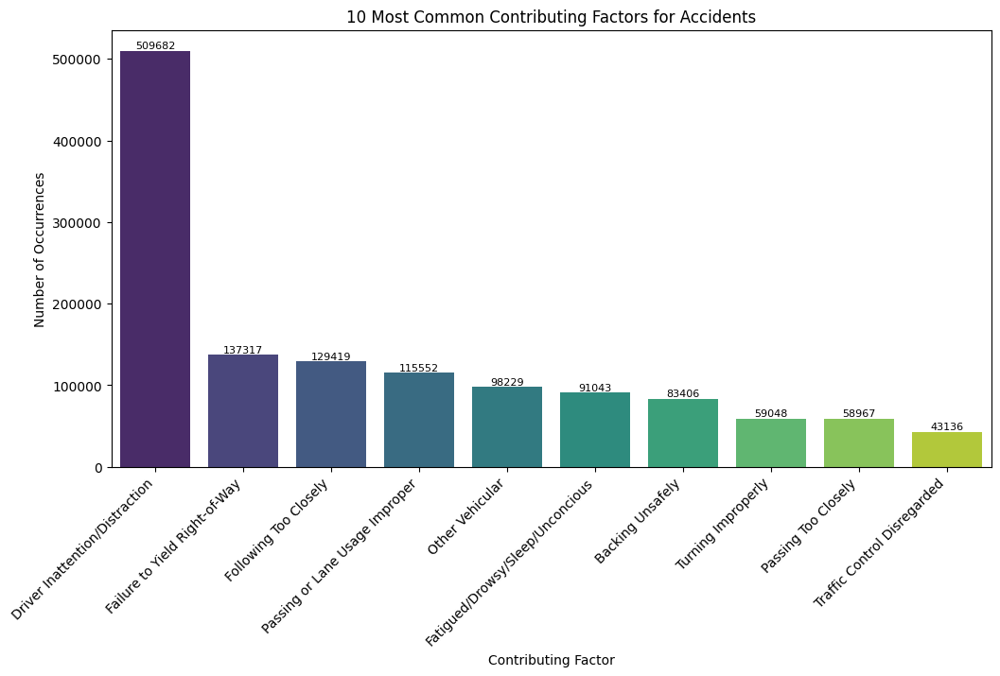

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of contributing factor columns to analyze
contributing_factor_columns = [
    'CONTRIBUTING FACTOR VEHICLE 1',
    'CONTRIBUTING FACTOR VEHICLE 2',
    'CONTRIBUTING FACTOR VEHICLE 3',
    'CONTRIBUTING FACTOR VEHICLE 4',
    'CONTRIBUTING FACTOR VEHICLE 5'
]

# Values to exclude
values_to_exclude = ['Not Applicable', 'Unspecified']

# Create a new DataFrame excluding specified values
data_filtered = data[contributing_factor_columns].replace(values_to_exclude, pd.NA)

# Flatten the DataFrame and drop NA values
data_filtered_stacked = data_filtered.stack().dropna()

# Count the occurrences of each contributing factor
top_contributing_factors_counts = data_filtered_stacked.value_counts().head(10)

# Plot the most common contributing factors
plt.figure(figsize=(12, 6))
sns.barplot(x = top_contributing_factors_counts.index, y = top_contributing_factors_counts.values, palette='viridis')
plt.title('10 Most Common Contributing Factors for Accidents')
plt.xlabel('Contributing Factor')
plt.ylabel('Number of Occurrences')
plt.xticks(rotation=45, ha='right')

# Adding labels to the bars
for i, value in enumerate(top_contributing_factors_counts):
    plt.text(i, value + 10, f'{int(value)}', ha='center', va='bottom', fontsize=8)

plt.show()

Driver Inattention/Distraction is the leading contributing factor for accidents, accounting for nearly 25% of all accidents and followed by Factors to Yield Right-of-Way (6.7%), Following Too Closely (6.5%), Passing or Lane Usage Improper (5.7%), and Other Vehicular.

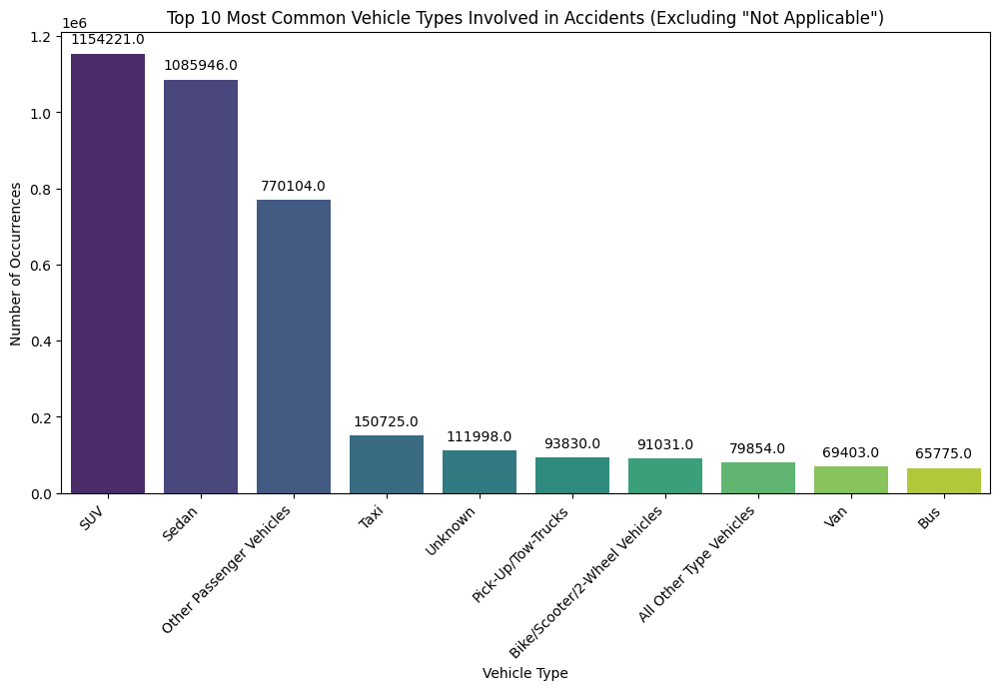

In [ ]:
# Extract relevant columns
vehicle_types_data = data[['VEHICLE TYPE CODE 1', 'VEHICLE TYPE CODE 2', 'VEHICLE TYPE CODE 3', 'VEHICLE TYPE CODE 4', 'VEHICLE TYPE CODE 5']]

# Concatenate vehicle types from all columns into one Series
vehicle_types_all = pd.concat([vehicle_types_data[col] for col in vehicle_types_data.columns], ignore_index=True)

# Drop 'Not Applicable' values
vehicle_types_all = vehicle_types_all[vehicle_types_all != 'Not Applicable']

# Get the most common vehicle types
top_vehicle_types = vehicle_types_all.value_counts().head(10)

# Plot a bar chart with count values
plt.figure(figsize=(12, 6))
barplot = sns.barplot(x=top_vehicle_types.index, y=top_vehicle_types.values, palette='viridis')
plt.title('Top 10 Most Common Vehicle Types Involved in Accidents (Excluding "Not Applicable")')
plt.xlabel('Vehicle Type')
plt.ylabel('Number of Occurrences')
plt.xticks(rotation=45, ha='right')

# Add count values on top of the bars
for p in barplot.patches:
    barplot.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.show()

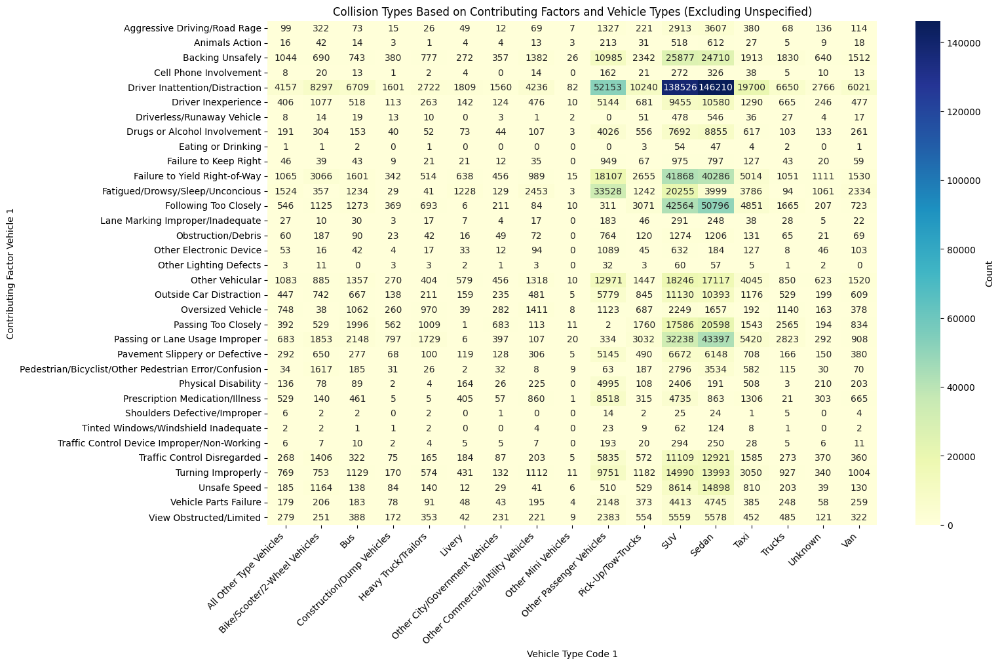

In [ ]:
# Exclude rows with 'Unspecified' in 'Contributing Factor Vehicle 1'
collision_data = data[data['CONTRIBUTING FACTOR VEHICLE 1'] != 'Unspecified']

# Extract relevant columns
collision_data = collision_data[['CONTRIBUTING FACTOR VEHICLE 1', 'CONTRIBUTING FACTOR VEHICLE 2',
                                 'VEHICLE TYPE CODE 1', 'VEHICLE TYPE CODE 2']]

# Drop rows with missing values in relevant columns
collision_data = collision_data.dropna(subset=['CONTRIBUTING FACTOR VEHICLE 1', 'VEHICLE TYPE CODE 1'])

# Create a contingency table
contingency_table = pd.crosstab(index=collision_data['CONTRIBUTING FACTOR VEHICLE 1'],
                                columns=collision_data['VEHICLE TYPE CODE 1'])

# Plot a heatmap
plt.figure(figsize=(15, 10))
heatmap = sns.heatmap(contingency_table, cmap='YlGnBu', annot=True, fmt='d', cbar_kws={'label': 'Count'})
plt.title('Collision Types Based on Contributing Factors and Vehicle Types (Excluding Unspecified)')
plt.xlabel('Vehicle Type Code 1')
plt.ylabel('Contributing Factor Vehicle 1')
plt.xticks(rotation=45, ha='right')

plt.show()

Our analysis of vehicle types revealed both SUVs and sedans shared (60%)
involvement in accidents, followed by trucks (20%), and other passenger vehicles (10%). This breakdown sheds light on the prevalent vehicle types contributing to collision incidents.

The line chart depicting yearly trends in the number of accidents reveals intriguing patterns over the examined period. From summer 2012 to 2020, the line consistently fluctuated between 17,000 to 19,000 accidents annually in NYC, indicating a stable baseline influenced by typical traffic patterns and seasonal variations. However, a notable deviation occurred in March-April 2020, recording a sharp decline to approximately
2700 accidents in NYC. This abrupt reduction aligns with the onset of the COVID-19 pandemic, as lockdowns and stay-at home orders led to a
substantial decrease in vehicular traffic and subsequent accidents.

Post-October 2020, the line exhibits consistent up-and-down fluctuations, ranging between 7500 to 9500 accidents per year. This period likely reflects the gradual return to normalcy as pandemic-related restrictions eased. The resurgence in accident numbers correlates with increased mobility, the resumption of economic activities, and a return to regular traffic volumes. With more people working from home, there has been a noticeable reduction in daily commuting in this period. Fewer individuals on the roads during typical rush hours contribute to lower traffic volumes and, consequently, a potential decrease in accidents. Dynamic factors such as changes in commuting patterns, business reopenings, and shifts in public behavior contribute to the observed trends.

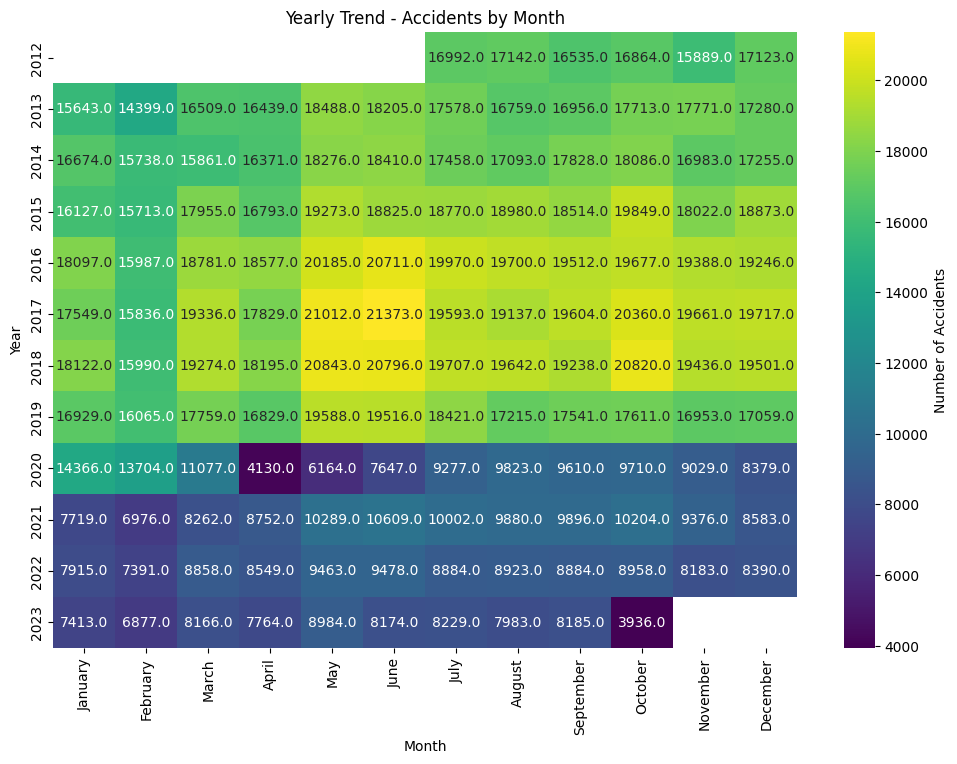

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'datetime_column' is the name of your datetime column in the DataFrame
data['CRASH DATE'] = pd.to_datetime(data['CRASH DATE'])

# Set the datetime column as the index
data.set_index('CRASH DATE', inplace=True)

# Group by year and month, and get the count of accidents
yearly_heatmap = data.groupby([data.index.year, data.index.month_name()]).size().unstack()

# Sort the columns (months) in ascending order
yearly_heatmap = yearly_heatmap.reindex(sorted(yearly_heatmap.columns, key=lambda x: pd.to_datetime(x, format='%B')), axis=1)

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(yearly_heatmap, cmap='viridis', annot=True, fmt='.1f', cbar_kws={'label': 'Number of Accidents'})
plt.title('Yearly Trend - Accidents by Month')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()


The heat map below underscores the elevated frequency of motor vehicle collisions in specific months, notably May, June, and October, within New York City. This pattern is influenced by a combination of seasonal, environmental, and societal factors. The spring months of May and June witness improving weather conditions, prompting increased outdoor activities and heightened traffic, thereby elevating the potential for accidents. These months also experience a surge in outdoor events, festivals, and recreational activities, contributing to heightened traffic volumes and accident rates.

May and June coincide with the conclusion of the school year, resulting in increased school-related activities, and events, and heightened parental involvement in driving their children, further amplifying traffic volumes and accident likelihood.

October, situated in the fall, similarly experiences increased traffic due to favorable weather conditions and heightened engagement in outdoor activities and events. Fall-related festivals and activities attract larger crowds, leading to a surge in vehicular traffic and an associated rise in accident rates. Moreover, October marks the commencement of holiday season preparations, contributing to increased shopping, events, and travel, particularly around holidays like Halloween, thereby heightening the likelihood of traffic incidents.


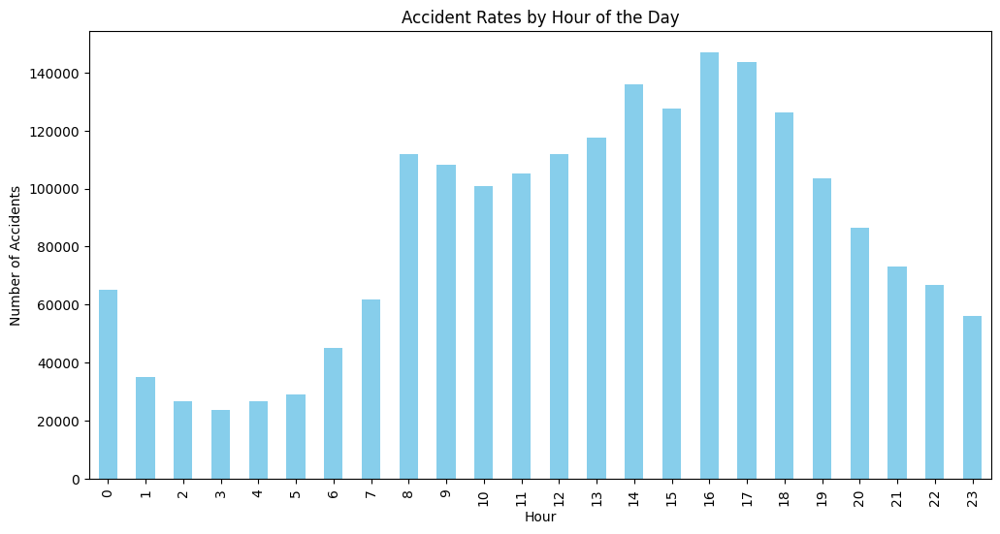

In [ ]:
# Extract hour from 'CRASH TIME'
data['Hour'] = data['CRASH TIME'].dt.hour

# Plot the bar chart
plt.figure(figsize=(12, 6))
data['Hour'].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title('Accident Rates by Hour of the Day')
plt.xlabel('Hour')
plt.ylabel('Number of Accidents')
plt.show()

The above visualization reveals high number of accidents in morning peak hours between 8am to 10am and evening peak hours between 4pm to 6pm.


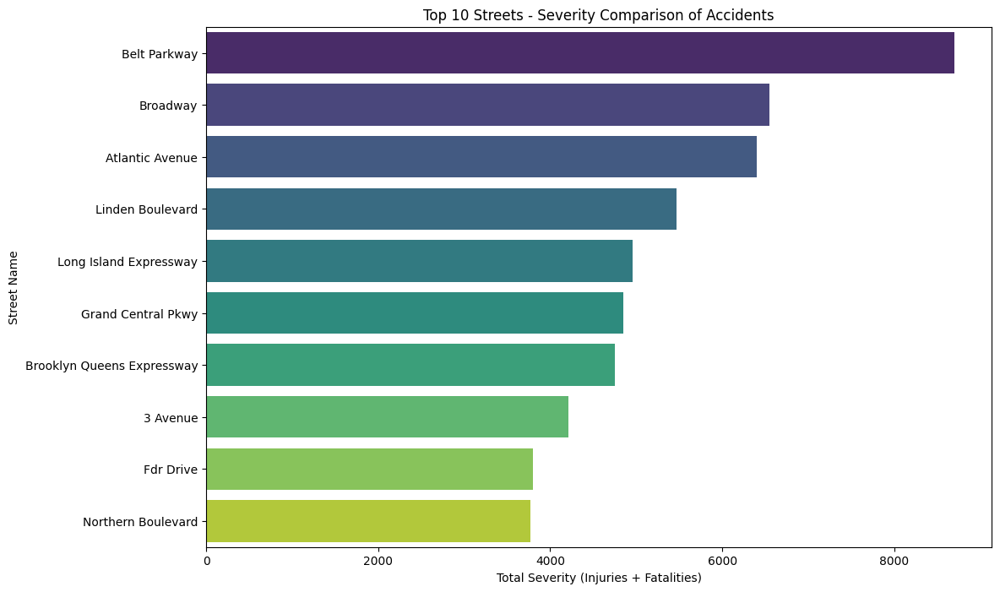

In [ ]:
# Group by street name and calculate total injuries and fatalities
street_severity_data = data.groupby('ON STREET NAME').agg({
    'NUMBER OF PERSONS INJURED': 'sum',
    'NUMBER OF PERSONS KILLED': 'sum'
}).reset_index()

# Calculate total severity (injuries + fatalities) for each street
street_severity_data['TOTAL SEVERITY'] = street_severity_data['NUMBER OF PERSONS INJURED'] + street_severity_data['NUMBER OF PERSONS KILLED']

# Sort the data by total severity in descending order
street_severity_data = street_severity_data.sort_values(by='TOTAL SEVERITY', ascending=False)

# Create a bar chart comparing the severity of accidents on different streets
plt.figure(figsize=(12, 8))
sns.barplot(x='TOTAL SEVERITY', y='ON STREET NAME', data=street_severity_data.head(10), palette='viridis')
plt.title('Top 10 Streets - Severity Comparison of Accidents')
plt.xlabel('Total Severity (Injuries + Fatalities)')
plt.ylabel('Street Name')
plt.show()

Topping the list is Belt Parkway, registering an alarming 8000+ severe accidents. The heightened incidence on the Belt Parkway necessitates an
in-depth investigation into factors contributing to the severity, be it high traffic volumes, complex intersections, or specific road conditions. Notably, the Belt Parkway has faced chronic congestion since the 1960s, driven by its crucial role in connecting JFK International Airport to Long Island, Queens, and Brooklyn, including Manhattan. Despite running through a narrow green belt, it traverses densely populated areas, adding complexity to traffic conditions.

Following closely are Broadway and Atlantic Avenue, securing the second and third positions with approximately 6700 and 6500 severe cases, respectively. These figures highlight the pressing need for targeted safety measures on these streets, potentially addressing challenges such as heavy pedestrian traffic, intricate road layouts, or concentrated commercial activities. Broadway, spanning the entire length of Manhattan at 33 miles, naturally incurs a significant number of motor vehicle
accidents.

Linden Street occupies the fourth spot with around 5700 severe cases, prompting a focused analysis of road design, traffic flow, and potential contributing factors to formulate effective safety interventions.

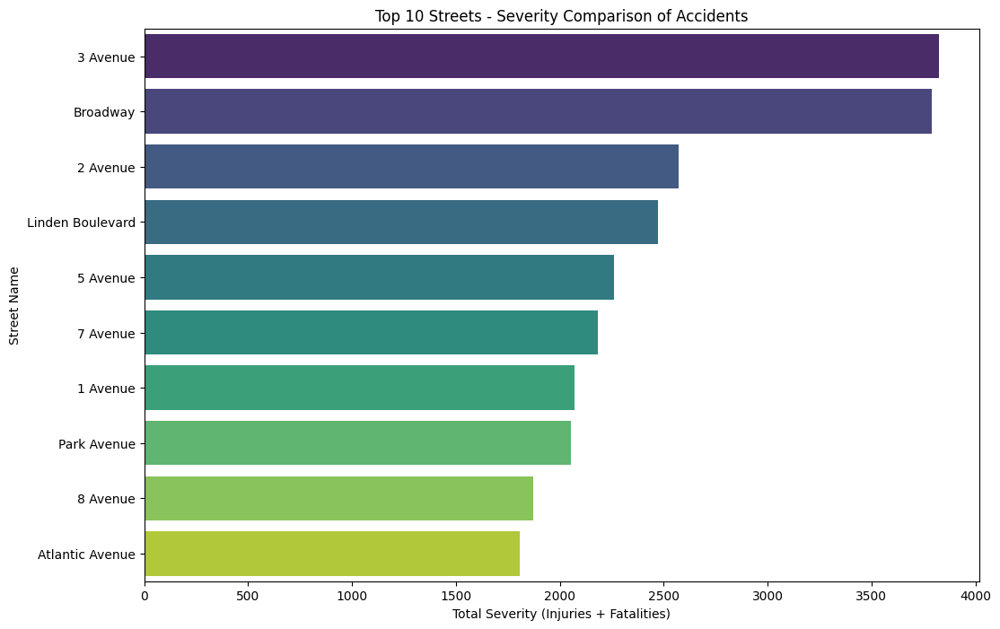

In [ ]:
# Group by street name and calculate total injuries and fatalities
street_severity_data = data.groupby('CROSS STREET NAME').agg({
    'NUMBER OF PERSONS INJURED': 'sum',
    'NUMBER OF PERSONS KILLED': 'sum'
}).reset_index()

# Calculate total severity (injuries + fatalities) for each street
street_severity_data['TOTAL SEVERITY'] = street_severity_data['NUMBER OF PERSONS INJURED'] + street_severity_data['NUMBER OF PERSONS KILLED']

# Sort the data by total severity in descending order
street_severity_data = street_severity_data.sort_values(by='TOTAL SEVERITY', ascending=False)

# Create a bar chart comparing the severity of accidents on different streets
plt.figure(figsize=(12, 8))
sns.barplot(x='TOTAL SEVERITY', y='CROSS STREET NAME', data=street_severity_data.head(10), palette='viridis')
plt.title('Top 10 Streets - Severity Comparison of Accidents')
plt.xlabel('Total Severity (Injuries + Fatalities)')
plt.ylabel('Street Name')
plt.show()

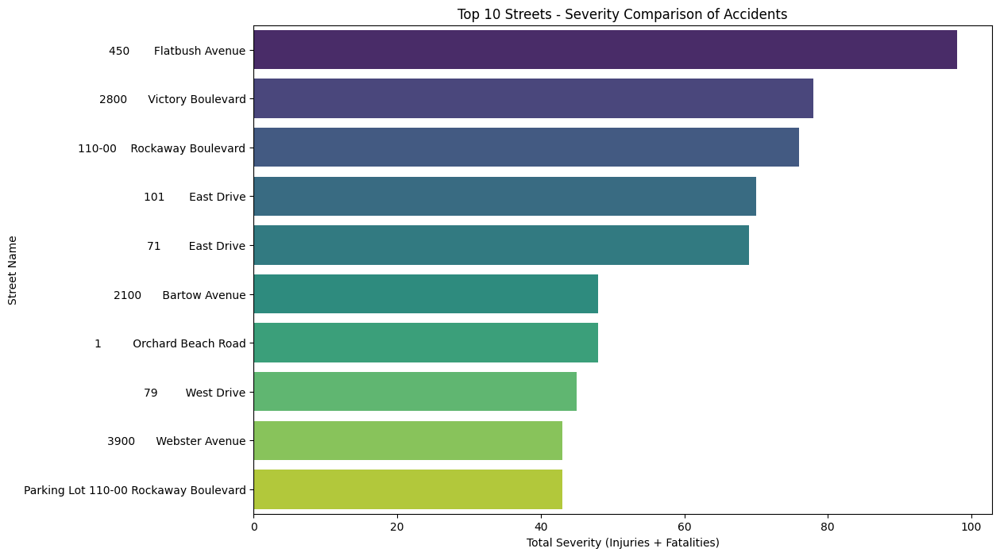

In [ ]:
# Group by street name and calculate total injuries and fatalities
street_severity_data = data.groupby('OFF STREET NAME').agg({
    'NUMBER OF PERSONS INJURED': 'sum',
    'NUMBER OF PERSONS KILLED': 'sum'
}).reset_index()

# Calculate total severity (injuries + fatalities) for each street
street_severity_data['TOTAL SEVERITY'] = street_severity_data['NUMBER OF PERSONS INJURED'] + street_severity_data['NUMBER OF PERSONS KILLED']

# Sort the data by total severity in descending order
street_severity_data = street_severity_data.sort_values(by='TOTAL SEVERITY', ascending=False)

# Create a bar chart comparing the severity of accidents on different streets
plt.figure(figsize=(12, 8))
sns.barplot(x='TOTAL SEVERITY', y='OFF STREET NAME', data=street_severity_data.head(10), palette='viridis')
plt.title('Top 10 Streets - Severity Comparison of Accidents')
plt.xlabel('Total Severity (Injuries + Fatalities)')
plt.ylabel('Street Name')
plt.show()

In [ ]:
# Assuming your DataFrame is named 'data'
data.reset_index(inplace=True)
data.head()

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,2021-09-11,2023-12-25 02:39:00,NaN,NaN,NaN,NaN,NaN,Whitestone Expressway,20 Avenue,NaN,...,Unspecified,Not Applicable,Not Applicable,Not Applicable,4455765,Sedan,Sedan,Not Applicable,Not Applicable,Not Applicable
1,2022-03-26,2023-12-25 11:45:00,NaN,NaN,NaN,NaN,NaN,Queensboro Bridge Upper,NaN,NaN,...,Not Applicable,Not Applicable,Not Applicable,Not Applicable,4513547,Sedan,Not Applicable,Not Applicable,Not Applicable,Not Applicable
2,2022-06-29,2023-12-25 06:55:00,NaN,NaN,NaN,NaN,NaN,Throgs Neck Bridge,NaN,NaN,...,Unspecified,Not Applicable,Not Applicable,Not Applicable,4541903,Sedan,Pick-Up/Tow-Trucks,Not Applicable,Not Applicable,Not Applicable
3,2021-09-11,2023-12-25 09:35:00,BROOKLYN,11208.0,40.667202,-73.866500,"(40.667202, -73.8665)",NaN,NaN,1211 Loring Avenue,...,Not Applicable,Not Applicable,Not Applicable,Not Applicable,4456314,Sedan,Not Applicable,Not Applicable,Not Applicable,Not Applicable
4,2021-12-14,2023-12-25 08:13:00,BROOKLYN,11233.0,40.683304,-73.917274,"(40.683304, -73.917274)",Saratoga Avenue,Decatur Street,NaN,...,Not Applicable,Not Applicable,Not Applicable,Not Applicable,4486609,SUV,Not Applicable,Not Applicable,Not Applicable,Not Applicable


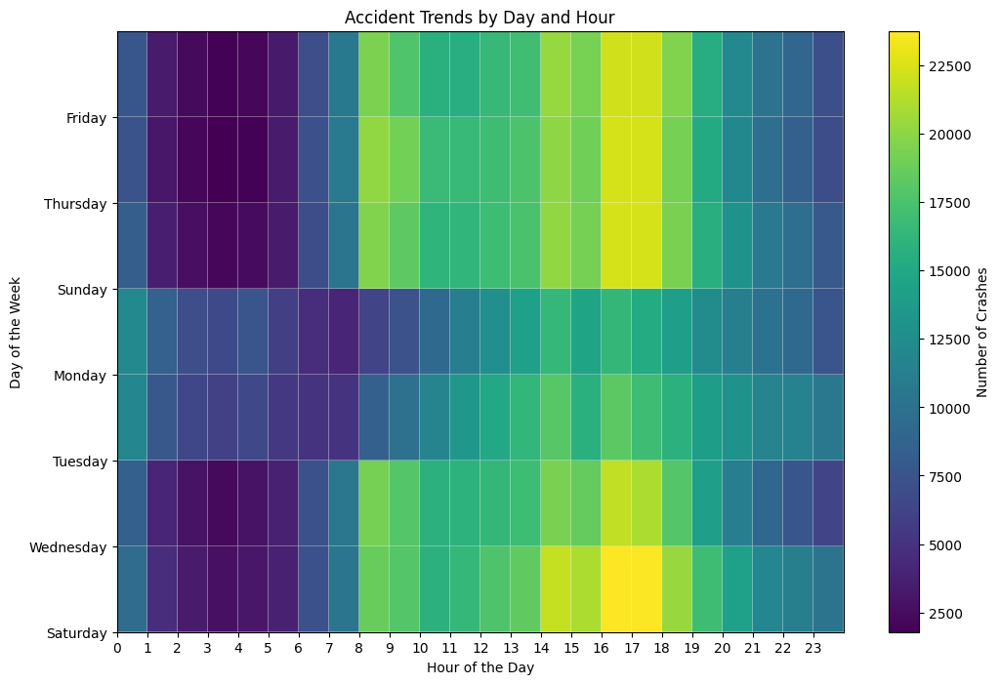

In [ ]:
# Extracting day of the week and hour of the day
data['DayOfWeek'] = data['CRASH DATE'].dt.day_name()
data['HourOfDay'] = pd.to_datetime(data['CRASH TIME']).dt.hour

# Grouping by day of the week and hour of the day
day_hour_counts = data.groupby(['DayOfWeek', 'HourOfDay']).size().unstack()

# Plotting a heatmap to visualize the trends
plt.figure(figsize=(12, 8))
plt.pcolor(day_hour_counts, cmap='viridis', edgecolors='white', linewidths=0.1)
plt.title('Accident Trends by Day and Hour')
plt.xlabel('Hour of the Day')
plt.ylabel('Day of the Week')
plt.xticks(range(24), range(24))
plt.yticks(range(7), data['DayOfWeek'].unique())
plt.colorbar(label='Number of Crashes')
plt.show()

Firstly, Fridays and Saturdays stand out as days with higher accident rates, likely due to increased social activities and alcohol consumption during these days. The combination of people being out socializing, and potentially consuming alcohol elevates the risk of accidents during these
periods.

Secondly, the afternoon rush hour between 4 pm and 7 pm exhibited an increased risk of accidents, as did Friday and Saturday nights. This heightened risk during the afternoon rush hour can be attributed to the high volume of commuters on the roads, potentially leading to congestion, increased stress, and a greater likelihood of accidents.

Thirdly, the gradual decrease in the number of accidents throughout the day may be linked to fatigue. Towards the end of the day, people tend to be more tired, and fatigue can impair their ability to drive safely.

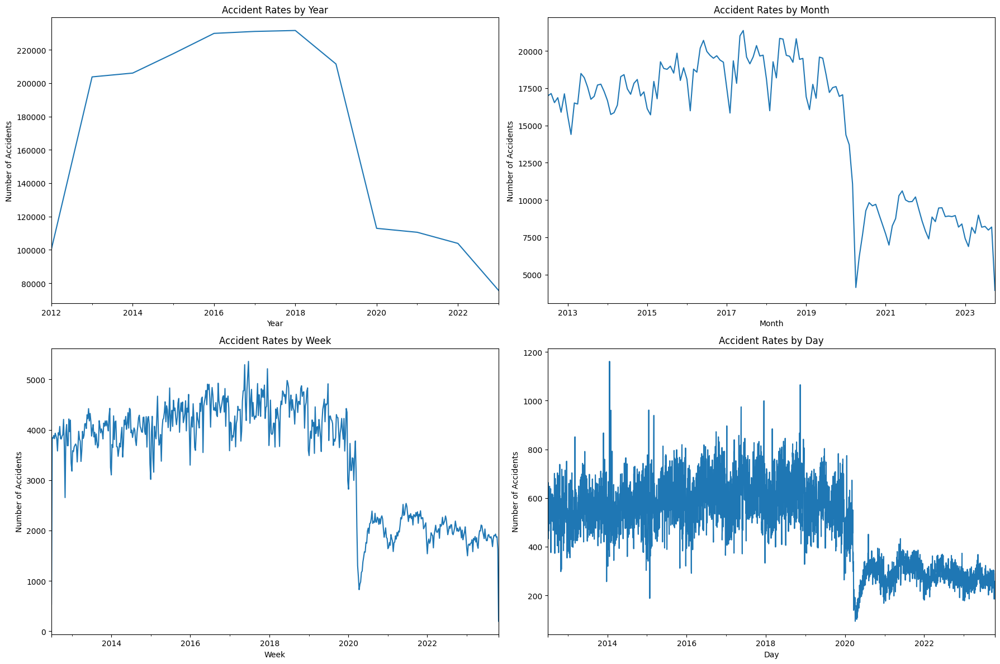

In [ ]:
# Set 'CRASH DATE' as the index for time-series analysis
data.set_index('CRASH DATE', inplace=True)

# Resample the data to get the count of accidents by year, month, week, and day
accidents_by_year = data.resample('Y').size()
accidents_by_month = data.resample('M').size()
accidents_by_week = data.resample('W').size()
accidents_by_day = data.resample('D').size()

# Plot the time-series data
plt.figure(figsize=(18, 12))

plt.subplot(2, 2, 1)
accidents_by_year.plot(title='Accident Rates by Year', xlabel='Year', ylabel='Number of Accidents', legend=False)

plt.subplot(2, 2, 2)
accidents_by_month.plot(title='Accident Rates by Month', xlabel='Month', ylabel='Number of Accidents', legend=False)

plt.subplot(2, 2, 3)
accidents_by_week.plot(title='Accident Rates by Week', xlabel='Week', ylabel='Number of Accidents', legend=False)

plt.subplot(2, 2, 4)
accidents_by_day.plot(title='Accident Rates by Day', xlabel='Day', ylabel='Number of Accidents', legend=False)

plt.tight_layout()
plt.show()

The line chart depicting yearly trends in the number of accidents reveals intriguing patterns over the examined period. From summer 2012 to 2020, the line consistently fluctuated between 17,000 to 19,000 accidents annually in NYC, indicating a stable baseline influenced by typical traffic patterns and seasonal variations. However, a notable deviation occurred in March-April 2020, recording a sharp decline to approximately 2700 accidents in NYC. This abrupt reduction aligns with the onset of the COVID-19 pandemic, as lockdowns and stay-at home orders led to a substantial decrease in vehicular traffic and subsequent accidents.

Post-October 2020, the line exhibits consistent up-and-down fluctuations, ranging between 7500 to 9500 accidents per year. This period likely reflects the gradual return to normalcy as pandemic-related restrictions eased. The resurgence in accident numbers correlates with increased mobility, the resumption of economic activities, and a return to regular traffic volumes. With more people working from home, there has been a noticeable reduction in daily commuting in this period. Fewer individuals on the roads during typical rush hours contribute to lower traffic volumes and, consequently, a potential decrease in accidents. Dynamic factors such as changes in commuting patterns, business reopenings, and shifts in public behavior contribute to the observed trends.

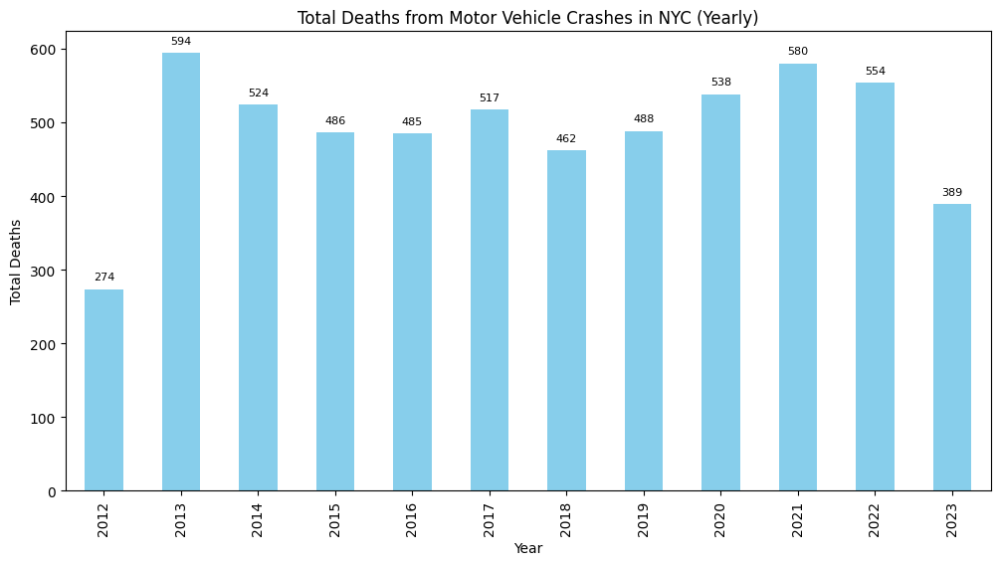

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Extract the year from the 'CRASH DATE' column
data['YEAR'] = data['CRASH DATE'].dt.year

# Create a new column for total deaths
data['TOTAL DEATHS'] = data['NUMBER OF PERSONS KILLED'] + data['NUMBER OF PEDESTRIANS KILLED'] + data['NUMBER OF CYCLIST KILLED'] + data['NUMBER OF MOTORIST KILLED']

# Group by year and sum the total deaths
yearly_death_counts = data.groupby('YEAR')['TOTAL DEATHS'].sum()

# Plotting
plt.figure(figsize=(12, 6))
yearly_death_counts.plot(kind='bar', color='skyblue')
plt.title('Total Deaths from Motor Vehicle Crashes in NYC (Yearly)')
plt.xlabel('Year')
plt.ylabel('Total Deaths')

# Adding labels to the bars
for i, value in enumerate(yearly_death_counts):
    plt.text(i, value + 10, f'{int(value)}', ha='center', va='bottom', fontsize=8)

# Show the plot
plt.show()

Despite a decrease in traffic volume on the roads amid the COVID-19 pandemic, the number of fatalities(deaths) resulting from motor vehicle
collisions in New York City showed unaffected changes during and post-2020.

Crashes resulting in severe or fatal injuries, specifically linked to speeding, experienced a notable rise. This increase is primarily associated with the reduced traffic volume resulting from lockdown measures and the adoption of teleworking, creating conditions conducive to speeding. However, it's crucial to acknowledge that additional factors such as mental health issues like depression, emergency response delays due to increased patient hospitalization and the heightened busyness of emergency vehicles, and other factors may also contribute to high-risk driving behavior during the pandemic.

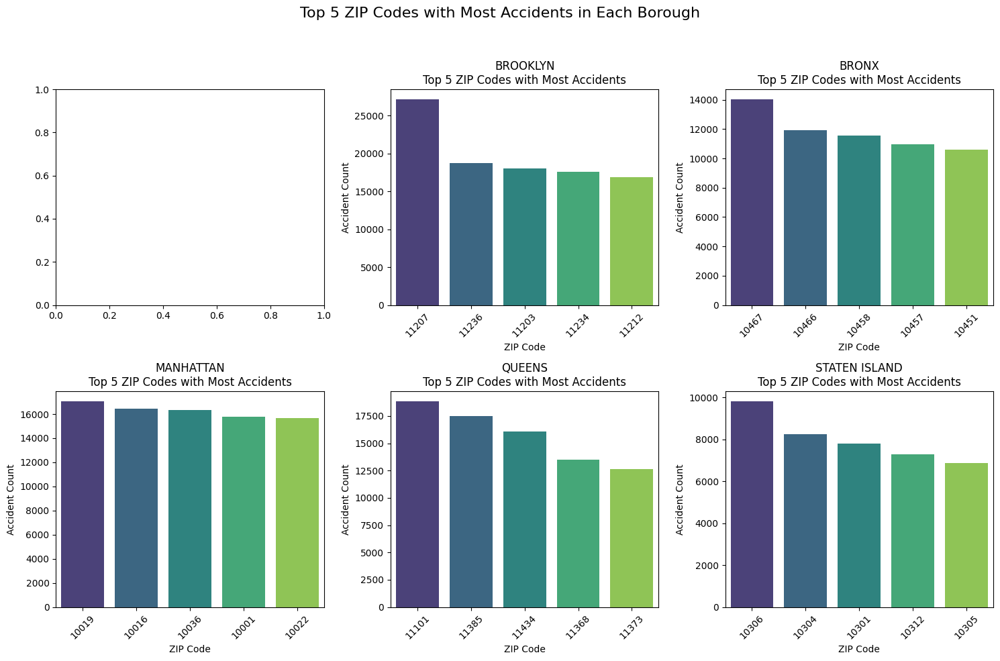

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming you have a DataFrame 'data' with columns 'BOROUGH', 'ZIP CODE', and any other relevant columns
# Example: data[['BOROUGH', 'ZIP CODE']]

# Convert 'ZIP CODE' to string and handle missing values
data['ZIP CODE'] = data['ZIP CODE'].fillna('').astype(str).str.split('.').str[0]

# Initialize subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
fig.suptitle('Top 5 ZIP Codes with Most Accidents in Each Borough', fontsize=16)

# Iterate over each borough and create a bar plot
for i, borough in enumerate(data['BOROUGH'].unique()):
    ax = axes[i//3, i%3]

    # Filter data for the current borough
    borough_data = data[data['BOROUGH'] == borough]

    # Group by ZIP code and count accidents
    zip_accidents = borough_data['ZIP CODE'].value_counts().head(5)

    if not zip_accidents.empty:
        # Plot the bar chart
        sns.barplot(x=zip_accidents.index, y=zip_accidents.values, ax=ax, palette='viridis')
        ax.set_title(f'{borough}\nTop 5 ZIP Codes with Most Accidents')
        ax.set_xlabel('ZIP Code')
        ax.set_ylabel('Accident Count')
        ax.tick_params(axis='x', rotation=45)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


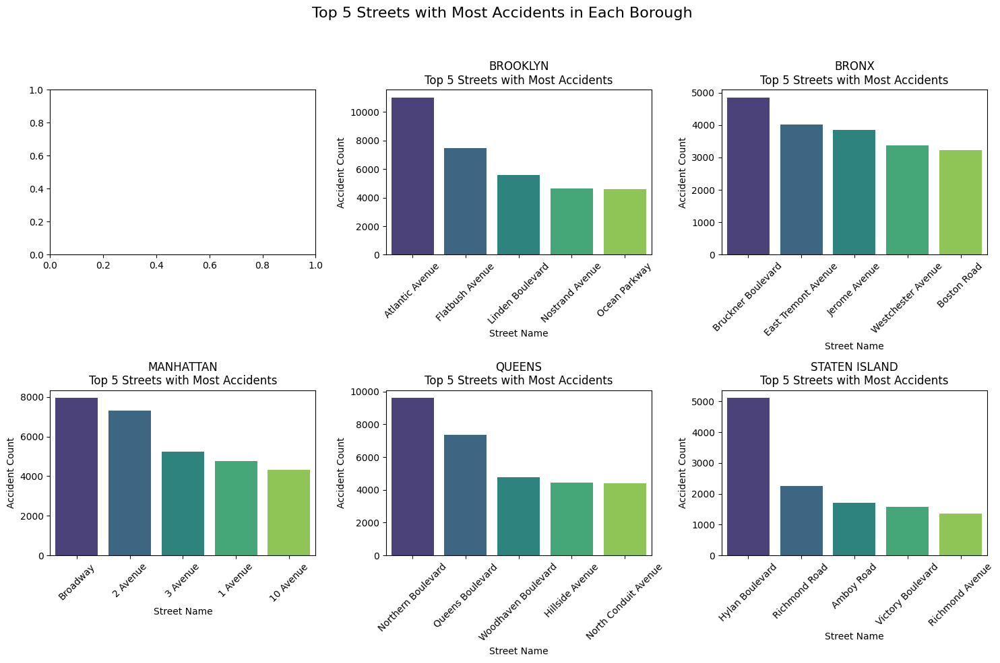

In [ ]:
# Initialize subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
fig.suptitle('Top 5 Streets with Most Accidents in Each Borough', fontsize=16)

# Iterate over each borough and create a bar plot
for i, borough in enumerate(data['BOROUGH'].unique()):
    ax = axes[i//3, i%3]

    # Filter data for the current borough
    borough_data = data[data['BOROUGH'] == borough]

    # Group by street and count accidents
    street_accidents = borough_data['ON STREET NAME'].value_counts().head(5)

    if not street_accidents.empty:
        # Plot the bar chart
        sns.barplot(x=street_accidents.index, y=street_accidents.values, ax=ax, palette='viridis')
        ax.set_title(f'{borough}\nTop 5 Streets with Most Accidents')
        ax.set_xlabel('Street Name')
        ax.set_ylabel('Accident Count')
        ax.tick_params(axis='x', rotation=45)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()